# Data import and cleaning

### Importing packages

In [2]:
import glob
import matplotlib.pyplot as plt
import seaborn as sns
import math
import numpy as np
import itertools
import os
import pandas as pd
import pickle
import shutil
import warnings

from datetime import date, datetime
from tabulate import tabulate
from tkinter import *
from tkinter import filedialog

from lmfit import Minimizer, Parameters, report_fit, minimize
from lmfit.models import SplitLorentzianModel, LinearModel
from lmfit import Model

from scipy.signal import argrelmax,hilbert, find_peaks, peak_widths
from scipy import optimize
from scipy.stats import norm
from scipy import stats
from scipy.optimize import curve_fit

from uncertainties import ufloat,unumpy
from uncertainties.umath import *

pd.set_option('display.max_rows', 50)
warnings.filterwarnings('ignore')
plt.style.use('ggplot')
%matplotlib inline

### Selecting data folder
#### Creates result folder for output saving

In [3]:
root = Tk()
root.withdraw()
folder_path = filedialog.askdirectory()
print('Folder path: ',folder_path)

file_path = folder_path + '/**/*.csv'
result_folder = '/res'
folder = folder_path + result_folder
if os.path.isdir(folder):
    print('Result folder already exists, cleaning...\n (If an error occurs, consider remove Result folder manually.)')
    try:
        shutil.rmtree(folder)
    except OSError as e:
        print("Error: %s : %s" % (folder, e.strerror))
    os.mkdir(folder)
    print ('Result folder created.')
else:
    os.mkdir(folder)
    print ('Result folder created.')
    
print('---------------------------------------------------------------------------\n')
print('Result folder path: ',folder)
print('---------------------------------------------------------------------------\n')

### Logging
log_file = folder + '/log.txt'

lf = open(log_file, 'w')

with open(log_file, 'w') as f:
    f.write(str(datetime.now()) + ' - ' + folder)

lf.close()

Folder path:  C:/Users/aless/OneDrive/Documentos/UCS/Mestrado/Fase2/Notebooks/Analix/external-agents-detector/app/data/source_data
Result folder created.
---------------------------------------------------------------------------

Result folder path:  C:/Users/aless/OneDrive/Documentos/UCS/Mestrado/Fase2/Notebooks/Analix/external-agents-detector/app/data/source_data/res
---------------------------------------------------------------------------



### Acquiring individual files addresses 
#### Splits into group, sensor and time, adding a hash column used for filtering data

In [4]:
files = pd.DataFrame(glob.glob(file_path,recursive = True),columns = ['Path'])
address = []

for index, row in files.iterrows():
    data = []
    data.append(row['Path'])
    address.append(data)

addresses = pd.DataFrame(
    address, 
    columns = ['address'])

print('Main data frame shape: ', addresses.shape)

#for item in addresses.address:
#    print(item)
    
group_name = []
sensor_name = []
time_name = []
hash_name = []

for path in addresses['address']:
    group_name_lst = []
    sensor_name_lst = []
    time_name_lst = []
    hash_name_lst = []
    
    group_name_lst.append(path.split('/')[-1].split('\\')[-3])
    sensor_name_lst.append(path.split('/')[-1].split('\\')[-2])
    
    k = path.rfind('\\')
    time_name_lst.append(int(path[k + 1:].replace('.CSV', '')))
    hash_name_lst.append(
        path.split('/')[-1].split('\\')[-3] + \
        '-' + \
        str(path.split('/')[-1].split('\\')[-2]) + \
        '-' + \
        str(path[k + 1:].replace('.CSV', ''))
    )
    
    time_name.append(time_name_lst)
    sensor_name.append(sensor_name_lst)
    group_name.append(group_name_lst)
    hash_name.append(hash_name_lst)

group = pd.DataFrame(group_name, columns=['group'])
sensor = pd.DataFrame(sensor_name, columns=['sensor'])
time = pd.DataFrame(time_name, columns=['time'])
hashed = pd.DataFrame(hash_name, columns=['hash'])

addresses['group'] = group
addresses['sensor'] = sensor
addresses['time'] = time
addresses['hash'] = hashed

#addresses['sensor'] = pd.to_numeric(addresses['sensor'])

addresses = addresses.sort_values(
    by=['group','sensor','time','address'], 
    ignore_index=True, 
    ascending=True
)

print('---------------------------------------------------------------------------\n')

text = '''
Analysis
'''

#text = addresses['Sensor'].unique()

print(text + '\n')

print('---------------------------------------------------------------------------\n')

addresses.head()

Main data frame shape:  (42, 1)
---------------------------------------------------------------------------


Analysis


---------------------------------------------------------------------------



,address,group,sensor,time,hash
0,C:/Users/aless/OneDrive/Documentos/UCS/Mestrad...,C,1,0,C-1-0
1,C:/Users/aless/OneDrive/Documentos/UCS/Mestrad...,C,1,5,C-1-5
2,C:/Users/aless/OneDrive/Documentos/UCS/Mestrad...,C,1,10,C-1-10
3,C:/Users/aless/OneDrive/Documentos/UCS/Mestrad...,C,1,15,C-1-15
4,C:/Users/aless/OneDrive/Documentos/UCS/Mestrad...,C,1,20,C-1-20


#### Provides intel on quantity of files to be scanned

In [5]:
space = len(addresses.index)
print('Space: ', space)
fst_counter = 0
today = date.today()

### Logging

files_address_list = f'{str(datetime.now())} - Address list - OK \n'

with open(log_file, 'a') as f:
    f.write(files_address_list)
    f.close()

addresses = addresses.reset_index(drop=True).set_index('address')

Space:  42


### Scans the addresses data frame, reads data of each file and assembles them into a combined data frame, that contains frequency and signal data
### Also, rescales frequency values to signal's order of magnitude (multiplied by $1 \times 10^{-6}$)

In [6]:
dfs = []

for path in addresses.index:
    global combined_df
    fst_counter += 1
    param = path
    
    group = addresses.loc[path,'group']
    sensor = addresses.loc[path,'sensor']
    time = addresses.loc[path,'time']
    hashed = addresses.loc[path,'hash']
 
    df_import = pd.DataFrame(pd.read_csv(param,skiprows = range(0, 2)))
    df_import.drop(df_import.columns[2], axis = 1, inplace = True)
    df_import.columns.values[0] = 'frequency'
    df_import.columns.values[1] = 'signal'
    df_import['group'] = group
    df_import['sensor'] = sensor                                          
    df_import['time'] = time
    df_import['hash'] = hashed
    
    dfs.append(df_import)

combined_df = pd.concat(dfs,ignore_index=True)

combined_dataset = f'{str(datetime.now())} - Combined dataset - OK \n'

with open(log_file, 'a') as f:
    f.write(combined_dataset)
    f.close()
combined_df['frequency'] = combined_df['frequency'] * 1.e-6

In [7]:
combined_df.head()

,frequency,signal,group,sensor,time,hash
0,0.4200,0.557114,C,1,0,C-1-0
1,0.4202,0.558667,C,1,0,C-1-0
2,0.4204,0.560101,C,1,0,C-1-0
3,0.4206,0.560883,C,1,0,C-1-0
4,0.4208,0.561223,C,1,0,C-1-0


### Exports combined and addresses data frames to results folder

In [8]:
datasets_export = f'{str(datetime.now())} - Combined and address datasets - EXPORTED \n'

with open(log_file, 'a') as f:
    f.write(datasets_export)
    f.close()
    
combined_df.to_csv(folder + '/combined_df.csv', sep=';', index=False)
addresses.to_csv(folder + '/addresses.csv', sep=';', index=False)

# Defining functions

### Split Lorentzian funcion
#### Function used to fit data to model

$$
f(x; A, \mu, \sigma, \sigma_r) = \frac{2 A}{\pi (\sigma+\sigma_r)} \big[\frac{\sigma^2}{(x - \mu)^2 + \sigma^2} * H(\mu-x) + \frac{\sigma_r^2}{(x - \mu)^2 + \sigma_r^2} * H(x-\mu)\big] + (m x + b)
$$

In [9]:
# Split Lorentzian function
def SplitLorentzianFunc(x):
    global aux
    A = ((2 * aux[0]) / (np.pi * (aux[2] + aux[3])))
    B = ((aux[2] ** 2) / (((x - aux[1]) ** 2) + aux[2] ** 2))
    C = ((aux[3] ** 2) / (((x - aux[1]) ** 2) + aux[3] ** 2))
    D = np.heaviside(aux[1] - x, 0)
    E = np.heaviside(x - aux[1], 0)
    F = (aux[4] * x + aux[5])

    return (A * ((B*D) + (C*E))) + F

# Slicing data for analysis

### Applies fitting model (Lorentzian) to each experimental dataset, retrieving a evaluation dataset based on the model. After fitting, applies an optimization function over a Monte Carlo Simulation to find the interesting point: the minimized frequency used to evaluate delocation on passing time of experiment


#### For each instance of time, plots original data, accuracy rate between Monte Carlo Simulation average frequency and minimized average frequency, and fitted curve over original data, pinpointing those values alongside minimal point from original data.

[[Model]]
    (Model(linear) + Model(split_lorentzian))
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 57
    # data points      = 26
    # variables        = 6
    chi-square         = 1.0762e-06
    reduced chi-square = 5.3809e-08
    Akaike info crit   = -430.004968
    Bayesian info crit = -422.456389
    R-squared          = 0.99987217
[[Variables]]
    amplitude: -6.5548e-04 +/- 1.1665e-05 (1.78%) (init = 0.000562349)
    center:     0.43904624 +/- 6.0215e-06 (0.00%) (init = 0.4389636)
    sigma:      0.00229330 +/- 3.7278e-05 (1.63%) (init = 0.0025)
    sigma_r:    0.00216150 +/- 2.9597e-05 (1.37%) (init = 0.0025)
    fwhm:       0.00445480 +/- 4.0914e-05 (0.92%) == 'sigma+sigma_r'
    height:    -0.09367237 +/- 8.2562e-04 (0.88%) == '2*amplitude/3.1415927/max(0.0000000, (sigma+sigma_r))'
    slope:     -4.08629682 +/- 0.23477583 (5.75%) (init = 0)
    intercept:  2.36979826 +/- 0.10330544 (4.36%) (init = 0.4819135)
[[Correlations]] (unreported corr

<Figure size 640x480 with 0 Axes>

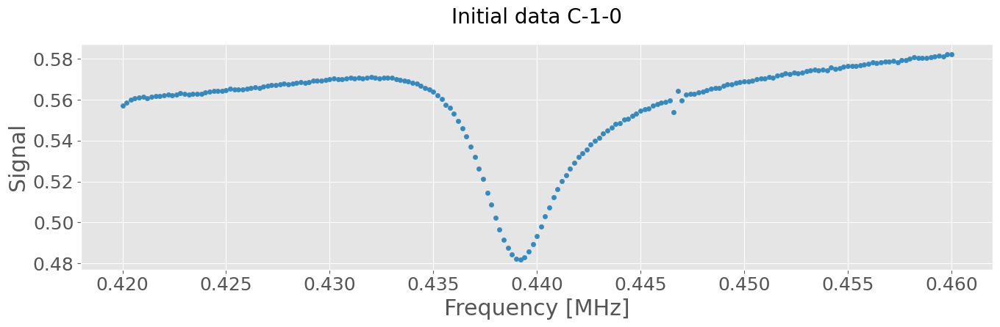

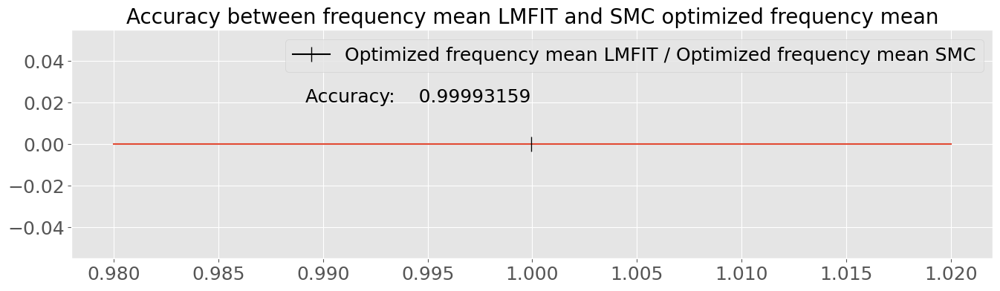

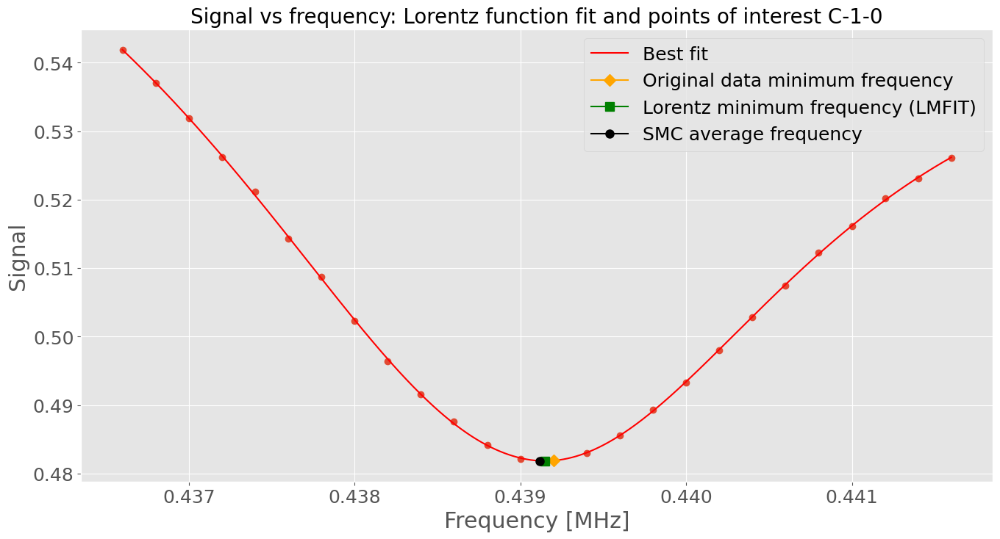



Eval appended.
--------------------------------

[[Model]]
    (Model(linear) + Model(split_lorentzian))
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 57
    # data points      = 26
    # variables        = 6
    chi-square         = 1.1045e-06
    reduced chi-square = 5.5225e-08
    Akaike info crit   = -429.329741
    Bayesian info crit = -421.781162
    R-squared          = 0.99986509
[[Variables]]
    amplitude: -6.3297e-04 +/- 1.1302e-05 (1.79%) (init = 0.0005546912)
    center:     0.43900386 +/- 6.1783e-06 (0.00%) (init = 0.4389636)
    sigma:      0.00222350 +/- 3.6799e-05 (1.66%) (init = 0.0025)
    sigma_r:    0.00216616 +/- 2.9776e-05 (1.37%) (init = 0.0025)
    fwhm:       0.00438966 +/- 4.0547e-05 (0.92%) == 'sigma+sigma_r'
    height:    -0.09179734 +/- 8.1081e-04 (0.88%) == '2*amplitude/3.1415927/max(0.0000000, (sigma+sigma_r))'
    slope:     -3.94616438 +/- 0.23217211 (5.88%) (init = 0)
    intercept:  2.30646523 +/- 0.10217323 (4.43%) 

<Figure size 640x480 with 0 Axes>

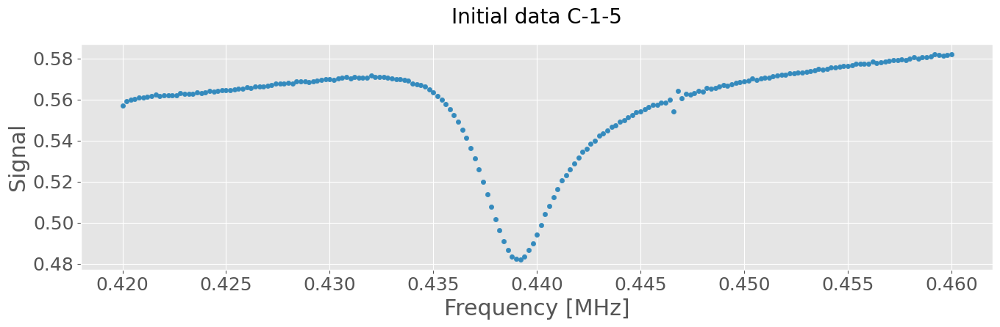

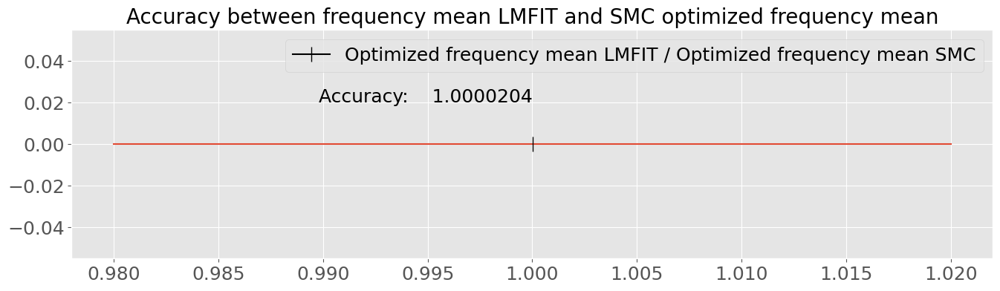

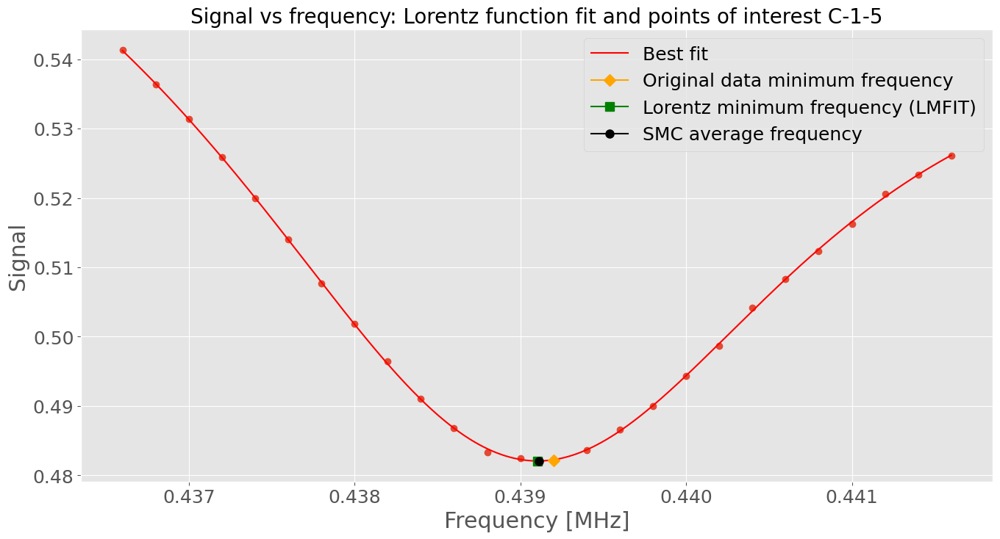



Eval appended.
--------------------------------

[[Model]]
    (Model(linear) + Model(split_lorentzian))
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 50
    # data points      = 26
    # variables        = 6
    chi-square         = 1.3471e-06
    reduced chi-square = 6.7355e-08
    Akaike info crit   = -424.167054
    Bayesian info crit = -416.618475
    R-squared          = 0.99983315
[[Variables]]
    amplitude: -6.3669e-04 +/- 1.2865e-05 (2.02%) (init = 0.0005471034)
    center:     0.43904097 +/- 6.8769e-06 (0.00%) (init = 0.4389636)
    sigma:      0.00228377 +/- 4.2402e-05 (1.86%) (init = 0.0025)
    sigma_r:    0.00214615 +/- 3.3191e-05 (1.55%) (init = 0.0025)
    fwhm:       0.00442993 +/- 4.6321e-05 (1.05%) == 'sigma+sigma_r'
    height:    -0.09149793 +/- 9.1336e-04 (1.00%) == '2*amplitude/3.1415927/max(0.0000000, (sigma+sigma_r))'
    slope:     -3.98584047 +/- 0.26048592 (6.54%) (init = 0)
    intercept:  2.32417388 +/- 0.11463291 (4.93%) 

<Figure size 640x480 with 0 Axes>

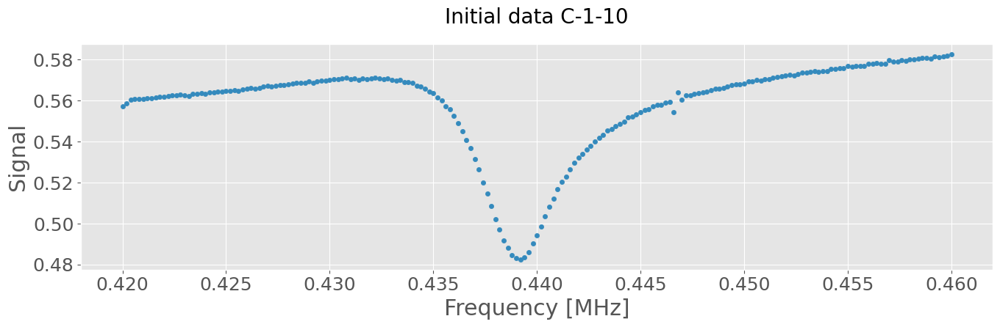

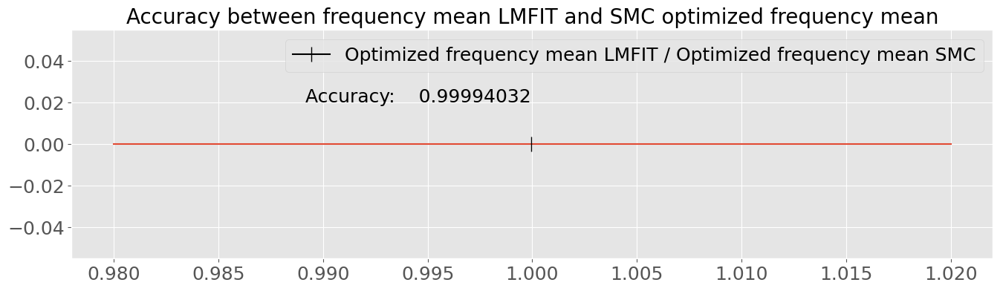

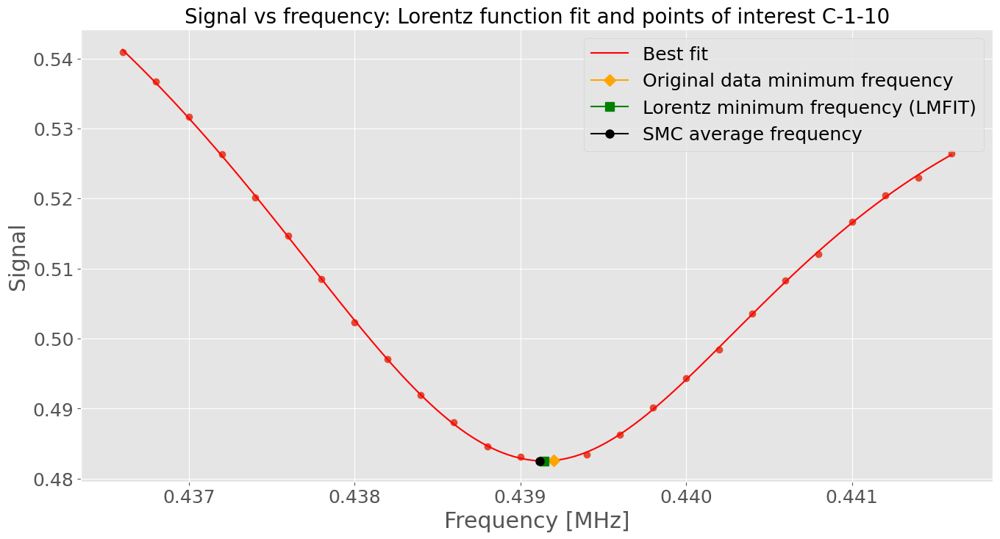



Eval appended.
--------------------------------

[[Model]]
    (Model(linear) + Model(split_lorentzian))
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 94
    # data points      = 26
    # variables        = 6
    chi-square         = 1.5013e-06
    reduced chi-square = 7.5066e-08
    Akaike info crit   = -421.348875
    Bayesian info crit = -413.800296
    R-squared          = 0.99981524
[[Variables]]
    amplitude: -6.6656e-04 +/- 1.4569e-05 (2.19%) (init = 0.0005546226)
    center:     0.43903344 +/- 7.1950e-06 (0.00%) (init = 0.43878)
    sigma:      0.00231163 +/- 4.5548e-05 (1.97%) (init = 0.0025)
    sigma_r:    0.00222429 +/- 3.7195e-05 (1.67%) (init = 0.0025)
    fwhm:       0.00453592 +/- 5.0591e-05 (1.12%) == 'sigma+sigma_r'
    height:    -0.09355201 +/- 0.00102309 (1.09%) == '2*amplitude/3.1415927/max(0.0000000, (sigma+sigma_r))'
    slope:     -3.99770508 +/- 0.28646903 (7.17%) (init = 0)
    intercept:  2.33163035 +/- 0.12604040 (5.41%) (i

<Figure size 640x480 with 0 Axes>

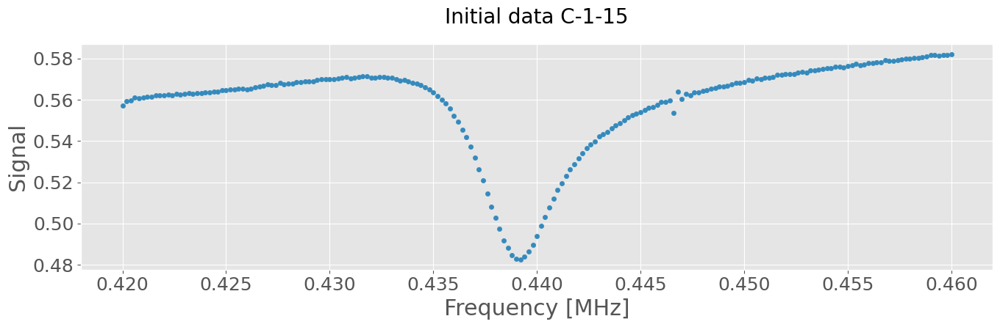

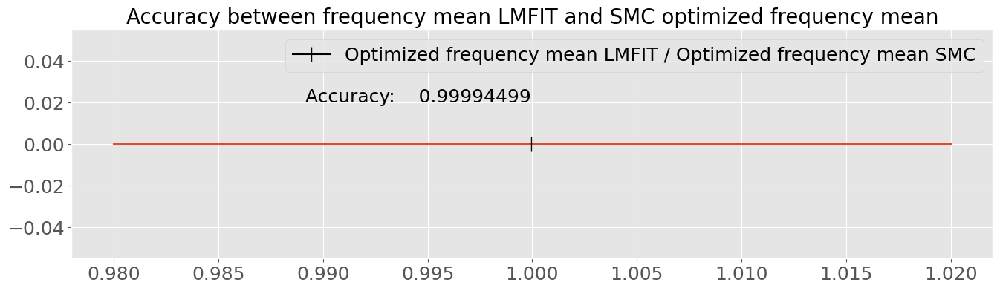

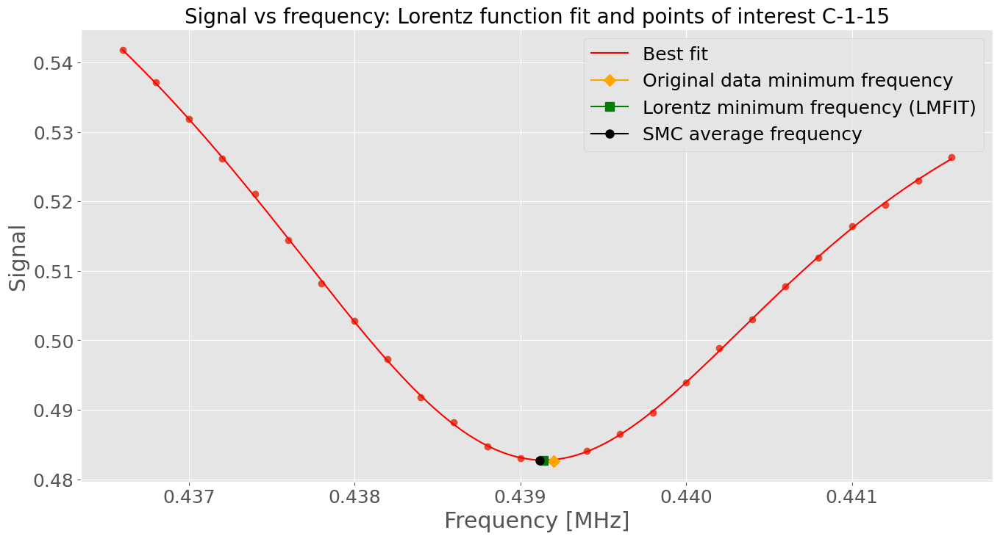



Eval appended.
--------------------------------

[[Model]]
    (Model(linear) + Model(split_lorentzian))
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 138
    # data points      = 26
    # variables        = 6
    chi-square         = 1.1410e-06
    reduced chi-square = 5.7051e-08
    Akaike info crit   = -428.483977
    Bayesian info crit = -420.935397
    R-squared          = 0.99987786
[[Variables]]
    amplitude: -6.2340e-04 +/- 1.1138e-05 (1.79%) (init = 0.0005991456)
    center:     0.43902379 +/- 6.3412e-06 (0.00%) (init = 0.43826)
    sigma:      0.00224340 +/- 3.2593e-05 (1.45%) (init = 0.0025)
    sigma_r:    0.00213329 +/- 3.4928e-05 (1.64%) (init = 0.0025)
    fwhm:       0.00437669 +/- 4.0456e-05 (0.92%) == 'sigma+sigma_r'
    height:    -0.09067727 +/- 8.0344e-04 (0.89%) == '2*amplitude/3.1415927/max(0.0000000, (sigma+sigma_r))'
    slope:     -4.25421348 +/- 0.23227080 (5.46%) (init = 0)
    intercept:  2.44113754 +/- 0.10180909 (4.17%) (

<Figure size 640x480 with 0 Axes>

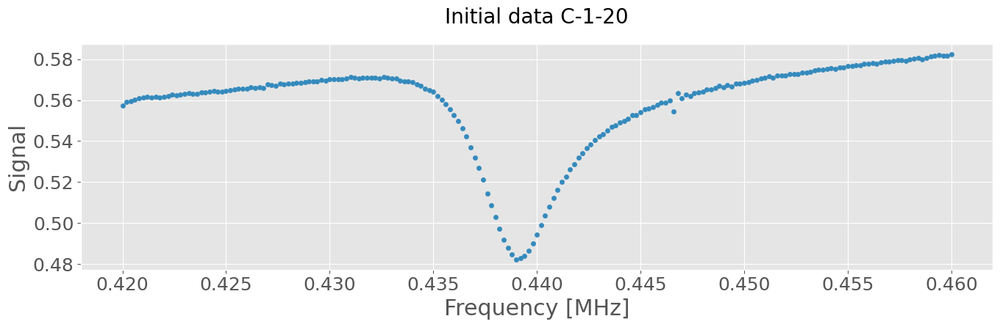

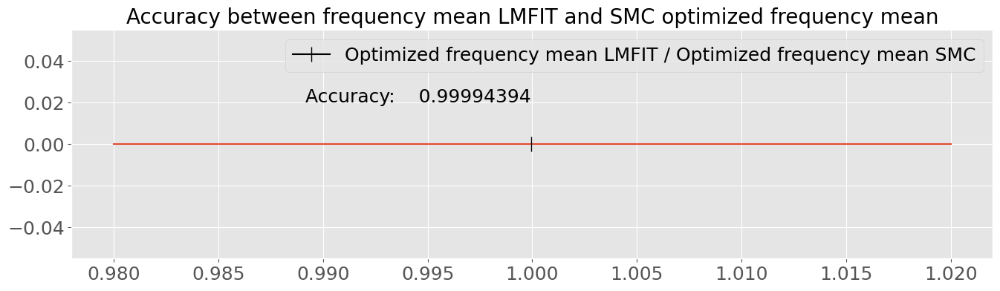

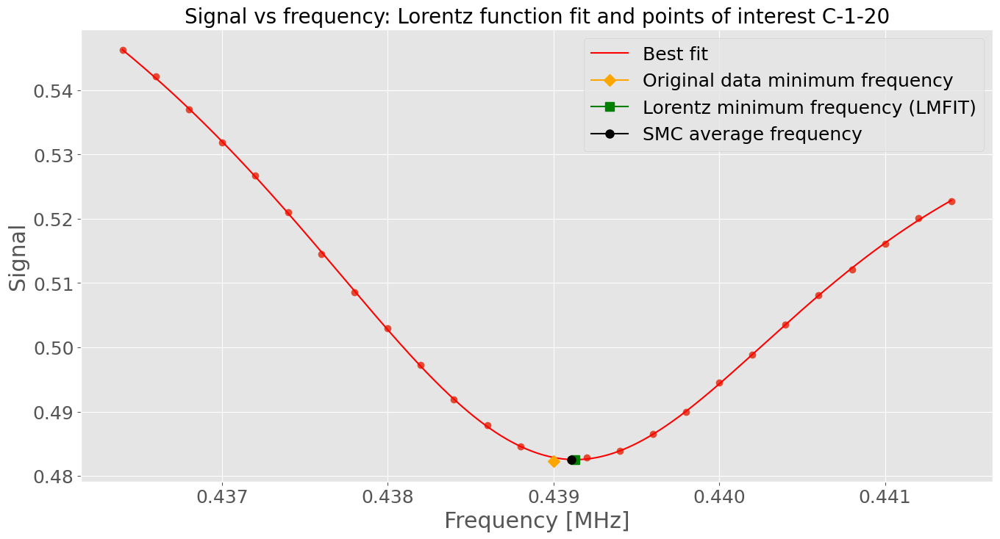



Eval appended.
--------------------------------

[[Model]]
    (Model(linear) + Model(split_lorentzian))
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 71
    # data points      = 26
    # variables        = 6
    chi-square         = 8.0910e-07
    reduced chi-square = 4.0455e-08
    Akaike info crit   = -437.421448
    Bayesian info crit = -429.872869
    R-squared          = 0.99990153
[[Variables]]
    amplitude: -6.3327e-04 +/- 9.5193e-06 (1.50%) (init = 0.0005531976)
    center:     0.43902050 +/- 5.2940e-06 (0.00%) (init = 0.4389636)
    sigma:      0.00218999 +/- 2.9929e-05 (1.37%) (init = 0.0025)
    sigma_r:    0.00220663 +/- 2.7002e-05 (1.22%) (init = 0.0025)
    fwhm:       0.00439662 +/- 3.4203e-05 (0.78%) == 'sigma+sigma_r'
    height:    -0.09169551 +/- 6.8218e-04 (0.74%) == '2*amplitude/3.1415927/max(0.0000000, (sigma+sigma_r))'
    slope:     -3.51184301 +/- 0.19711719 (5.61%) (init = 0)
    intercept:  2.11612080 +/- 0.08667011 (4.10%) 

<Figure size 640x480 with 0 Axes>

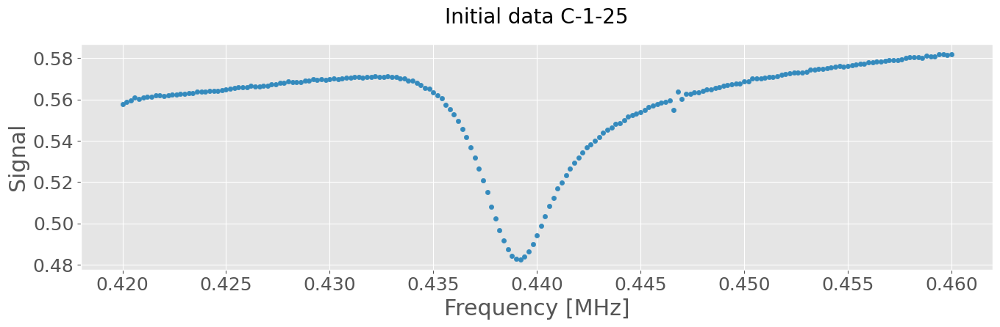

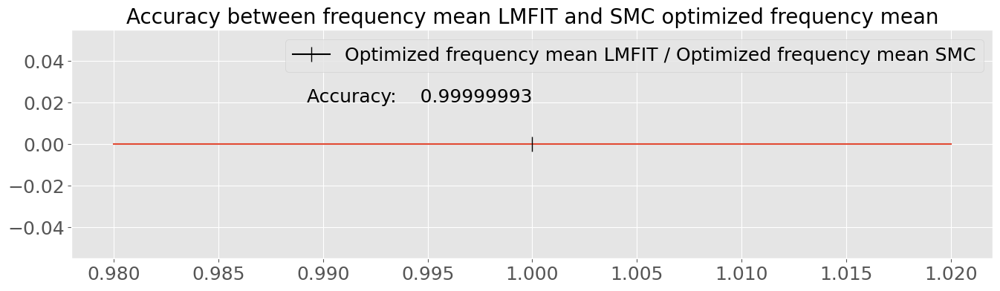

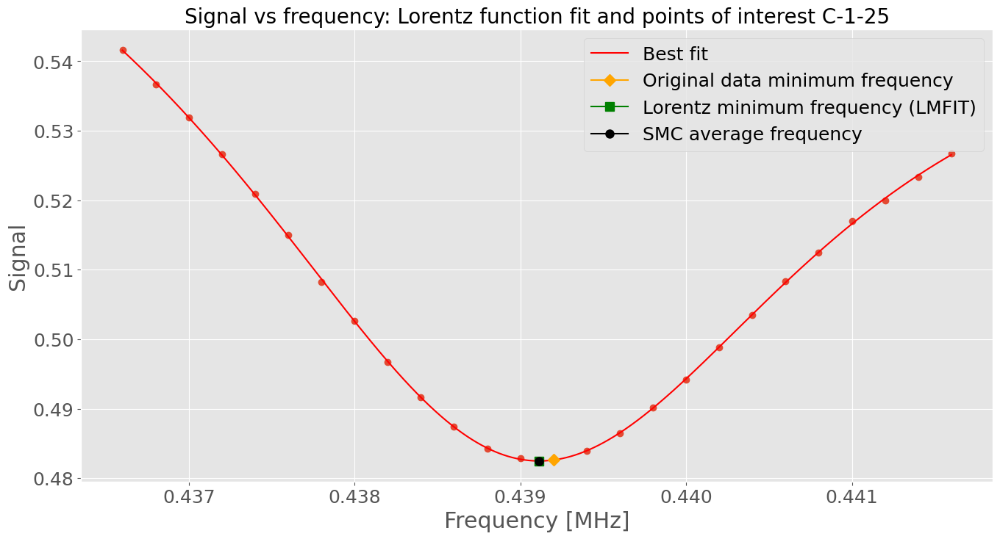



Eval appended.
--------------------------------

[[Model]]
    (Model(linear) + Model(split_lorentzian))
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 57
    # data points      = 26
    # variables        = 6
    chi-square         = 1.4441e-06
    reduced chi-square = 7.2206e-08
    Akaike info crit   = -422.358810
    Bayesian info crit = -414.810231
    R-squared          = 0.99982405
[[Variables]]
    amplitude: -6.5348e-04 +/- 1.3590e-05 (2.08%) (init = 0.0005576473)
    center:     0.43901296 +/- 7.0248e-06 (0.00%) (init = 0.4389636)
    sigma:      0.00225822 +/- 4.2881e-05 (1.90%) (init = 0.0025)
    sigma_r:    0.00220732 +/- 3.5378e-05 (1.60%) (init = 0.0025)
    fwhm:       0.00446554 +/- 4.7658e-05 (1.07%) == 'sigma+sigma_r'
    height:    -0.09316178 +/- 9.6511e-04 (1.04%) == '2*amplitude/3.1415927/max(0.0000000, (sigma+sigma_r))'
    slope:     -3.88264692 +/- 0.27323156 (7.04%) (init = 0)
    intercept:  2.28023284 +/- 0.12022180 (5.27%) 

<Figure size 640x480 with 0 Axes>

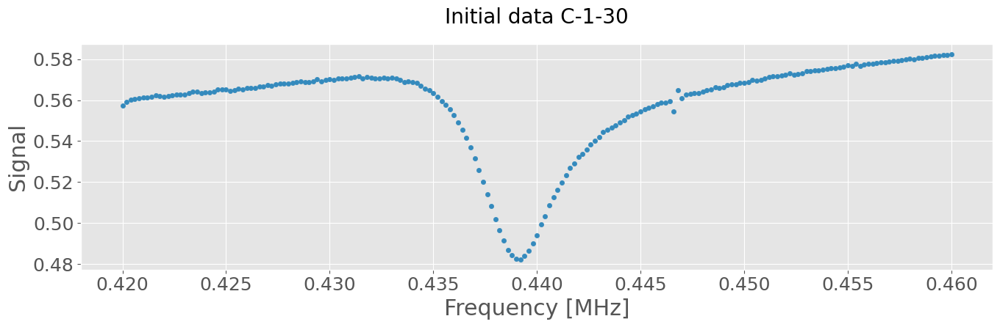

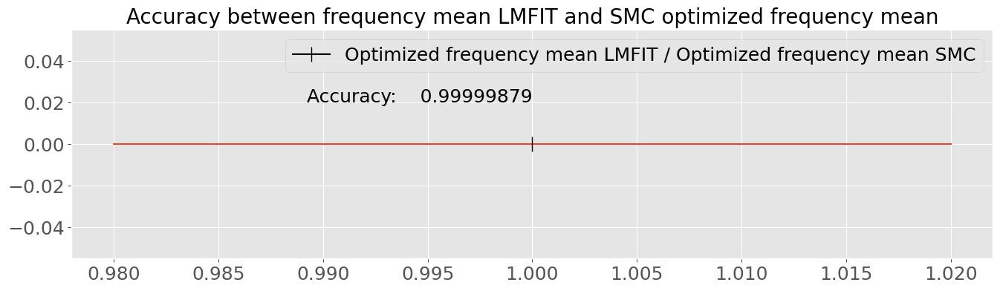

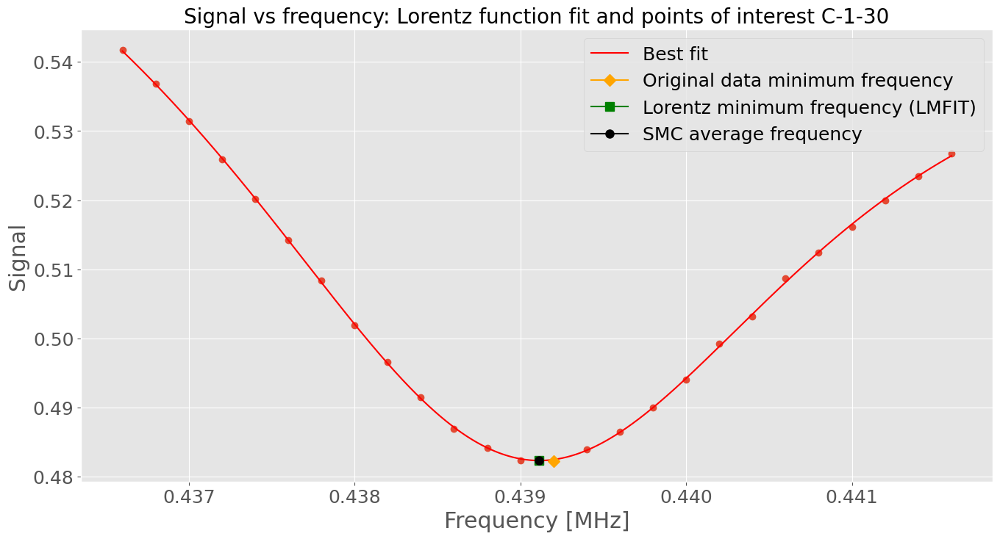



Eval appended.
--------------------------------

[[Model]]
    (Model(linear) + Model(split_lorentzian))
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 159
    # data points      = 26
    # variables        = 6
    chi-square         = 1.3535e-06
    reduced chi-square = 6.7673e-08
    Akaike info crit   = -424.044351
    Bayesian info crit = -416.495771
    R-squared          = 0.99974542
[[Variables]]
    amplitude: -5.1885e-04 +/- 1.3947e-05 (2.69%) (init = 0.0004491329)
    center:     0.43941090 +/- 8.8333e-06 (0.00%) (init = 0.4387333)
    sigma:      0.00229758 +/- 4.7701e-05 (2.08%) (init = 0.0025)
    sigma_r:    0.00225823 +/- 5.4514e-05 (2.41%) (init = 0.0025)
    fwhm:       0.00455582 +/- 6.2050e-05 (1.36%) == 'sigma+sigma_r'
    height:    -0.07250313 +/- 9.8273e-04 (1.36%) == '2*amplitude/3.1415927/max(0.0000000, (sigma+sigma_r))'
    slope:     -2.60193765 +/- 0.27375212 (10.52%) (init = 0)
    intercept:  1.71631244 +/- 0.12004979 (6.99%

<Figure size 640x480 with 0 Axes>

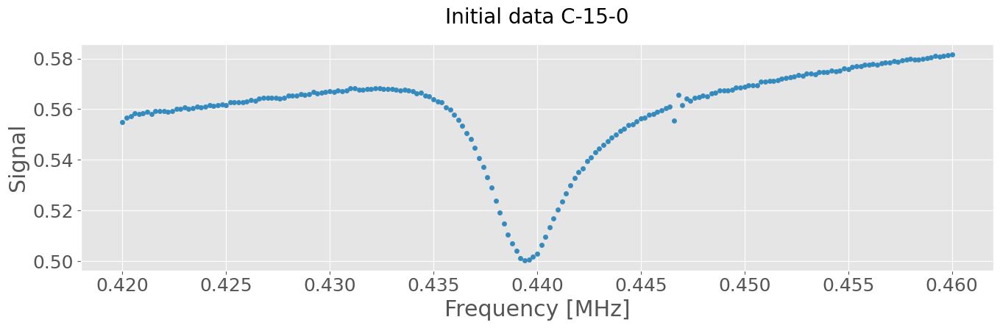

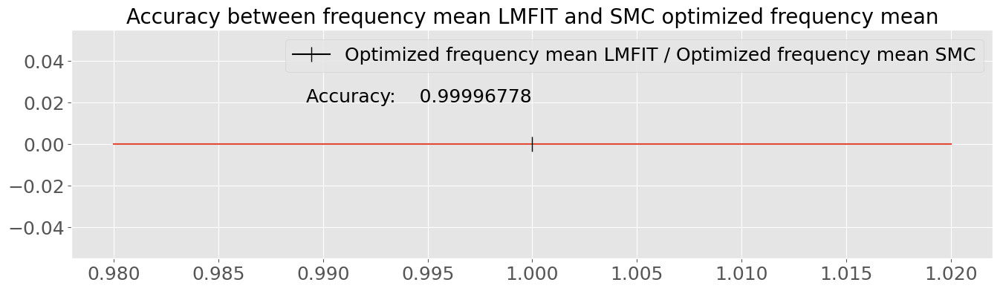

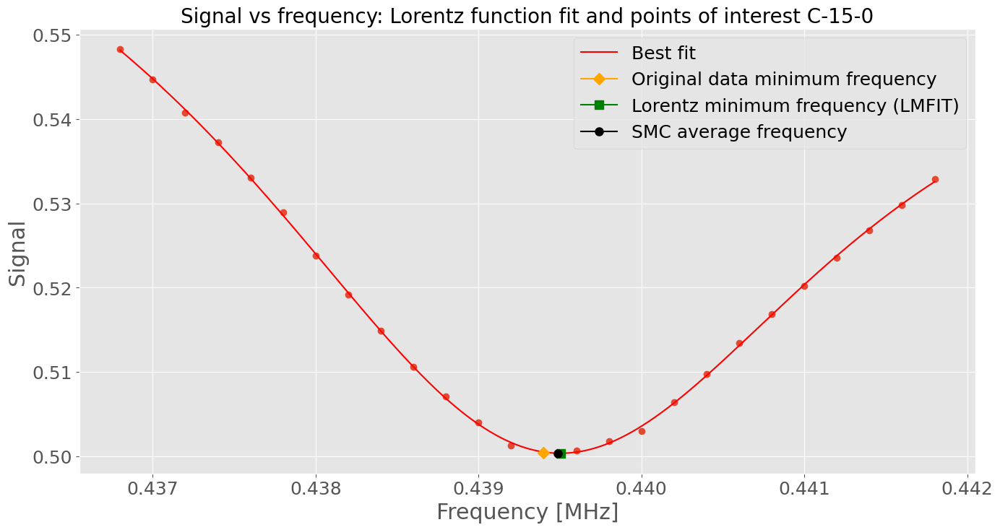



Eval appended.
--------------------------------

[[Model]]
    (Model(linear) + Model(split_lorentzian))
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 117
    # data points      = 26
    # variables        = 6
    chi-square         = 1.2145e-06
    reduced chi-square = 6.0723e-08
    Akaike info crit   = -426.861844
    Bayesian info crit = -419.313265
    R-squared          = 0.99975723
[[Variables]]
    amplitude: -5.2616e-04 +/- 1.3910e-05 (2.64%) (init = 0.0004315321)
    center:     0.43937390 +/- 8.4944e-06 (0.00%) (init = 0.43898)
    sigma:      0.00233620 +/- 4.8791e-05 (2.09%) (init = 0.0025)
    sigma_r:    0.00230573 +/- 5.3129e-05 (2.30%) (init = 0.0025)
    fwhm:       0.00464193 +/- 6.1805e-05 (1.33%) == 'sigma+sigma_r'
    height:    -0.07216055 +/- 9.6641e-04 (1.34%) == '2*amplitude/3.1415927/max(0.0000000, (sigma+sigma_r))'
    slope:     -2.62460377 +/- 0.26695339 (10.17%) (init = 0)
    intercept:  1.72671908 +/- 0.11713872 (6.78%) 

<Figure size 640x480 with 0 Axes>

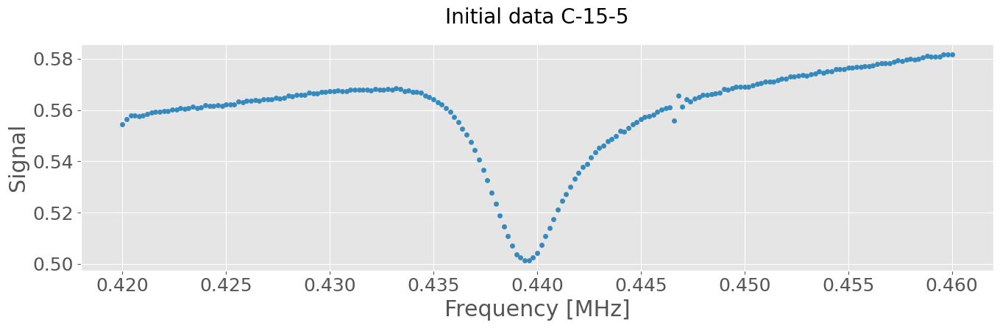

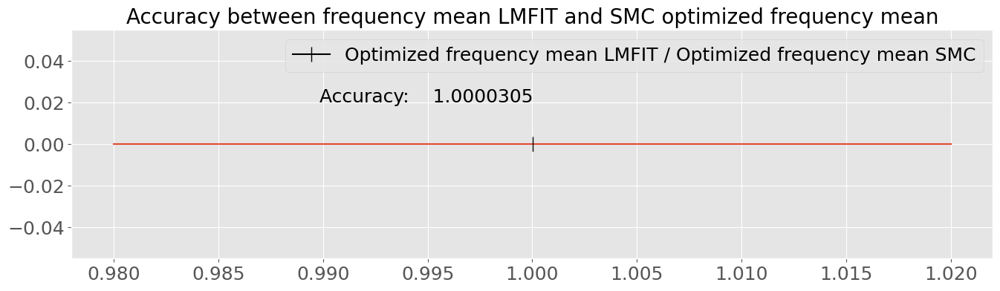

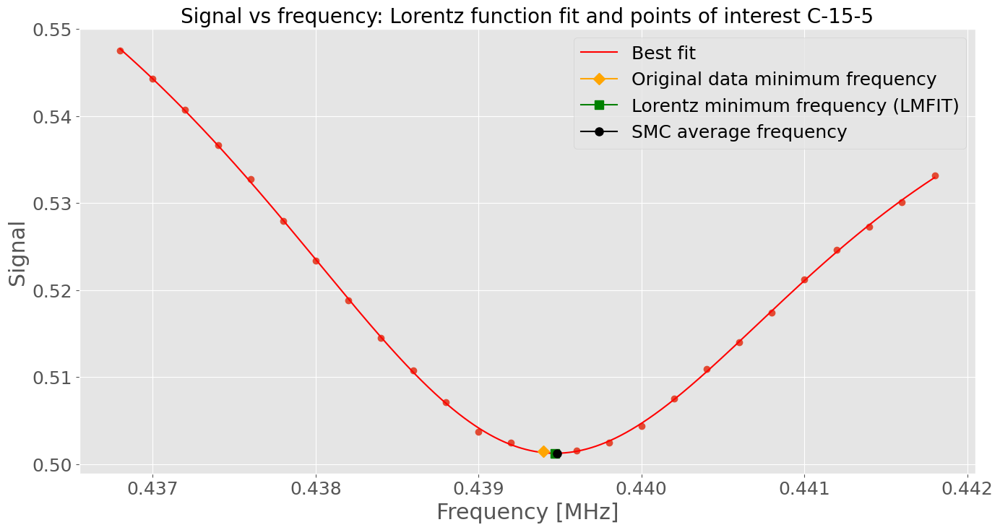



Eval appended.
--------------------------------

[[Model]]
    (Model(linear) + Model(split_lorentzian))
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 124
    # data points      = 26
    # variables        = 6
    chi-square         = 2.0922e-06
    reduced chi-square = 1.0461e-07
    Akaike info crit   = -412.720543
    Bayesian info crit = -405.171964
    R-squared          = 0.99957849
[[Variables]]
    amplitude: -5.2661e-04 +/- 1.8195e-05 (3.46%) (init = 0.0004319237)
    center:     0.43936263 +/- 1.1150e-05 (0.00%) (init = 0.43898)
    sigma:      0.00240346 +/- 6.9688e-05 (2.90%) (init = 0.0025)
    sigma_r:    0.00224438 +/- 6.4416e-05 (2.87%) (init = 0.0025)
    fwhm:       0.00464784 +/- 8.1192e-05 (1.75%) == 'sigma+sigma_r'
    height:    -0.07213023 +/- 0.00125886 (1.75%) == '2*amplitude/3.1415927/max(0.0000000, (sigma+sigma_r))'
    slope:     -3.10004028 +/- 0.34953660 (11.28%) (init = 0)
    intercept:  1.93556793 +/- 0.15357762 (7.93%) 

<Figure size 640x480 with 0 Axes>

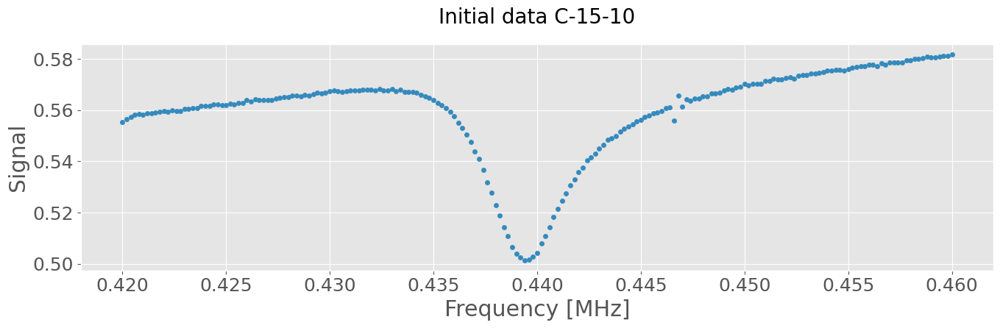

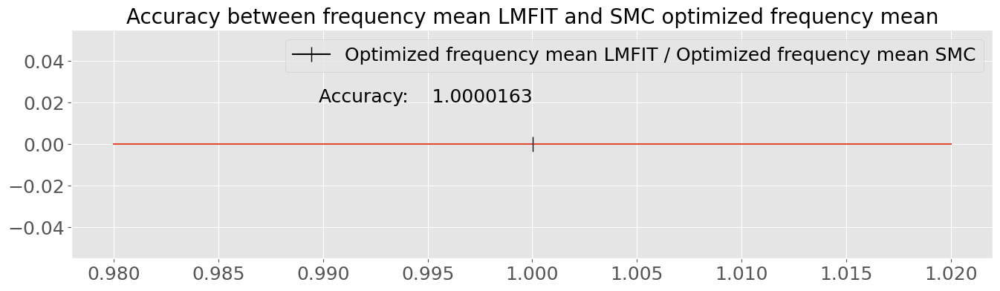

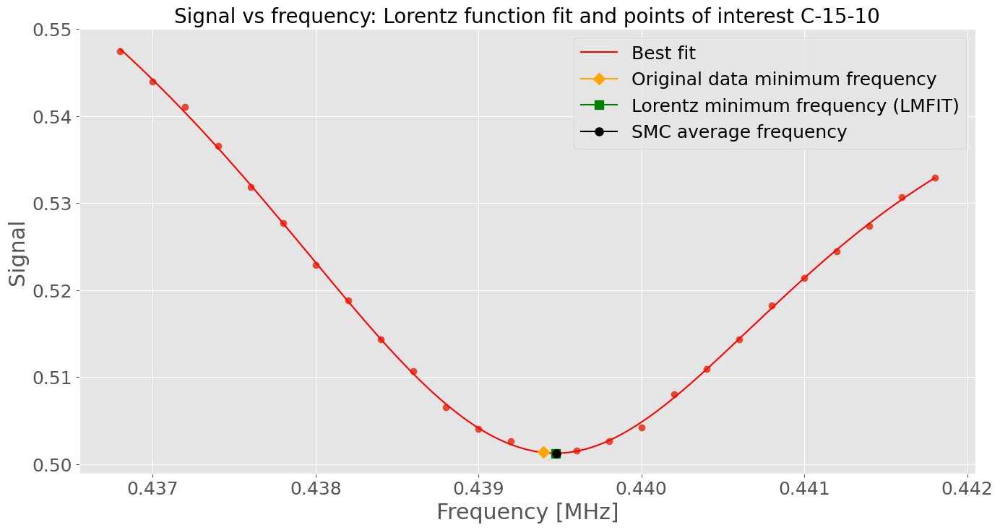



Eval appended.
--------------------------------

[[Model]]
    (Model(linear) + Model(split_lorentzian))
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 43
    # data points      = 26
    # variables        = 6
    chi-square         = 1.9785e-06
    reduced chi-square = 9.8923e-08
    Akaike info crit   = -414.173509
    Bayesian info crit = -406.624930
    R-squared          = 0.99955706
[[Variables]]
    amplitude: -5.3070e-04 +/- 1.8440e-05 (3.47%) (init = 0.0004009722)
    center:     0.43935978 +/- 1.0832e-05 (0.00%) (init = 0.4393636)
    sigma:      0.00231459 +/- 7.2047e-05 (3.11%) (init = 0.0025)
    sigma_r:    0.00234018 +/- 5.9097e-05 (2.53%) (init = 0.0025)
    fwhm:       0.00465477 +/- 8.0766e-05 (1.74%) == 'sigma+sigma_r'
    height:    -0.07258227 +/- 0.00128762 (1.77%) == '2*amplitude/3.1415927/max(0.0000000, (sigma+sigma_r))'
    slope:     -2.51882681 +/- 0.34800571 (13.82%) (init = 0)
    intercept:  1.68064949 +/- 0.15333533 (9.12%)

<Figure size 640x480 with 0 Axes>

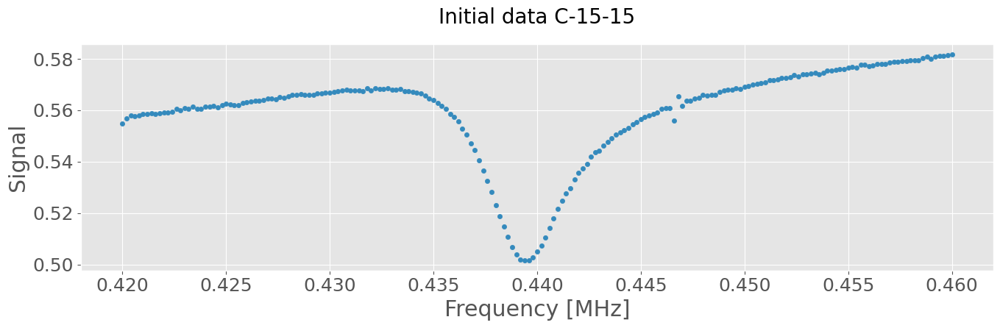

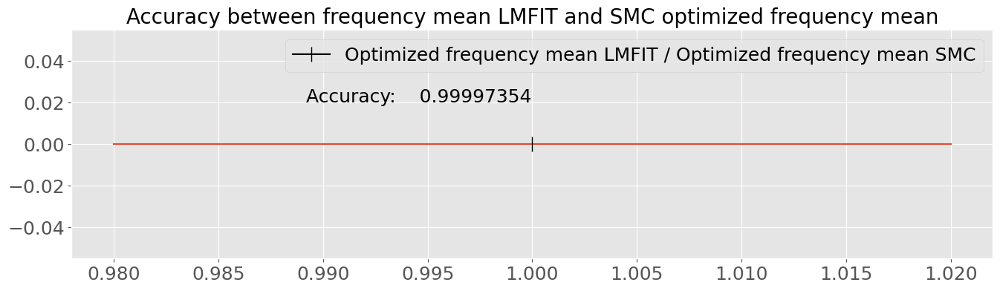

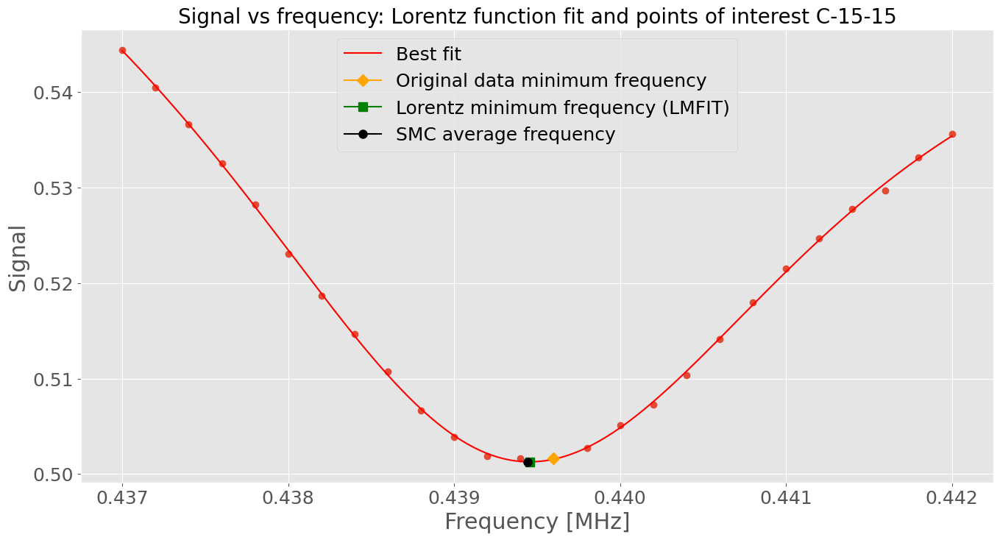



Eval appended.
--------------------------------

[[Model]]
    (Model(linear) + Model(split_lorentzian))
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 131
    # data points      = 26
    # variables        = 6
    chi-square         = 1.1476e-06
    reduced chi-square = 5.7380e-08
    Akaike info crit   = -428.334291
    Bayesian info crit = -420.785712
    R-squared          = 0.99976749
[[Variables]]
    amplitude: -5.2401e-04 +/- 1.3338e-05 (2.55%) (init = 0.0004330832)
    center:     0.43935401 +/- 8.2575e-06 (0.00%) (init = 0.43898)
    sigma:      0.00235119 +/- 4.9091e-05 (2.09%) (init = 0.0025)
    sigma_r:    0.00228137 +/- 4.9499e-05 (2.17%) (init = 0.0025)
    fwhm:       0.00463256 +/- 5.9563e-05 (1.29%) == 'sigma+sigma_r'
    height:    -0.07201128 +/- 9.2622e-04 (1.29%) == '2*amplitude/3.1415927/max(0.0000000, (sigma+sigma_r))'
    slope:     -2.76416597 +/- 0.25747378 (9.31%) (init = 0)
    intercept:  1.78779612 +/- 0.11306082 (6.32%) (

<Figure size 640x480 with 0 Axes>

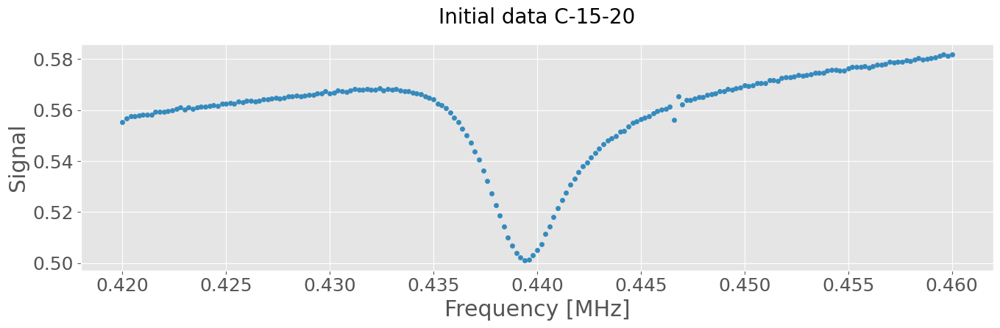

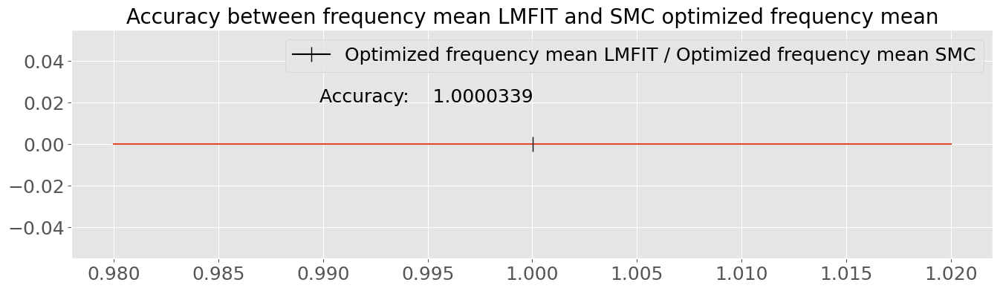

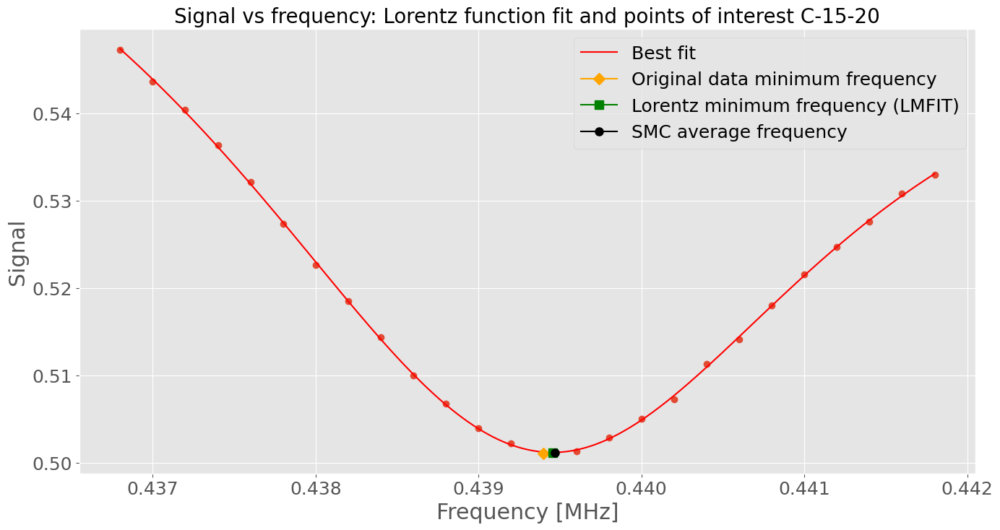



Eval appended.
--------------------------------

[[Model]]
    (Model(linear) + Model(split_lorentzian))
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 67
    # data points      = 26
    # variables        = 6
    chi-square         = 1.3452e-06
    reduced chi-square = 6.7259e-08
    Akaike info crit   = -424.203995
    Bayesian info crit = -416.655416
    R-squared          = 0.99972926
[[Variables]]
    amplitude: -4.8780e-04 +/- 1.2709e-05 (2.61%) (init = 0.0004388244)
    center:     0.43934850 +/- 9.0474e-06 (0.00%) (init = 0.43898)
    sigma:      0.00227830 +/- 5.0808e-05 (2.23%) (init = 0.0025)
    sigma_r:    0.00218035 +/- 4.9110e-05 (2.25%) (init = 0.0025)
    fwhm:       0.00445865 +/- 5.9895e-05 (1.34%) == 'sigma+sigma_r'
    height:    -0.06964987 +/- 9.0098e-04 (1.29%) == '2*amplitude/3.1415927/max(0.0000000, (sigma+sigma_r))'
    slope:     -2.95295683 +/- 0.25921477 (8.78%) (init = 0)
    intercept:  1.86809817 +/- 0.11386691 (6.10%) (i

<Figure size 640x480 with 0 Axes>

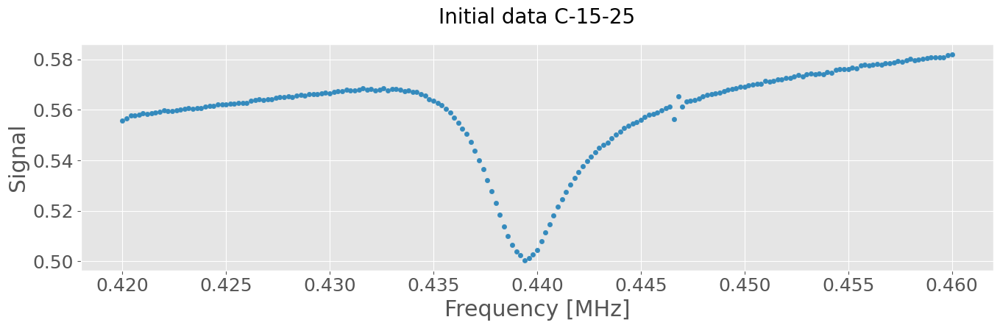

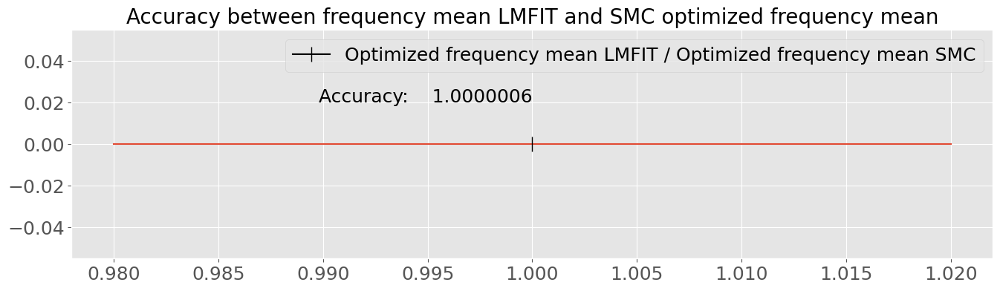

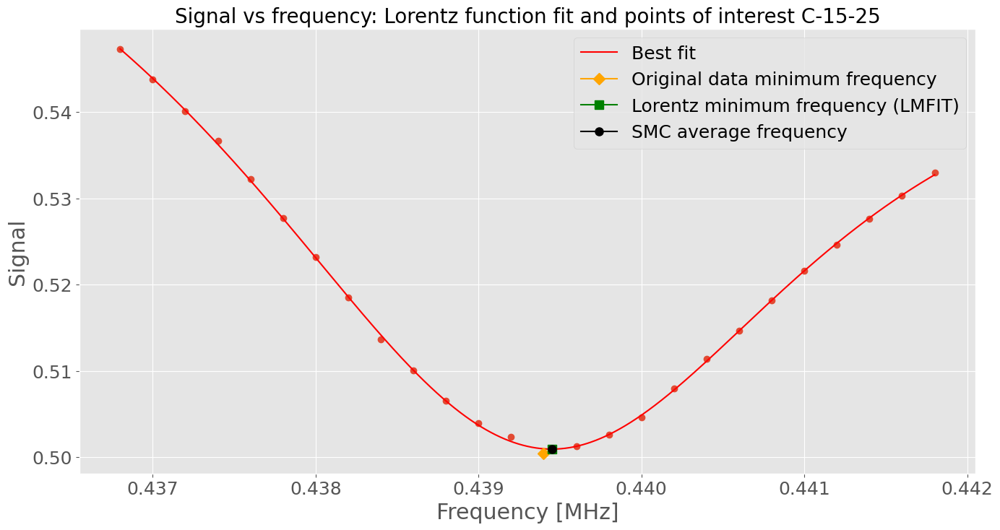



Eval appended.
--------------------------------

[[Model]]
    (Model(linear) + Model(split_lorentzian))
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 87
    # data points      = 26
    # variables        = 6
    chi-square         = 2.1023e-06
    reduced chi-square = 1.0512e-07
    Akaike info crit   = -412.594649
    Bayesian info crit = -405.046069
    R-squared          = 0.99957635
[[Variables]]
    amplitude: -4.9862e-04 +/- 1.6613e-05 (3.33%) (init = 0.0004304942)
    center:     0.43935540 +/- 1.1293e-05 (0.00%) (init = 0.43898)
    sigma:      0.00229418 +/- 6.3793e-05 (2.78%) (init = 0.0025)
    sigma_r:    0.00222387 +/- 6.4345e-05 (2.89%) (init = 0.0025)
    fwhm:       0.00451805 +/- 7.7006e-05 (1.70%) == 'sigma+sigma_r'
    height:    -0.07025890 +/- 0.00117021 (1.67%) == '2*amplitude/3.1415927/max(0.0000000, (sigma+sigma_r))'
    slope:     -2.85568266 +/- 0.33245197 (11.64%) (init = 0)
    intercept:  1.82615554 +/- 0.14598458 (7.99%) (

<Figure size 640x480 with 0 Axes>

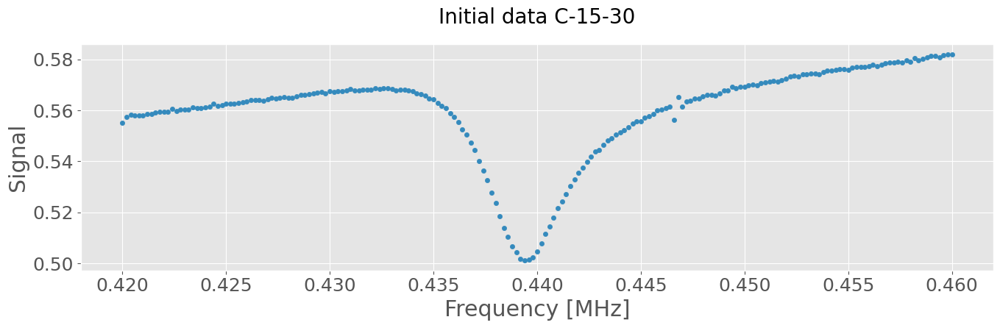

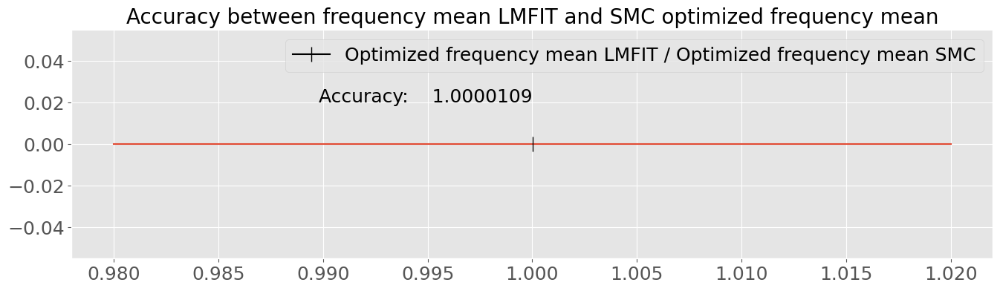

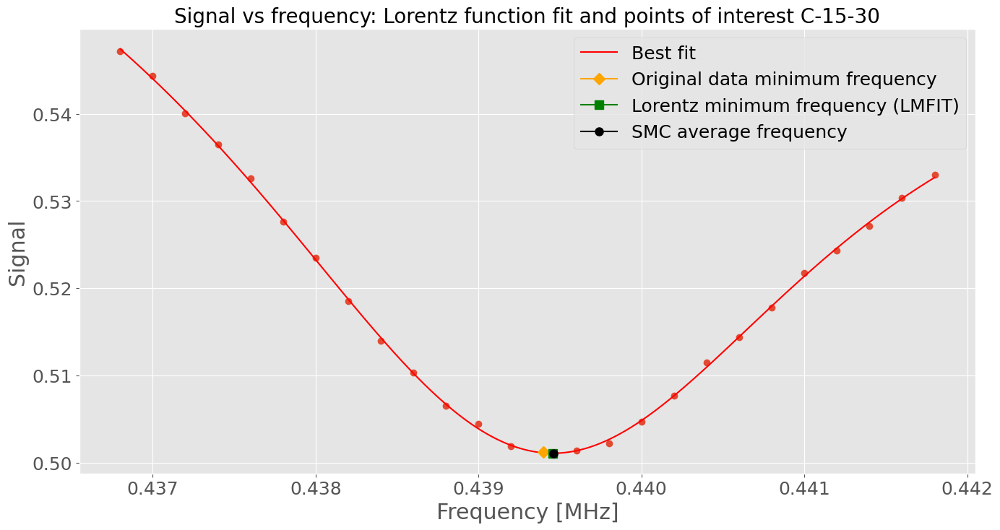



Eval appended.
--------------------------------

[[Model]]
    (Model(linear) + Model(split_lorentzian))
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 64
    # data points      = 26
    # variables        = 6
    chi-square         = 1.8469e-06
    reduced chi-square = 9.2347e-08
    Akaike info crit   = -415.962021
    Bayesian info crit = -408.413442
    R-squared          = 0.99905713
[[Variables]]
    amplitude: -4.9248e-04 +/- 3.5836e-05 (7.28%) (init = 0.0002501571)
    center:     0.44058973 +/- 1.8080e-05 (0.00%) (init = 0.4407)
    sigma:      0.00292065 +/- 1.7316e-04 (5.93%) (init = 0.0025)
    sigma_r:    0.00255198 +/- 9.2620e-05 (3.63%) (init = 0.0025)
    fwhm:       0.00547263 +/- 1.8878e-04 (3.45%) == 'sigma+sigma_r'
    height:    -0.05728929 +/- 0.00221131 (3.86%) == '2*amplitude/3.1415927/max(0.0000000, (sigma+sigma_r))'
    slope:     -1.76859060 +/- 0.49205560 (27.82%) (init = 0)
    intercept:  1.35892340 +/- 0.21810958 (16.05%) (

<Figure size 640x480 with 0 Axes>

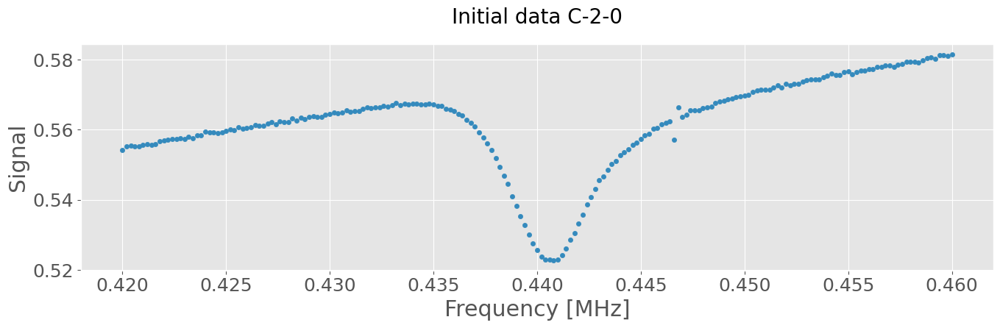

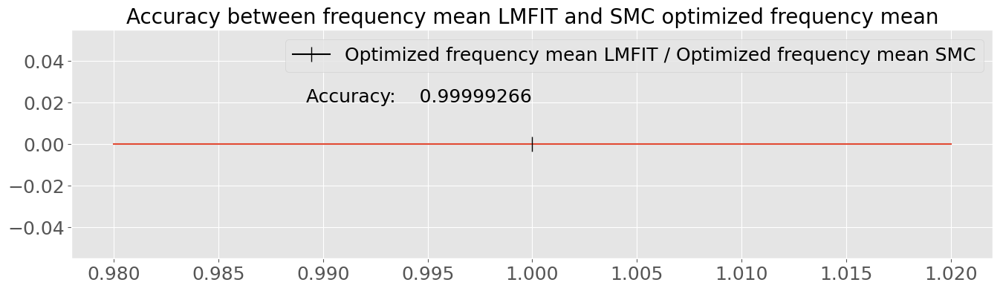

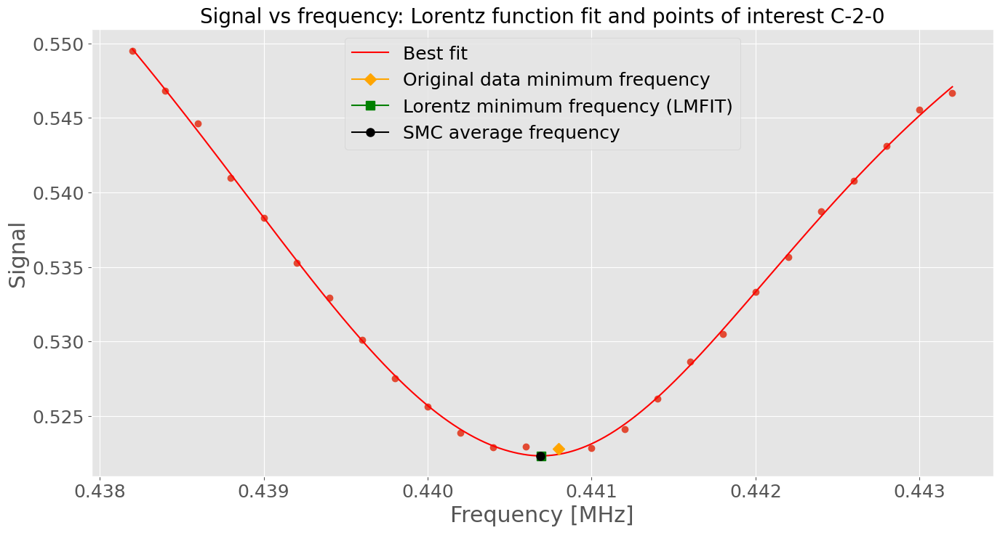



Eval appended.
--------------------------------

[[Model]]
    (Model(linear) + Model(split_lorentzian))
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 89
    # data points      = 26
    # variables        = 6
    chi-square         = 1.8811e-06
    reduced chi-square = 9.4056e-08
    Akaike info crit   = -415.485321
    Bayesian info crit = -407.936742
    R-squared          = 0.99912993
[[Variables]]
    amplitude: -4.4767e-04 +/- 2.5629e-05 (5.72%) (init = 0.0002773038)
    center:     0.44057922 +/- 1.5571e-05 (0.00%) (init = 0.44018)
    sigma:      0.00275036 +/- 1.2575e-04 (4.57%) (init = 0.0025)
    sigma_r:    0.00245183 +/- 1.0238e-04 (4.18%) (init = 0.0025)
    fwhm:       0.00520219 +/- 1.4366e-04 (2.76%) == 'sigma+sigma_r'
    height:    -0.05478371 +/- 0.00164855 (3.01%) == '2*amplitude/3.1415927/max(0.0000000, (sigma+sigma_r))'
    slope:     -1.71818501 +/- 0.41271343 (24.02%) (init = 0)
    intercept:  1.33398308 +/- 0.18198967 (13.64%) 

<Figure size 640x480 with 0 Axes>

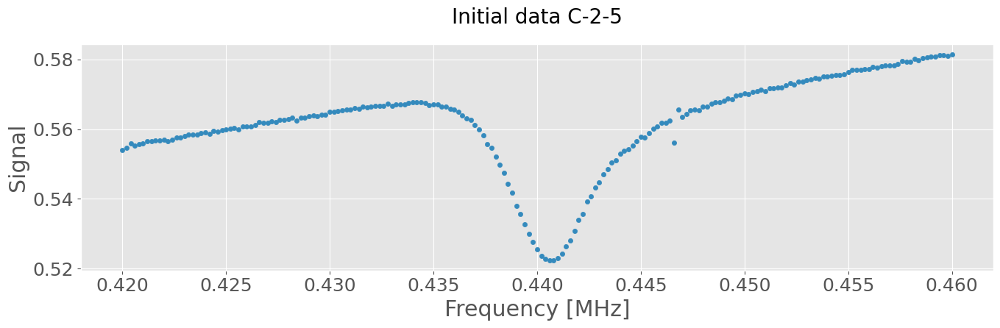

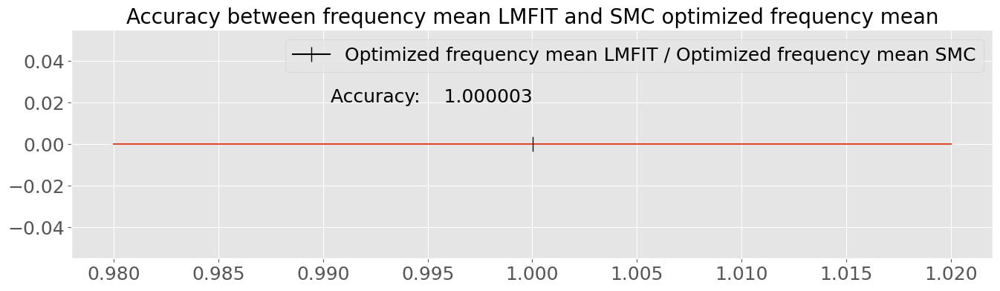

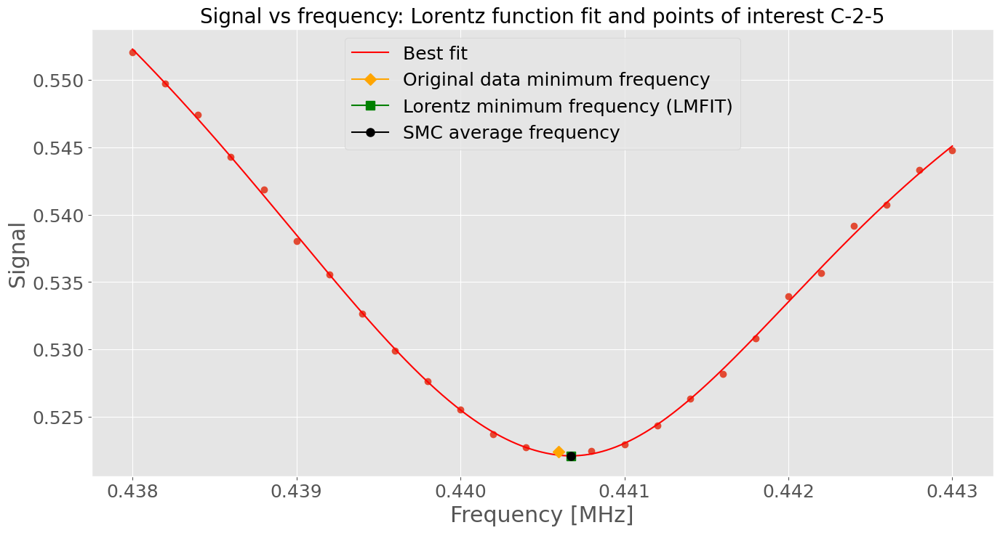



Eval appended.
--------------------------------

[[Model]]
    (Model(linear) + Model(split_lorentzian))
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 111
    # data points      = 26
    # variables        = 6
    chi-square         = 1.7271e-06
    reduced chi-square = 8.6356e-08
    Akaike info crit   = -417.706074
    Bayesian info crit = -410.157495
    R-squared          = 0.99912076
[[Variables]]
    amplitude: -5.0065e-04 +/- 4.3613e-05 (8.71%) (init = 0.0002574915)
    center:     0.44054970 +/- 2.0548e-05 (0.00%) (init = 0.4408364)
    sigma:      0.00307426 +/- 2.1117e-04 (6.87%) (init = 0.0025)
    sigma_r:    0.00243741 +/- 7.8823e-05 (3.23%) (init = 0.0025)
    fwhm:       0.00551168 +/- 2.3207e-04 (4.21%) == 'sigma+sigma_r'
    height:    -0.05782690 +/- 0.00262096 (4.53%) == '2*amplitude/3.1415927/max(0.0000000, (sigma+sigma_r))'
    slope:     -2.60851186 +/- 0.54470910 (20.88%) (init = 0)
    intercept:  1.72945180 +/- 0.24203722 (14.00

<Figure size 640x480 with 0 Axes>

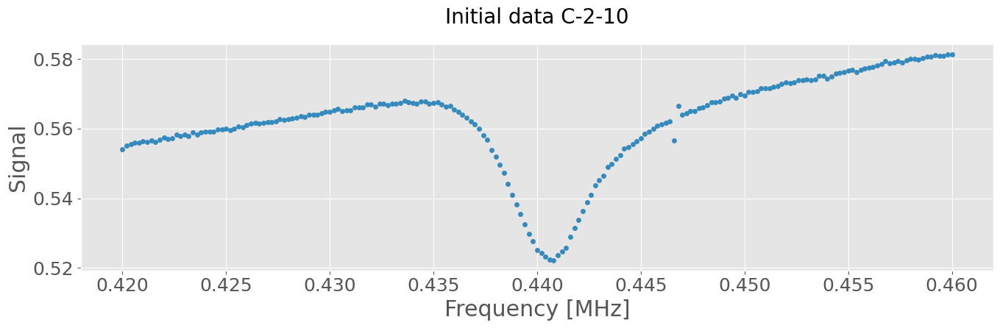

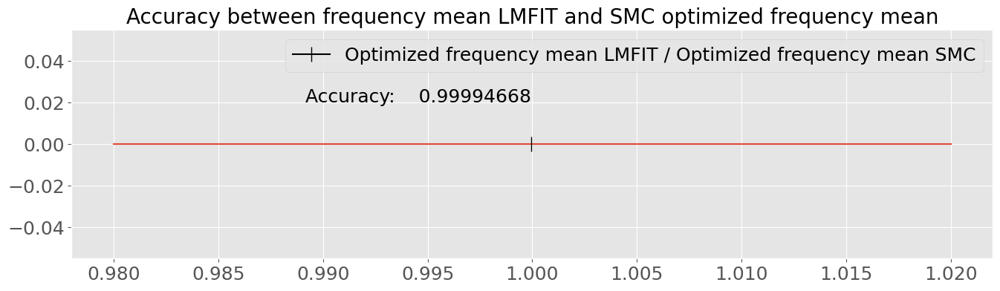

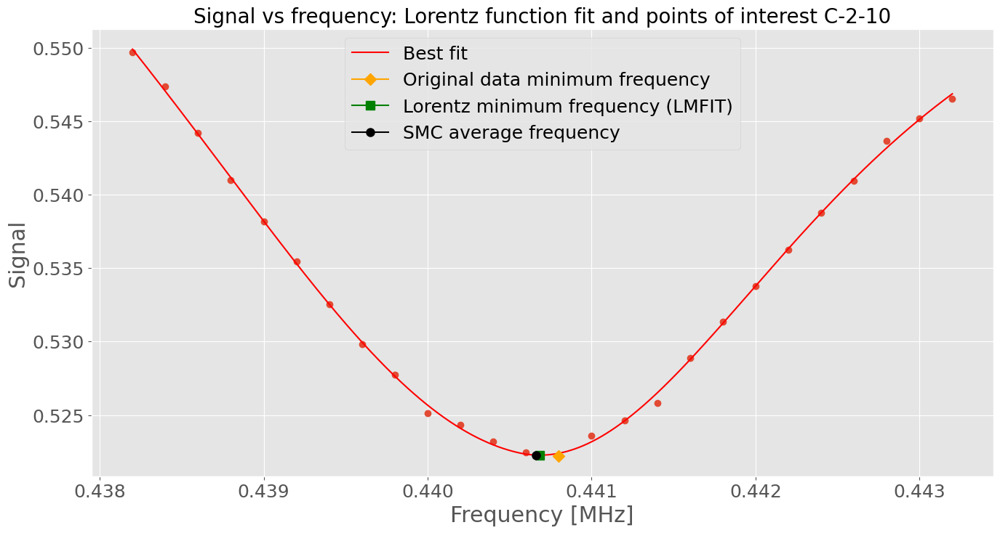



Eval appended.
--------------------------------

[[Model]]
    (Model(linear) + Model(split_lorentzian))
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 87
    # data points      = 26
    # variables        = 6
    chi-square         = 2.2035e-06
    reduced chi-square = 1.1018e-07
    Akaike info crit   = -411.372553
    Bayesian info crit = -403.823974
    R-squared          = 0.99882613
[[Variables]]
    amplitude: -6.0210e-04 +/- 9.9719e-05 (16.56%) (init = 0.0002478684)
    center:     0.44052943 +/- 4.2944e-05 (0.01%) (init = 0.4407)
    sigma:      0.00357742 +/- 4.2217e-04 (11.80%) (init = 0.0025)
    sigma_r:    0.00252363 +/- 1.0906e-04 (4.32%) (init = 0.0025)
    fwhm:       0.00610106 +/- 4.8837e-04 (8.00%) == 'sigma+sigma_r'
    height:    -0.06282643 +/- 0.00539705 (8.59%) == '2*amplitude/3.1415927/max(0.0000000, (sigma+sigma_r))'
    slope:     -3.41776054 +/- 0.94372139 (27.61%) (init = 0)
    intercept:  2.09160883 +/- 0.42065138 (20.11%)

<Figure size 640x480 with 0 Axes>

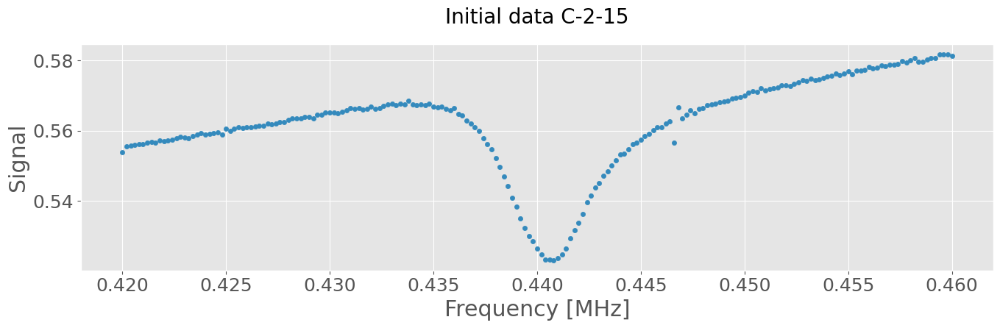

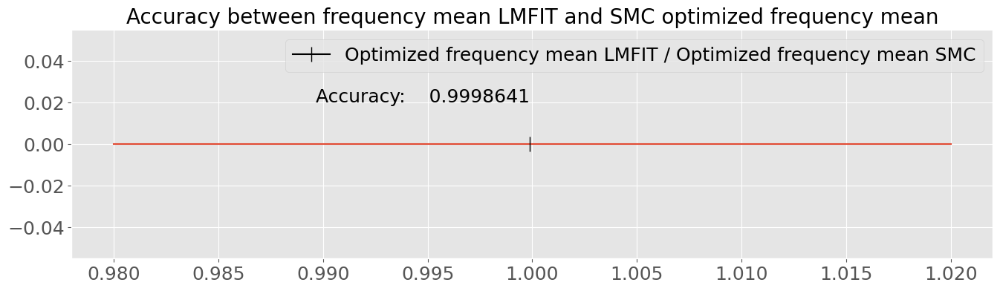

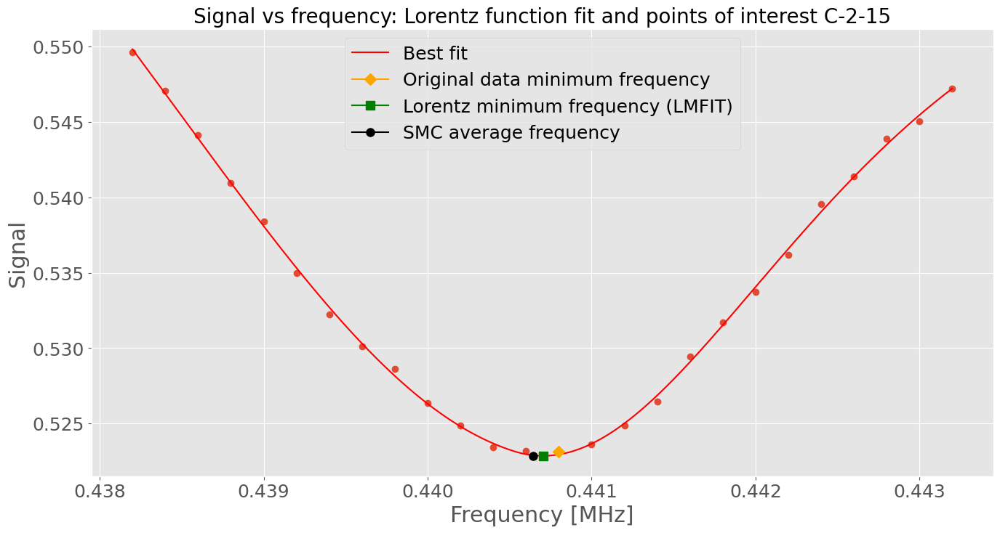



Eval appended.
--------------------------------

[[Model]]
    (Model(linear) + Model(split_lorentzian))
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 98
    # data points      = 26
    # variables        = 6
    chi-square         = 1.9115e-06
    reduced chi-square = 9.5574e-08
    Akaike info crit   = -415.068882
    Bayesian info crit = -407.520303
    R-squared          = 0.99895692
[[Variables]]
    amplitude: -4.4792e-04 +/- 3.5917e-05 (8.02%) (init = 0.0002401086)
    center:     0.44052631 +/- 1.9194e-05 (0.00%) (init = 0.4408364)
    sigma:      0.00285867 +/- 1.8790e-04 (6.57%) (init = 0.0025)
    sigma_r:    0.00243947 +/- 8.5858e-05 (3.52%) (init = 0.0025)
    fwhm:       0.00529814 +/- 2.0380e-04 (3.85%) == 'sigma+sigma_r'
    height:    -0.05382168 +/- 0.00226385 (4.21%) == '2*amplitude/3.1415927/max(0.0000000, (sigma+sigma_r))'
    slope:     -1.99691052 +/- 0.49949367 (25.01%) (init = 0)
    intercept:  1.45668326 +/- 0.22167084 (15.22%

<Figure size 640x480 with 0 Axes>

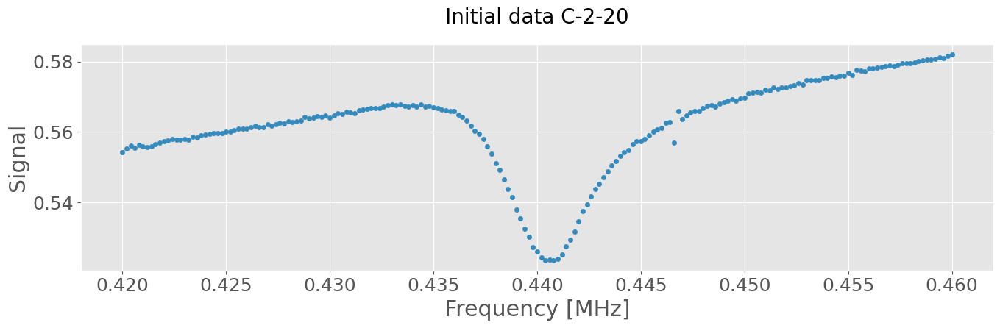

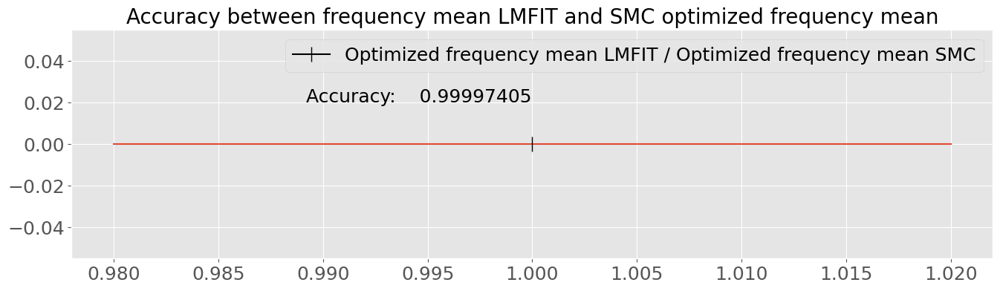

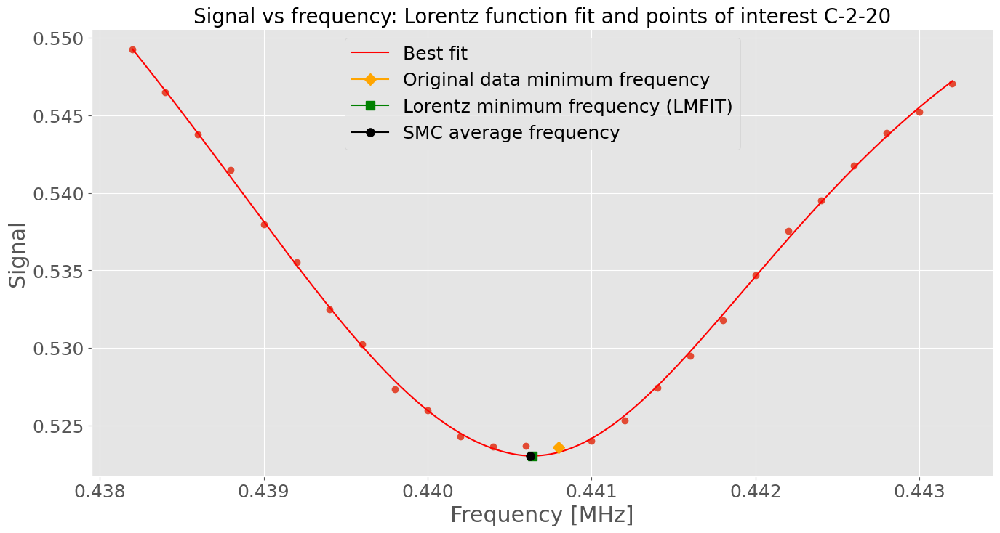



Eval appended.
--------------------------------

[[Model]]
    (Model(linear) + Model(split_lorentzian))
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 50
    # data points      = 26
    # variables        = 6
    chi-square         = 1.7973e-06
    reduced chi-square = 8.9866e-08
    Akaike info crit   = -416.669969
    Bayesian info crit = -409.121390
    R-squared          = 0.99911714
[[Variables]]
    amplitude: -4.5310e-04 +/- 2.8887e-05 (6.38%) (init = 0.0002754583)
    center:     0.44053946 +/- 1.6317e-05 (0.00%) (init = 0.4403636)
    sigma:      0.00290808 +/- 1.5384e-04 (5.29%) (init = 0.0025)
    sigma_r:    0.00238991 +/- 9.0679e-05 (3.79%) (init = 0.0025)
    fwhm:       0.00529799 +/- 1.6576e-04 (3.13%) == 'sigma+sigma_r'
    height:    -0.05444584 +/- 0.00179422 (3.30%) == '2*amplitude/3.1415927/max(0.0000000, (sigma+sigma_r))'
    slope:     -2.21828889 +/- 0.43214107 (19.48%) (init = 0)
    intercept:  1.55474215 +/- 0.19109899 (12.29%

<Figure size 640x480 with 0 Axes>

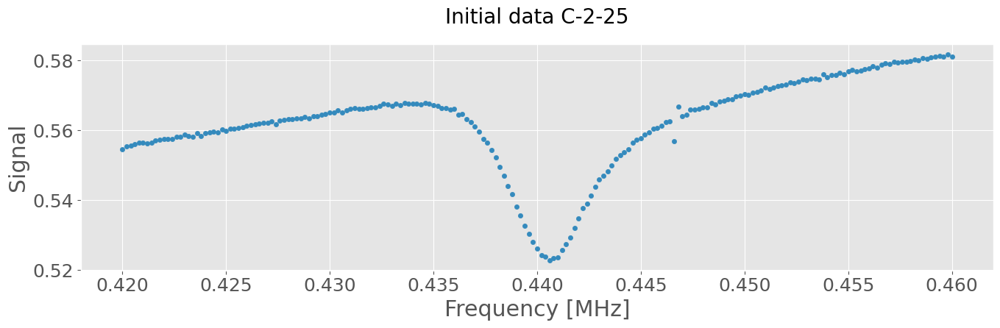

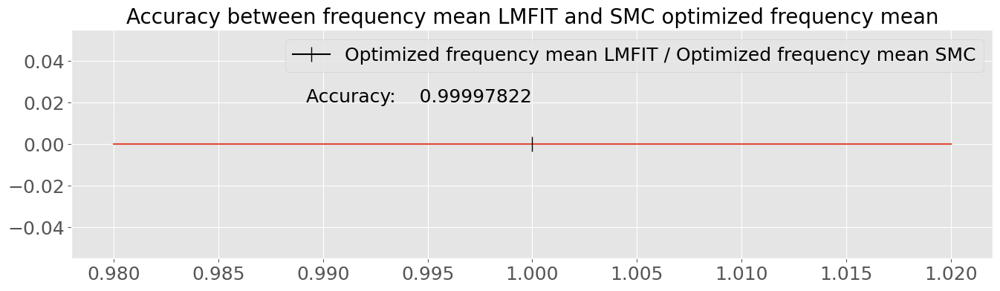

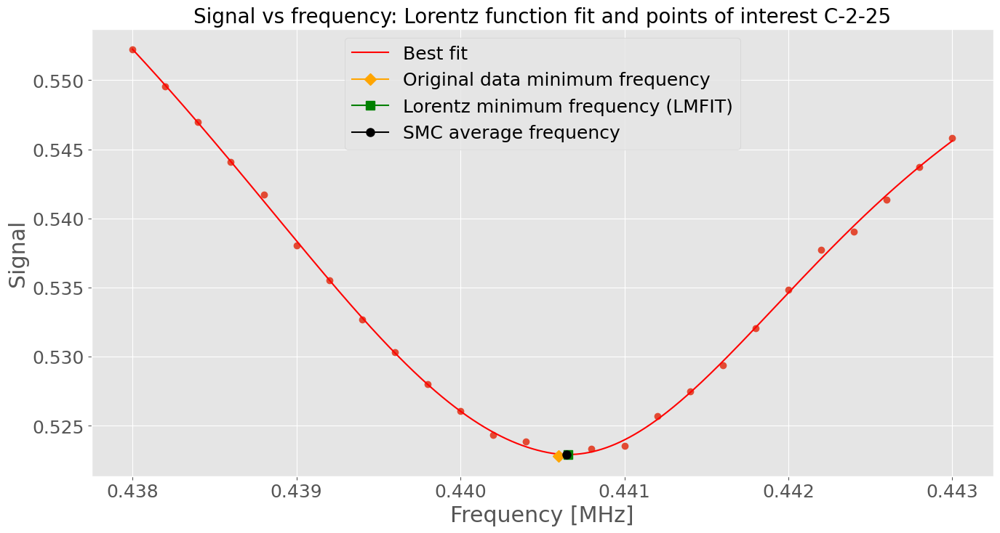



Eval appended.
--------------------------------

[[Model]]
    (Model(linear) + Model(split_lorentzian))
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 64
    # data points      = 26
    # variables        = 6
    chi-square         = 2.4741e-06
    reduced chi-square = 1.2370e-07
    Akaike info crit   = -408.361407
    Bayesian info crit = -400.812828
    R-squared          = 0.99872982
[[Variables]]
    amplitude: -5.2304e-04 +/- 4.2557e-05 (8.14%) (init = 0.0002650206)
    center:     0.44051343 +/- 2.1277e-05 (0.00%) (init = 0.44018)
    sigma:      0.00301607 +/- 1.9099e-04 (6.33%) (init = 0.0025)
    sigma_r:    0.00269001 +/- 1.3348e-04 (4.96%) (init = 0.0025)
    fwhm:       0.00570607 +/- 2.1613e-04 (3.79%) == 'sigma+sigma_r'
    height:    -0.05835458 +/- 0.00256270 (4.39%) == '2*amplitude/3.1415927/max(0.0000000, (sigma+sigma_r))'
    slope:     -1.80220234 +/- 0.57738226 (32.04%) (init = 0)
    intercept:  1.37583097 +/- 0.25509292 (18.54%) 

<Figure size 640x480 with 0 Axes>

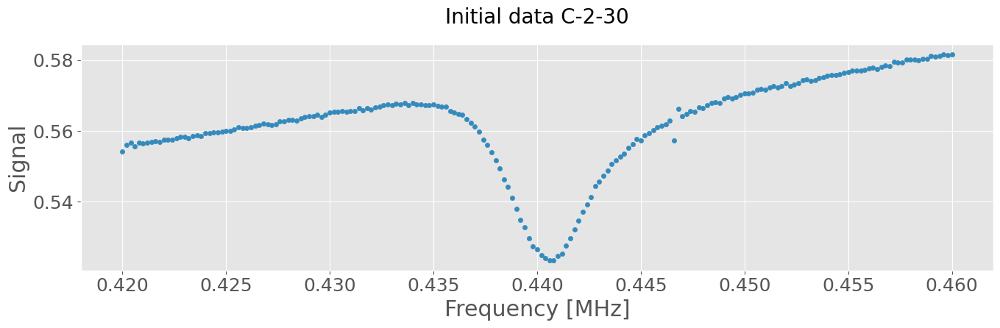

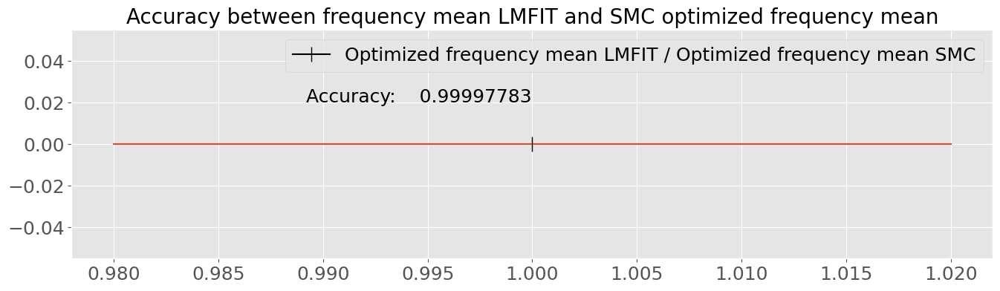

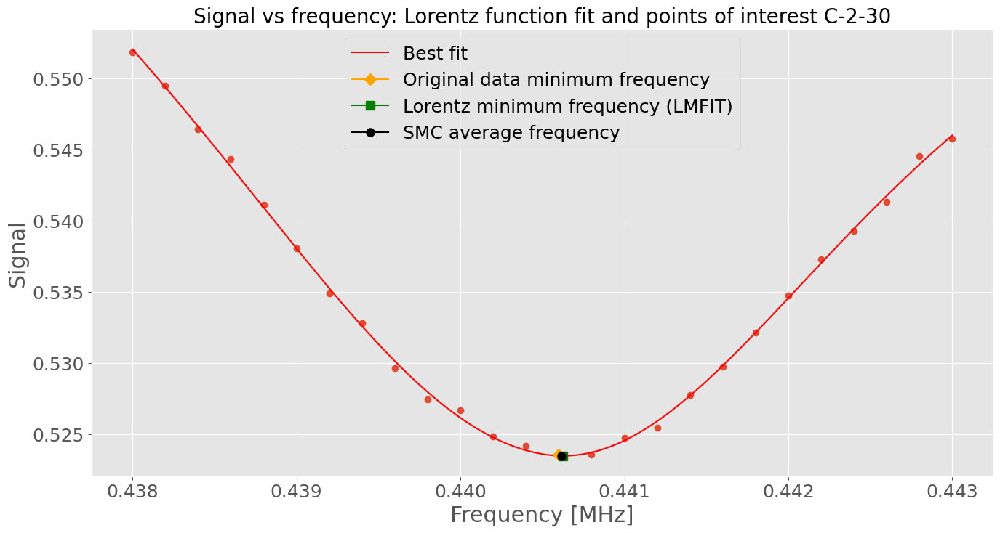



Eval appended.
--------------------------------

[[Model]]
    (Model(linear) + Model(split_lorentzian))
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 145
    # data points      = 26
    # variables        = 6
    chi-square         = 1.4157e-06
    reduced chi-square = 7.0783e-08
    Akaike info crit   = -422.876225
    Bayesian info crit = -415.327646
    R-squared          = 0.99983741
[[Variables]]
    amplitude: -6.7751e-04 +/- 1.4333e-05 (2.12%) (init = 0.0005774035)
    center:     0.44013939 +/- 6.9807e-06 (0.00%) (init = 0.4395333)
    sigma:      0.00230684 +/- 4.0179e-05 (1.74%) (init = 0.0025)
    sigma_r:    0.00227935 +/- 4.1496e-05 (1.82%) (init = 0.0025)
    fwhm:       0.00458619 +/- 4.9262e-05 (1.07%) == 'sigma+sigma_r'
    height:    -0.09404734 +/- 0.00100065 (1.06%) == '2*amplitude/3.1415927/max(0.0000000, (sigma+sigma_r))'
    slope:     -3.88969463 +/- 0.28060961 (7.21%) (init = 0)
    intercept:  2.28968504 +/- 0.12343619 (5.39%)

<Figure size 640x480 with 0 Axes>

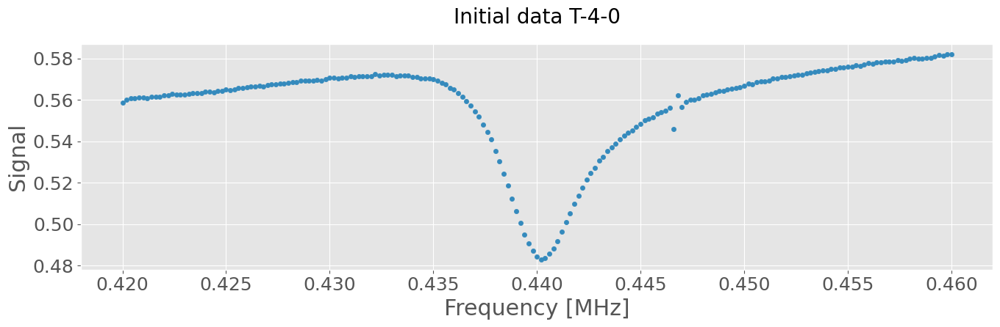

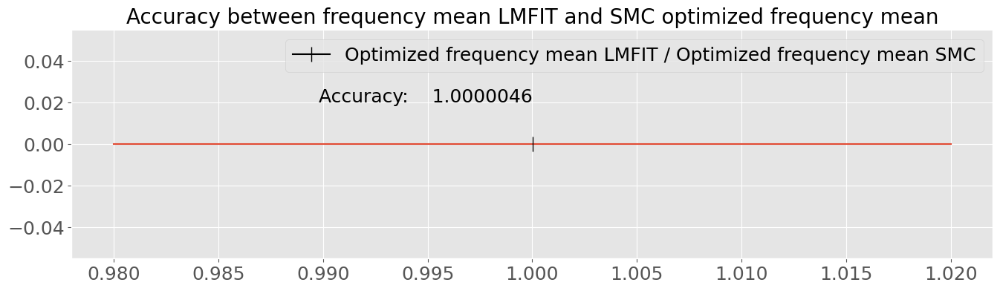

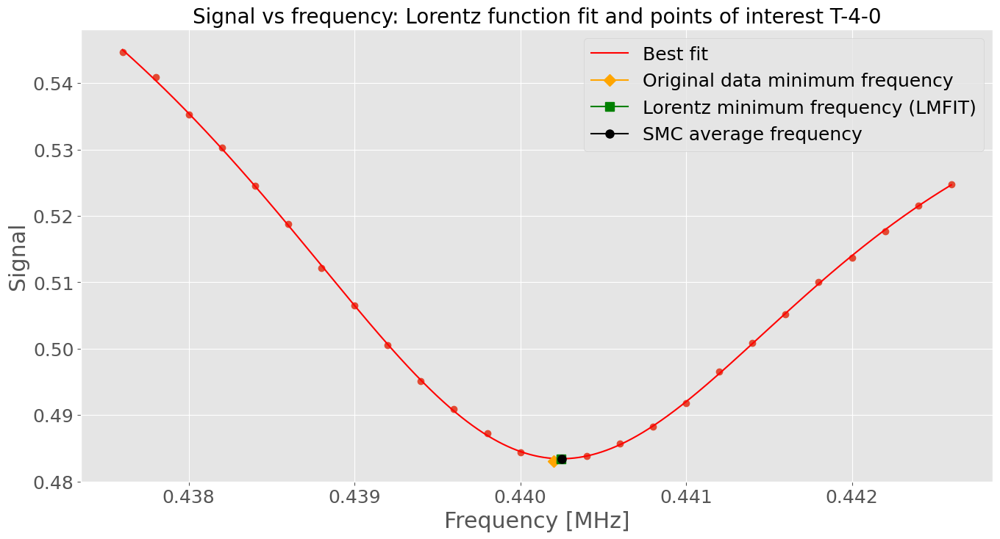



Eval appended.
--------------------------------

[[Model]]
    (Model(linear) + Model(split_lorentzian))
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 75
    # data points      = 26
    # variables        = 6
    chi-square         = 1.3875e-06
    reduced chi-square = 6.9377e-08
    Akaike info crit   = -423.397970
    Bayesian info crit = -415.849391
    R-squared          = 0.99981279
[[Variables]]
    amplitude: -6.6397e-04 +/- 1.4911e-05 (2.25%) (init = 0.0005292489)
    center:     0.44003745 +/- 7.2123e-06 (0.00%) (init = 0.43978)
    sigma:      0.00230787 +/- 4.4732e-05 (1.94%) (init = 0.0025)
    sigma_r:    0.00234233 +/- 4.2091e-05 (1.80%) (init = 0.0025)
    fwhm:       0.00465020 +/- 5.2595e-05 (1.13%) == 'sigma+sigma_r'
    height:    -0.09089866 +/- 0.00103405 (1.14%) == '2*amplitude/3.1415927/max(0.0000000, (sigma+sigma_r))'
    slope:     -3.44763413 +/- 0.28577469 (8.29%) (init = 0)
    intercept:  2.09347513 +/- 0.12589001 (6.01%) (i

<Figure size 640x480 with 0 Axes>

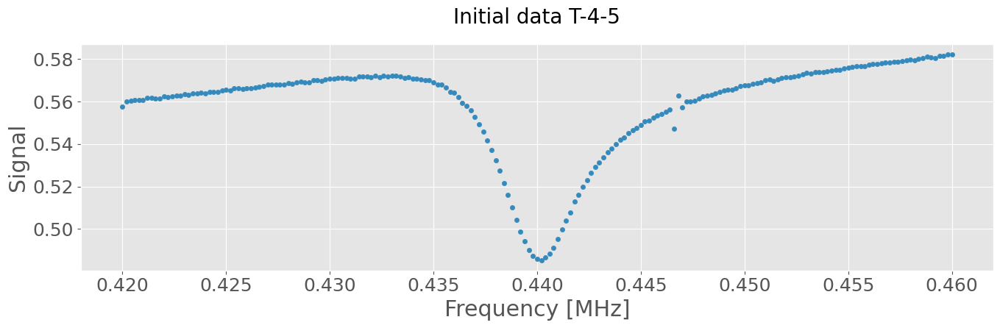

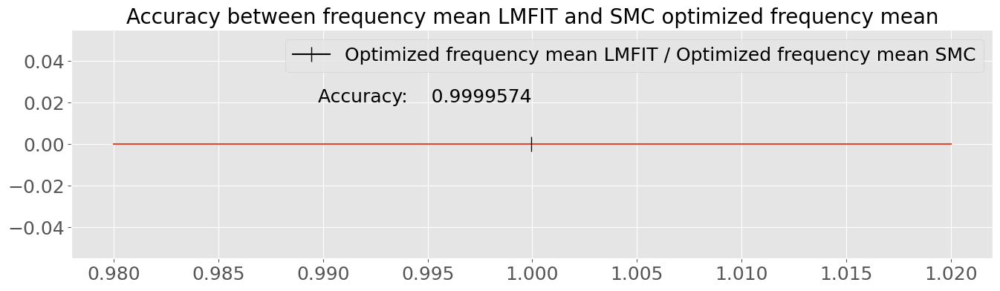

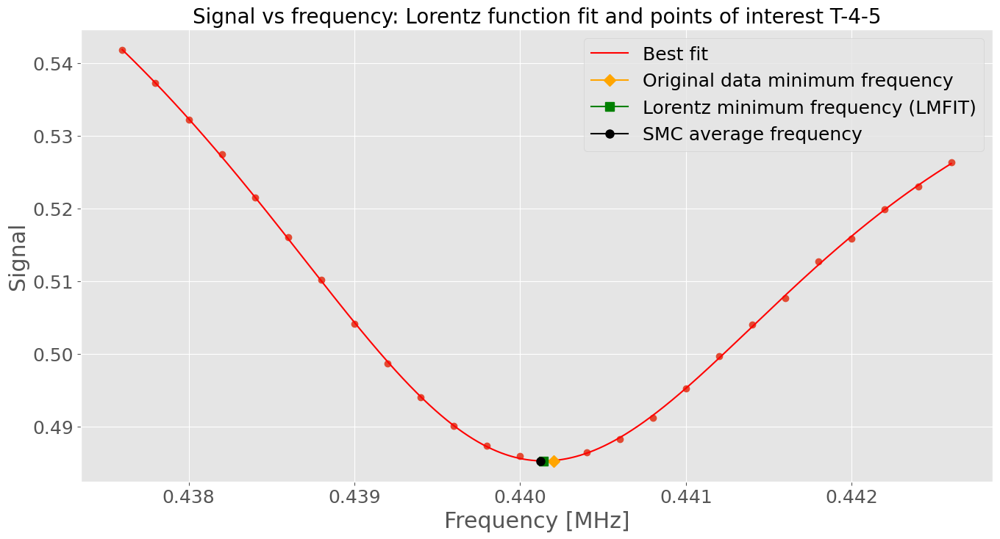



Eval appended.
--------------------------------

[[Model]]
    (Model(linear) + Model(split_lorentzian))
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 80
    # data points      = 26
    # variables        = 6
    chi-square         = 1.5722e-06
    reduced chi-square = 7.8609e-08
    Akaike info crit   = -420.149822
    Bayesian info crit = -412.601243
    R-squared          = 0.99978783
[[Variables]]
    amplitude: -6.7443e-04 +/- 1.6633e-05 (2.47%) (init = 0.0005343808)
    center:     0.44003958 +/- 7.6667e-06 (0.00%) (init = 0.43978)
    sigma:      0.00239897 +/- 5.2339e-05 (2.18%) (init = 0.0025)
    sigma_r:    0.00228285 +/- 4.1647e-05 (1.82%) (init = 0.0025)
    fwhm:       0.00468182 +/- 5.8069e-05 (1.24%) == 'sigma+sigma_r'
    height:    -0.09170704 +/- 0.00114558 (1.25%) == '2*amplitude/3.1415927/max(0.0000000, (sigma+sigma_r))'
    slope:     -4.03608428 +/- 0.31171131 (7.72%) (init = 0)
    intercept:  2.35333383 +/- 0.13748400 (5.84%) (i

<Figure size 640x480 with 0 Axes>

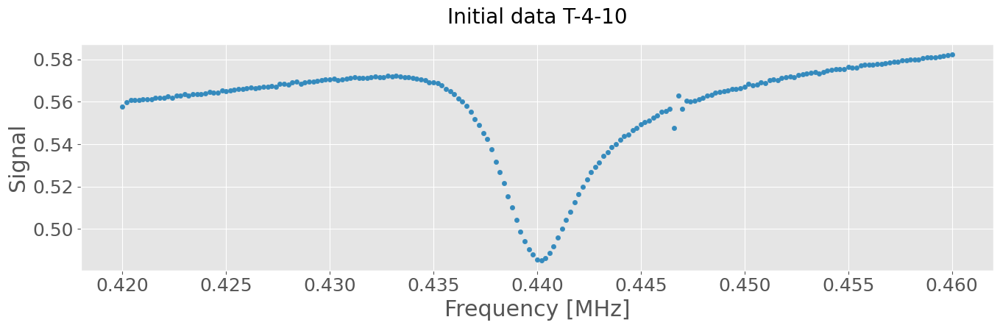

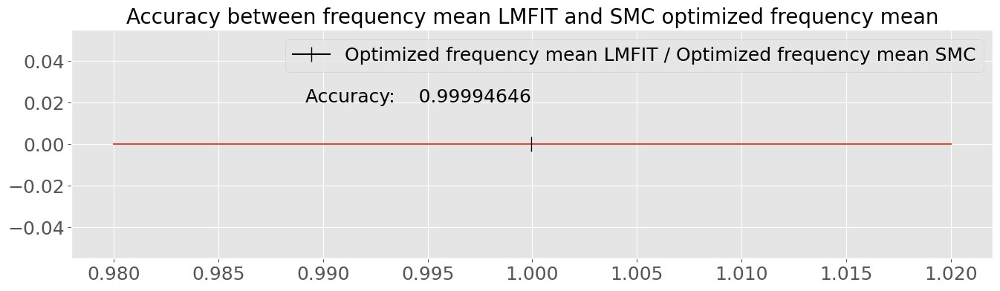

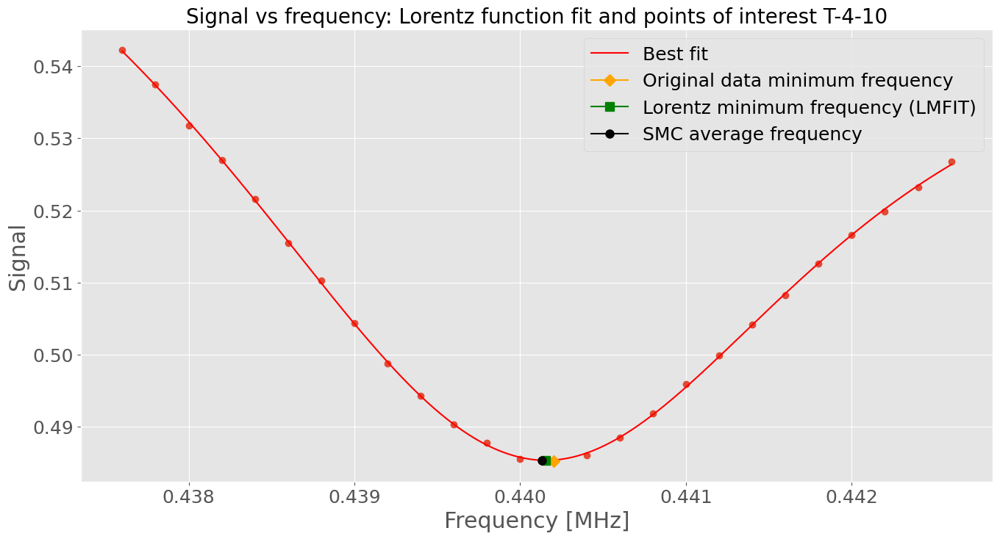



Eval appended.
--------------------------------

[[Model]]
    (Model(linear) + Model(split_lorentzian))
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 50
    # data points      = 26
    # variables        = 6
    chi-square         = 9.9293e-07
    reduced chi-square = 4.9646e-08
    Akaike info crit   = -432.098361
    Bayesian info crit = -424.549782
    R-squared          = 0.99986229
[[Variables]]
    amplitude: -6.5384e-04 +/- 1.2448e-05 (1.90%) (init = 0.0005196277)
    center:     0.44001374 +/- 6.1542e-06 (0.00%) (init = 0.43978)
    sigma:      0.00227509 +/- 3.7593e-05 (1.65%) (init = 0.0025)
    sigma_r:    0.00235622 +/- 3.5891e-05 (1.52%) (init = 0.0025)
    fwhm:       0.00463131 +/- 4.4451e-05 (0.96%) == 'sigma+sigma_r'
    height:    -0.08987727 +/- 8.6657e-04 (0.96%) == '2*amplitude/3.1415927/max(0.0000000, (sigma+sigma_r))'
    slope:     -3.22487055 +/- 0.24004221 (7.44%) (init = 0)
    intercept:  1.99474568 +/- 0.10575036 (5.30%) (i

<Figure size 640x480 with 0 Axes>

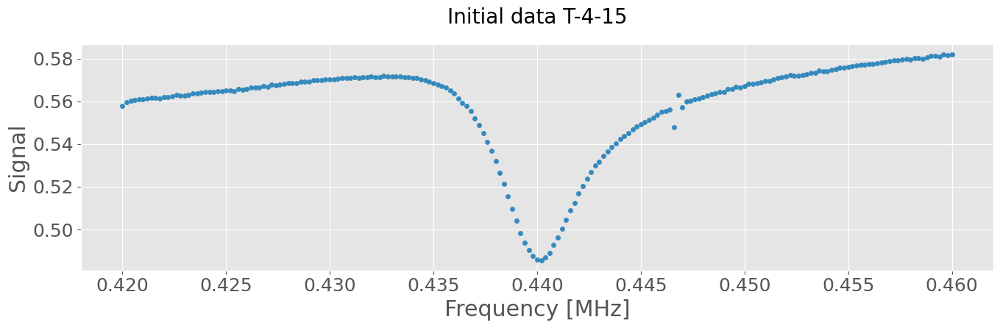

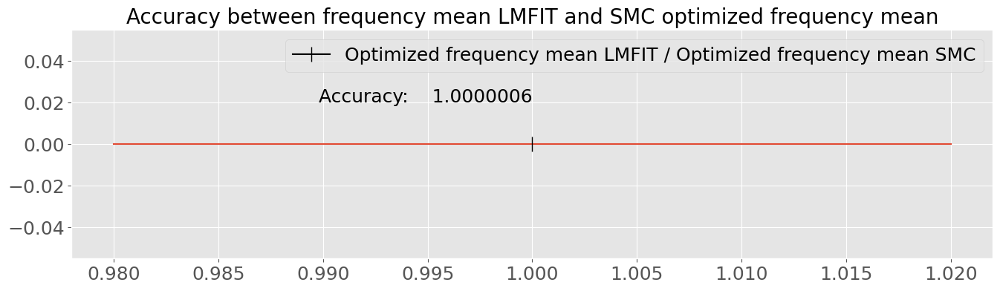

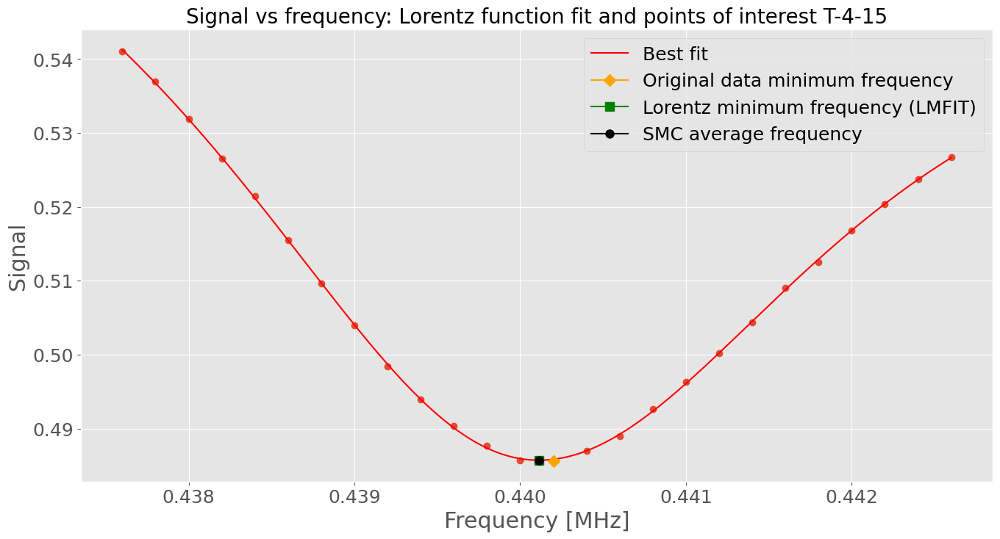



Eval appended.
--------------------------------

[[Model]]
    (Model(linear) + Model(split_lorentzian))
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 50
    # data points      = 26
    # variables        = 6
    chi-square         = 1.4157e-06
    reduced chi-square = 7.0787e-08
    Akaike info crit   = -422.874681
    Bayesian info crit = -415.326102
    R-squared          = 0.99980407
[[Variables]]
    amplitude: -6.5966e-04 +/- 1.5343e-05 (2.33%) (init = 0.0005198858)
    center:     0.44002814 +/- 7.3491e-06 (0.00%) (init = 0.4399636)
    sigma:      0.00235873 +/- 4.8613e-05 (2.06%) (init = 0.0025)
    sigma_r:    0.00229110 +/- 4.0141e-05 (1.75%) (init = 0.0025)
    fwhm:       0.00464982 +/- 5.4464e-05 (1.17%) == 'sigma+sigma_r'
    height:    -0.09031559 +/- 0.00106329 (1.18%) == '2*amplitude/3.1415927/max(0.0000000, (sigma+sigma_r))'
    slope:     -3.75552116 +/- 0.29136160 (7.76%) (init = 0)
    intercept:  2.22880934 +/- 0.12848333 (5.76%) 

<Figure size 640x480 with 0 Axes>

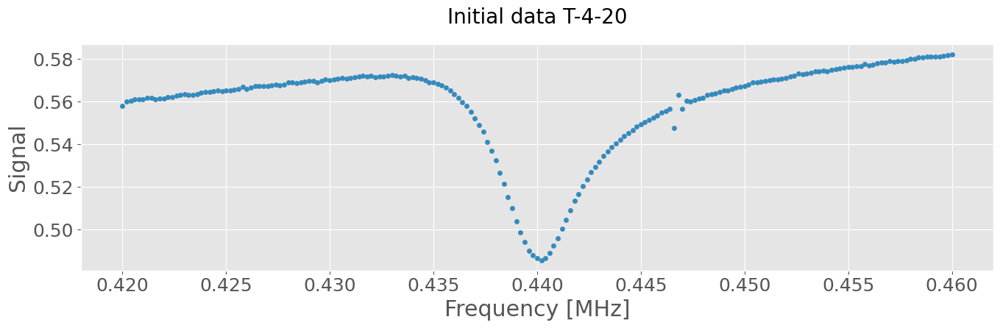

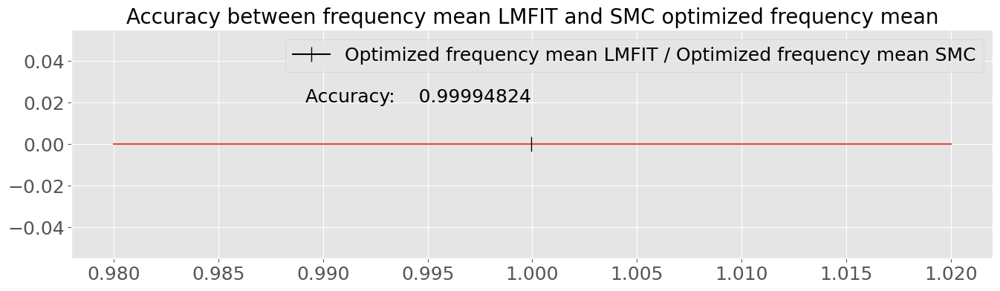

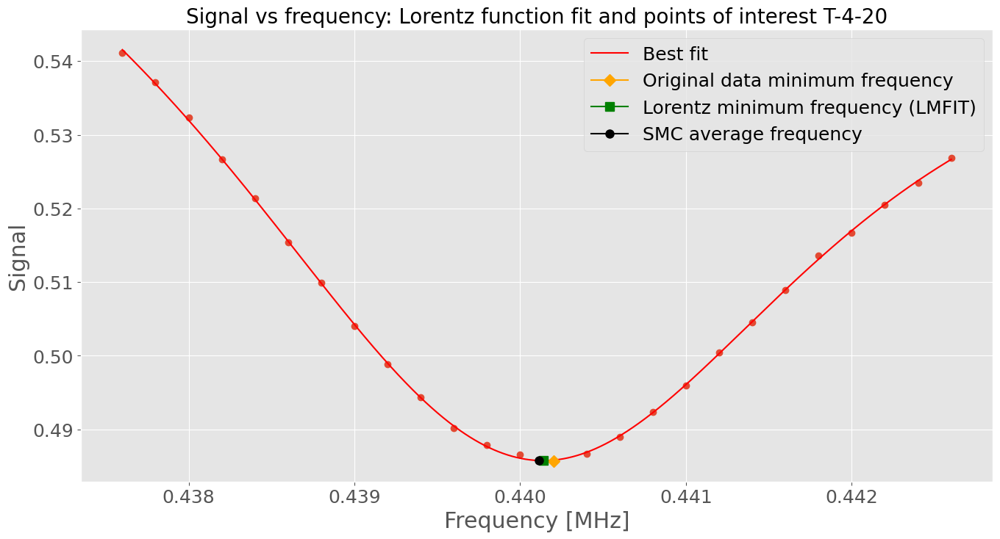



Eval appended.
--------------------------------

[[Model]]
    (Model(linear) + Model(split_lorentzian))
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 137
    # data points      = 26
    # variables        = 6
    chi-square         = 2.3245e-06
    reduced chi-square = 1.1623e-07
    Akaike info crit   = -409.982466
    Bayesian info crit = -402.433887
    R-squared          = 0.99968824
[[Variables]]
    amplitude: -6.6627e-04 +/- 2.0294e-05 (3.05%) (init = 0.0005344669)
    center:     0.43992983 +/- 9.5522e-06 (0.00%) (init = 0.4393333)
    sigma:      0.00239790 +/- 6.0233e-05 (2.51%) (init = 0.0025)
    sigma_r:    0.00232899 +/- 5.8501e-05 (2.51%) (init = 0.0025)
    fwhm:       0.00472689 +/- 7.2073e-05 (1.52%) == 'sigma+sigma_r'
    height:    -0.08973330 +/- 0.00139137 (1.55%) == '2*amplitude/3.1415927/max(0.0000000, (sigma+sigma_r))'
    slope:     -3.83742770 +/- 0.38039397 (9.91%) (init = 0)
    intercept:  2.26497121 +/- 0.16734180 (7.39%)

<Figure size 640x480 with 0 Axes>

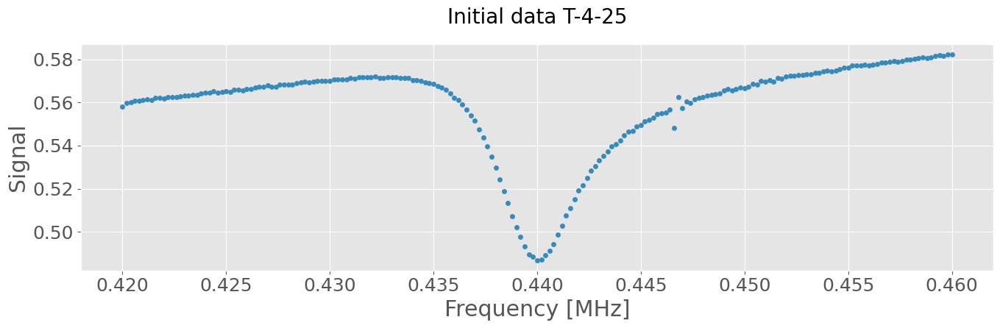

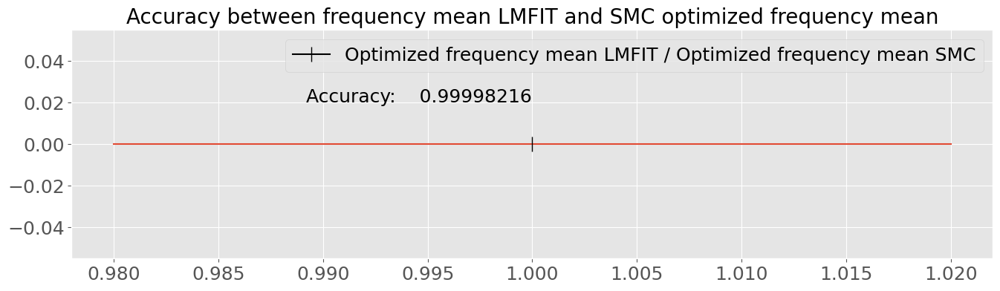

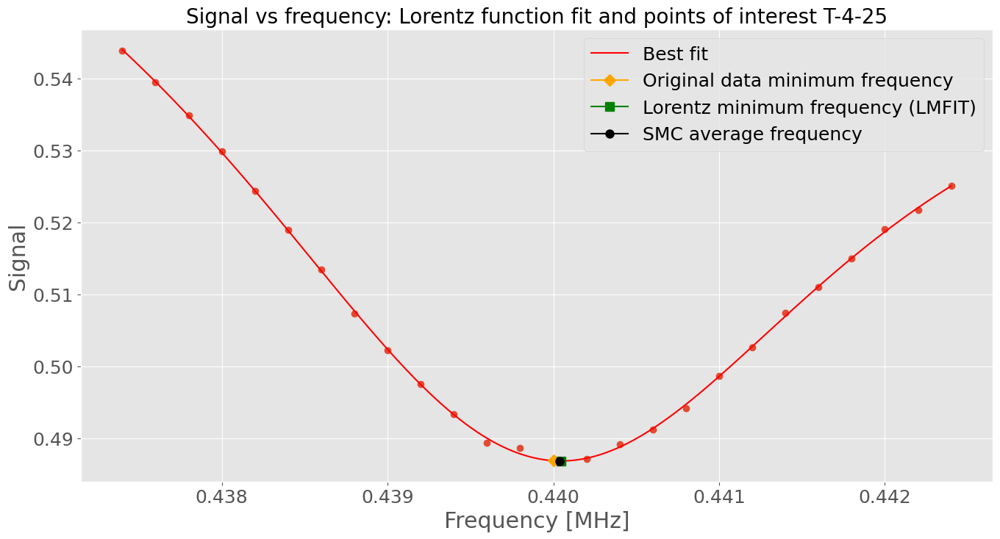



Eval appended.
--------------------------------

[[Model]]
    (Model(linear) + Model(split_lorentzian))
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 88
    # data points      = 26
    # variables        = 6
    chi-square         = 1.1615e-06
    reduced chi-square = 5.8076e-08
    Akaike info crit   = -428.020812
    Bayesian info crit = -420.472233
    R-squared          = 0.99984264
[[Variables]]
    amplitude: -6.3471e-04 +/- 1.3194e-05 (2.08%) (init = 0.0005336702)
    center:     0.43991129 +/- 6.7996e-06 (0.00%) (init = 0.43958)
    sigma:      0.00234817 +/- 4.1816e-05 (1.78%) (init = 0.0025)
    sigma_r:    0.00225964 +/- 3.8546e-05 (1.71%) (init = 0.0025)
    fwhm:       0.00460781 +/- 4.8608e-05 (1.05%) == 'sigma+sigma_r'
    height:    -0.08769274 +/- 9.1706e-04 (1.05%) == '2*amplitude/3.1415927/max(0.0000000, (sigma+sigma_r))'
    slope:     -3.93566870 +/- 0.25636290 (6.51%) (init = 0)
    intercept:  2.30587916 +/- 0.11283798 (4.89%) (i

<Figure size 640x480 with 0 Axes>

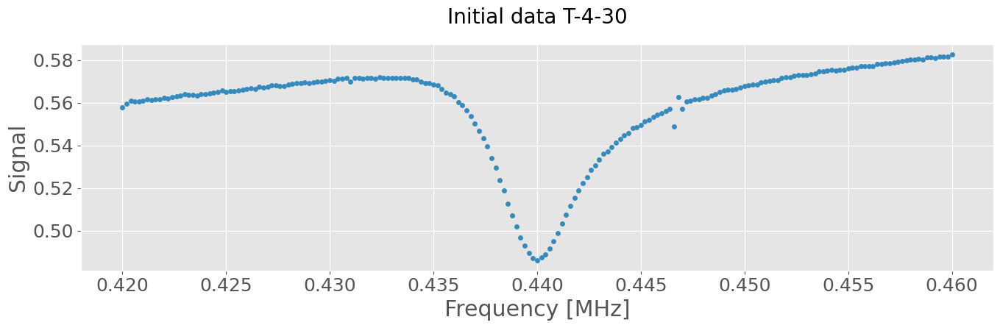

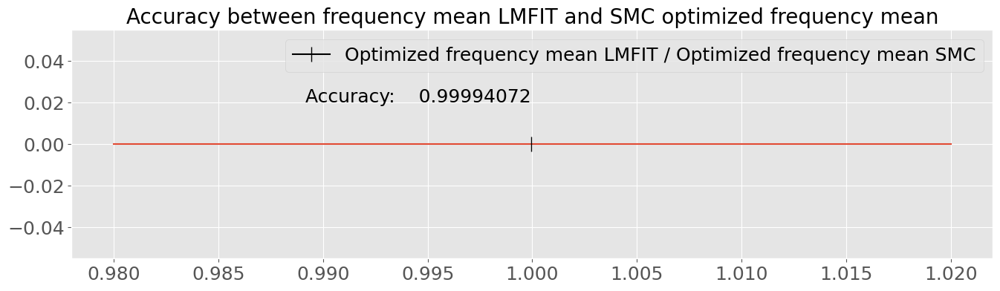

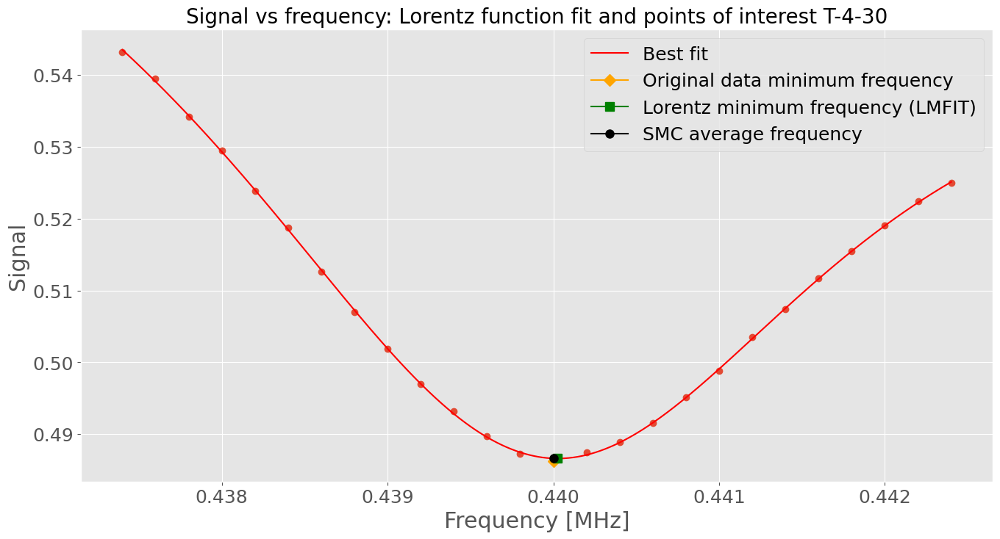



Eval appended.
--------------------------------

[[Model]]
    (Model(linear) + Model(split_lorentzian))
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 101
    # data points      = 26
    # variables        = 6
    chi-square         = 1.4636e-06
    reduced chi-square = 7.3178e-08
    Akaike info crit   = -422.011226
    Bayesian info crit = -414.462647
    R-squared          = 0.99978180
[[Variables]]
    amplitude: -6.0312e-04 +/- 1.4717e-05 (2.44%) (init = 0.00050059)
    center:     0.43973495 +/- 8.0144e-06 (0.00%) (init = 0.43938)
    sigma:      0.00232691 +/- 4.7261e-05 (2.03%) (init = 0.0025)
    sigma_r:    0.00227459 +/- 4.7129e-05 (2.07%) (init = 0.0025)
    fwhm:       0.00460150 +/- 5.6942e-05 (1.24%) == 'sigma+sigma_r'
    height:    -0.08344262 +/- 0.00102512 (1.23%) == '2*amplitude/3.1415927/max(0.0000000, (sigma+sigma_r))'
    slope:     -3.34876061 +/- 0.28689458 (8.57%) (init = 0)
    intercept:  2.04865822 +/- 0.12612307 (6.16%) (in

<Figure size 640x480 with 0 Axes>

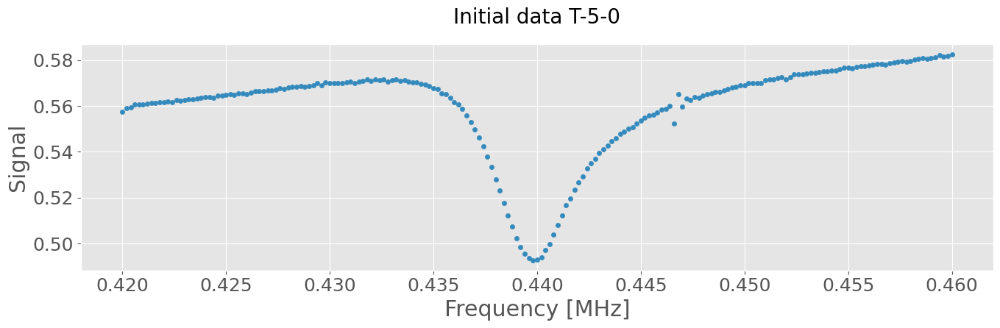

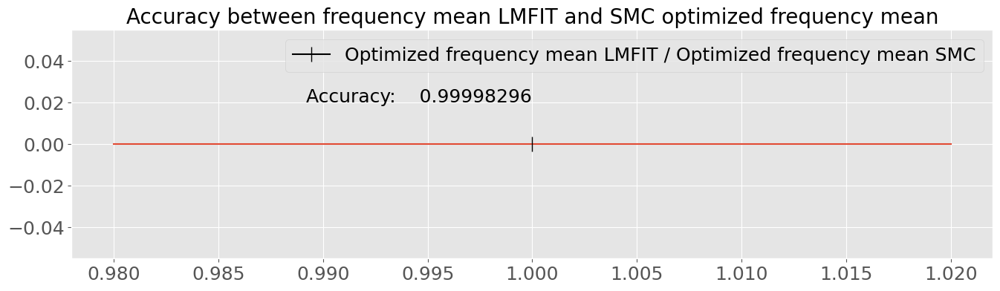

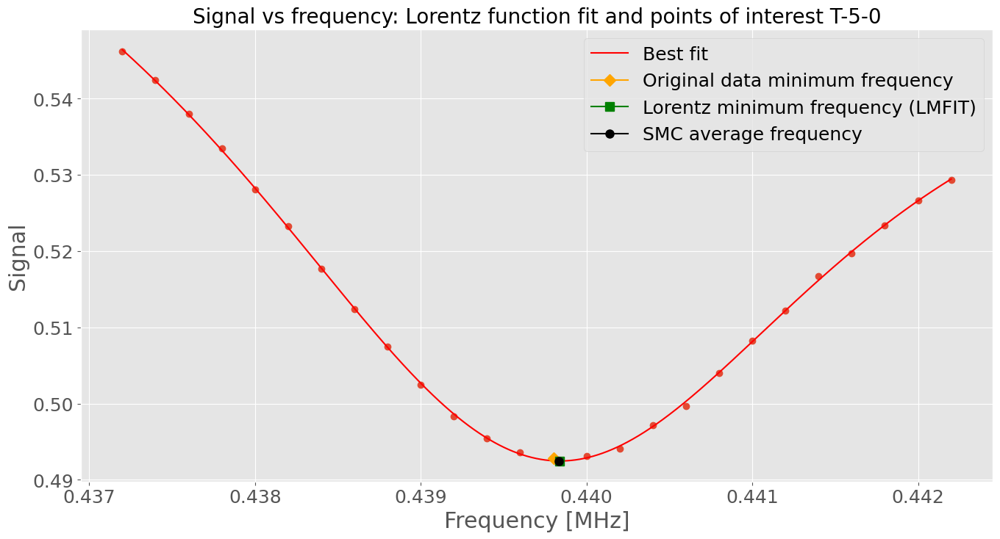



Eval appended.
--------------------------------

[[Model]]
    (Model(linear) + Model(split_lorentzian))
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 131
    # data points      = 26
    # variables        = 6
    chi-square         = 2.0778e-06
    reduced chi-square = 1.0389e-07
    Akaike info crit   = -412.899490
    Bayesian info crit = -405.350911
    R-squared          = 0.99968894
[[Variables]]
    amplitude: -6.0928e-04 +/- 1.7793e-05 (2.92%) (init = 0.0005001248)
    center:     0.43973598 +/- 9.5193e-06 (0.00%) (init = 0.43938)
    sigma:      0.00235515 +/- 5.7756e-05 (2.45%) (init = 0.0025)
    sigma_r:    0.00226679 +/- 5.5391e-05 (2.44%) (init = 0.0025)
    fwhm:       0.00462195 +/- 6.8351e-05 (1.48%) == 'sigma+sigma_r'
    height:    -0.08392073 +/- 0.00123561 (1.47%) == '2*amplitude/3.1415927/max(0.0000000, (sigma+sigma_r))'
    slope:     -3.37069904 +/- 0.34463730 (10.22%) (init = 0)
    intercept:  2.05875463 +/- 0.15155066 (7.36%) 

<Figure size 640x480 with 0 Axes>

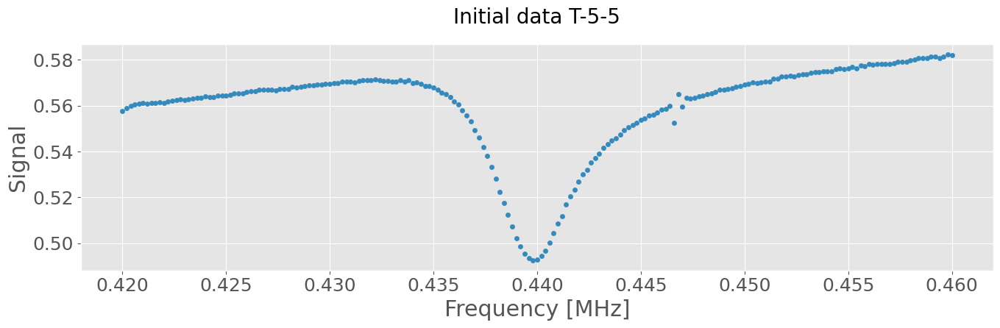

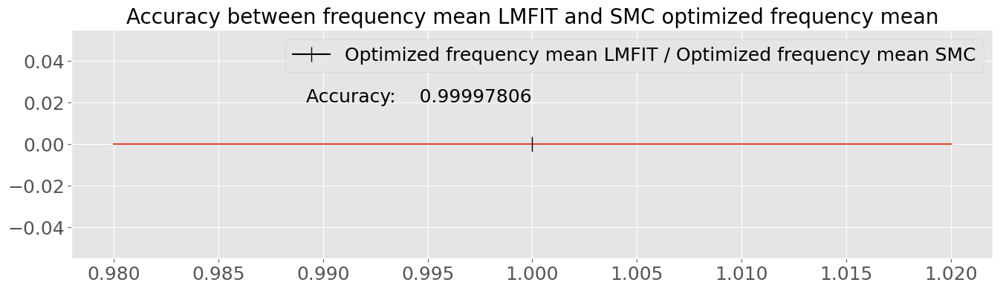

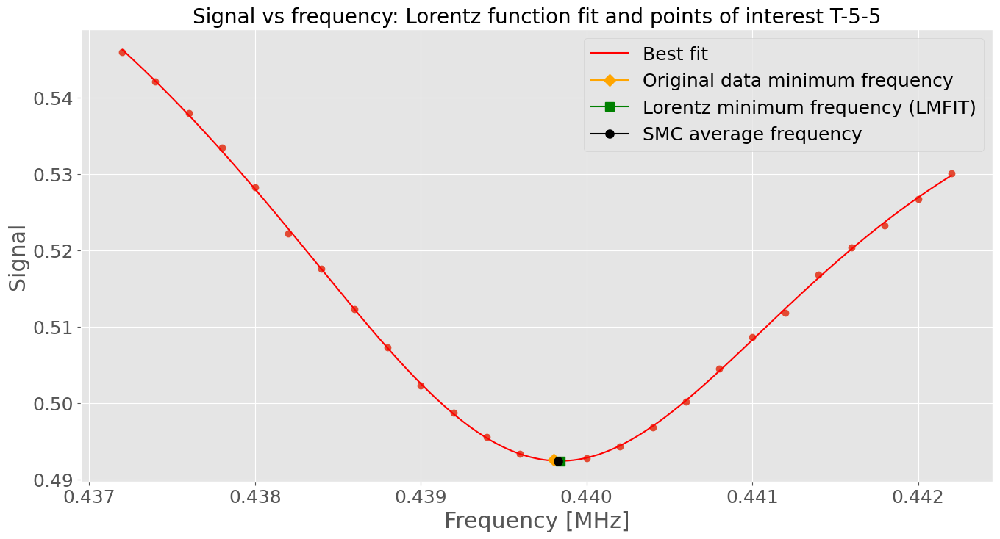



Eval appended.
--------------------------------

[[Model]]
    (Model(linear) + Model(split_lorentzian))
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 94
    # data points      = 26
    # variables        = 6
    chi-square         = 1.4286e-06
    reduced chi-square = 7.1428e-08
    Akaike info crit   = -422.640493
    Bayesian info crit = -415.091914
    R-squared          = 0.99977594
[[Variables]]
    amplitude: -6.0262e-04 +/- 1.4732e-05 (2.44%) (init = 0.0004897224)
    center:     0.43967529 +/- 7.9630e-06 (0.00%) (init = 0.43938)
    sigma:      0.00232513 +/- 4.9060e-05 (2.11%) (init = 0.0025)
    sigma_r:    0.00228953 +/- 4.5341e-05 (1.98%) (init = 0.0025)
    fwhm:       0.00461467 +/- 5.7132e-05 (1.24%) == 'sigma+sigma_r'
    height:    -0.08313514 +/- 0.00102406 (1.23%) == '2*amplitude/3.1415927/max(0.0000000, (sigma+sigma_r))'
    slope:     -3.27672993 +/- 0.28544622 (8.71%) (init = 0)
    intercept:  2.01697482 +/- 0.12561258 (6.23%) (i

<Figure size 640x480 with 0 Axes>

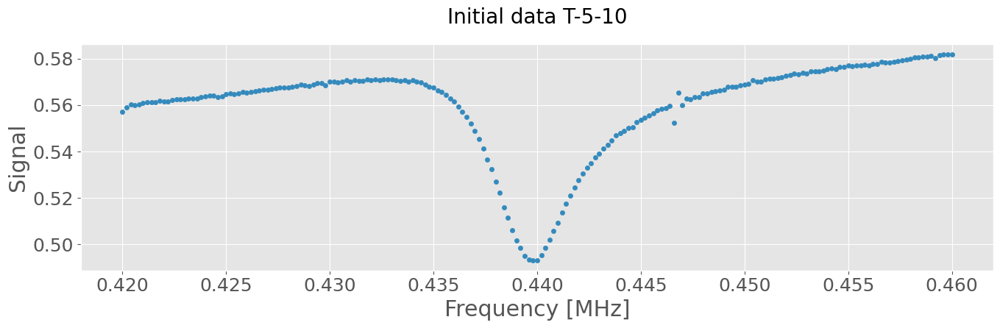

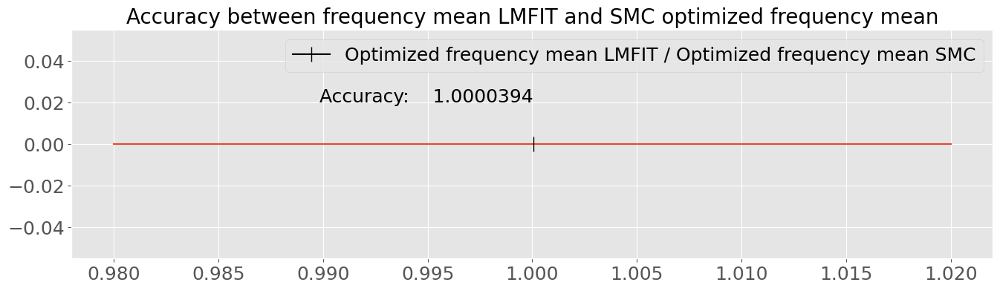

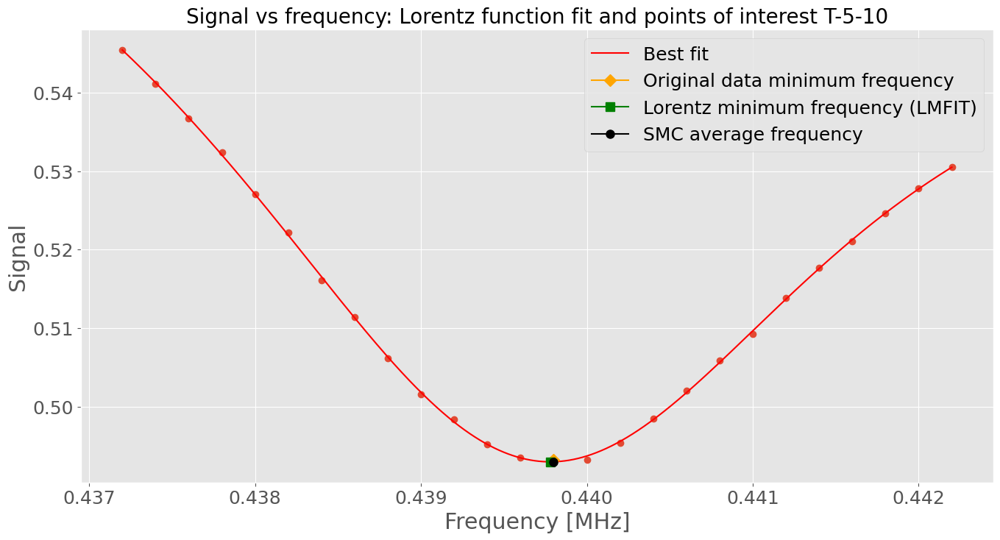



Eval appended.
--------------------------------

[[Model]]
    (Model(linear) + Model(split_lorentzian))
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 140
    # data points      = 26
    # variables        = 6
    chi-square         = 1.0832e-06
    reduced chi-square = 5.4162e-08
    Akaike info crit   = -429.835087
    Bayesian info crit = -422.286507
    R-squared          = 0.99982854
[[Variables]]
    amplitude: -5.5947e-04 +/- 1.1429e-05 (2.04%) (init = 0.000484921)
    center:     0.43966679 +/- 7.0615e-06 (0.00%) (init = 0.43938)
    sigma:      0.00225455 +/- 4.1182e-05 (1.83%) (init = 0.0025)
    sigma_r:    0.00219614 +/- 3.6665e-05 (1.67%) (init = 0.0025)
    fwhm:       0.00445069 +/- 4.6903e-05 (1.05%) == 'sigma+sigma_r'
    height:    -0.08002635 +/- 8.1071e-04 (1.01%) == '2*amplitude/3.1415927/max(0.0000000, (sigma+sigma_r))'
    slope:     -3.45315882 +/- 0.23272853 (6.74%) (init = 0)
    intercept:  2.09141313 +/- 0.10244571 (4.90%) (i

<Figure size 640x480 with 0 Axes>

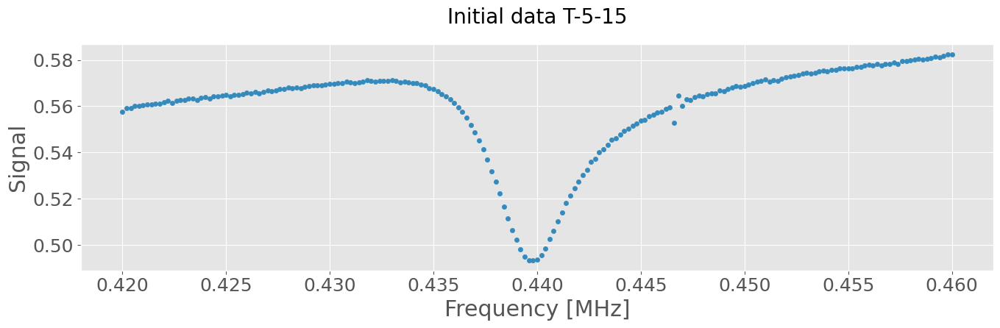

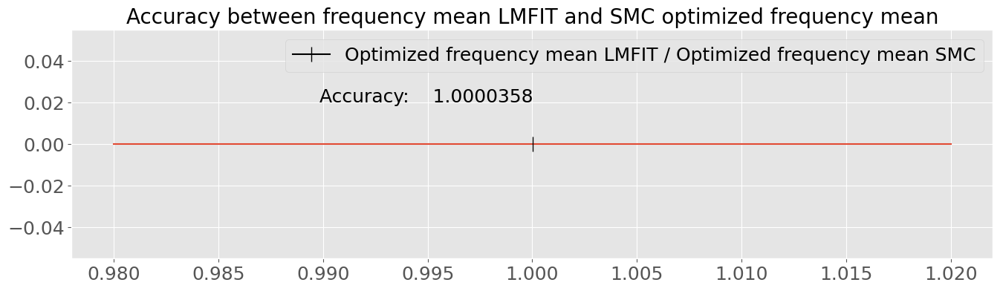

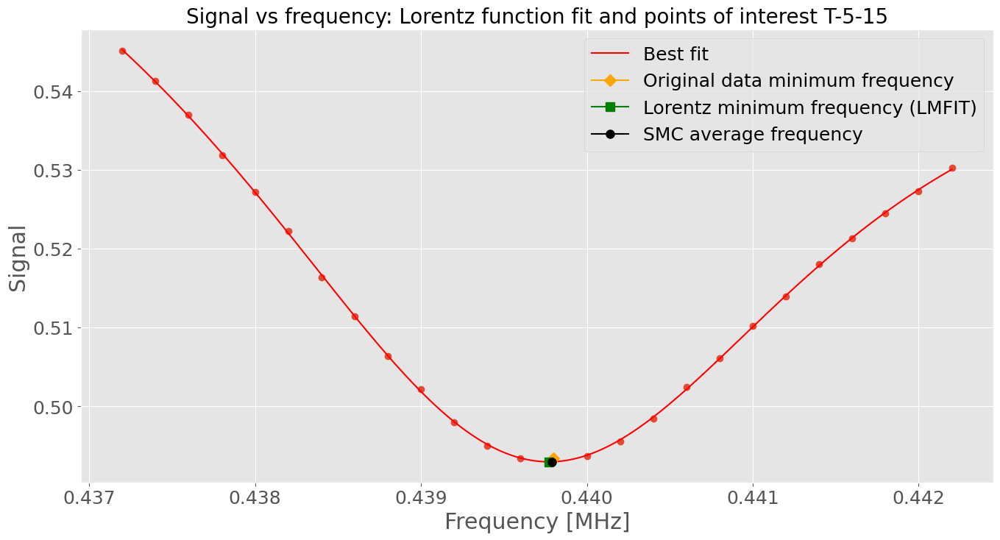



Eval appended.
--------------------------------

[[Model]]
    (Model(linear) + Model(split_lorentzian))
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 160
    # data points      = 26
    # variables        = 6
    chi-square         = 1.0491e-06
    reduced chi-square = 5.2453e-08
    Akaike info crit   = -430.668353
    Bayesian info crit = -423.119773
    R-squared          = 0.99983438
[[Variables]]
    amplitude: -5.6381e-04 +/- 1.1347e-05 (2.01%) (init = 0.0004858139)
    center:     0.43967258 +/- 6.9306e-06 (0.00%) (init = 0.43938)
    sigma:      0.00225857 +/- 4.0357e-05 (1.79%) (init = 0.0025)
    sigma_r:    0.00220713 +/- 3.6534e-05 (1.66%) (init = 0.0025)
    fwhm:       0.00446570 +/- 4.6289e-05 (1.04%) == 'sigma+sigma_r'
    height:    -0.08037552 +/- 8.0340e-04 (1.00%) == '2*amplitude/3.1415927/max(0.0000000, (sigma+sigma_r))'
    slope:     -3.35918995 +/- 0.23021053 (6.85%) (init = 0)
    intercept:  2.05038304 +/- 0.10132114 (4.94%) (

<Figure size 640x480 with 0 Axes>

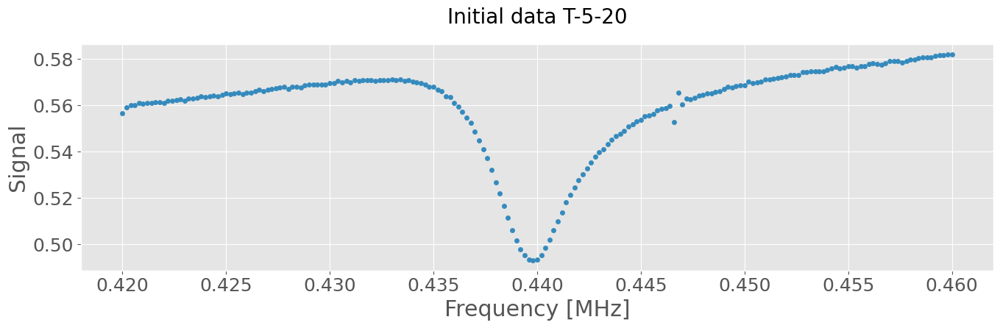

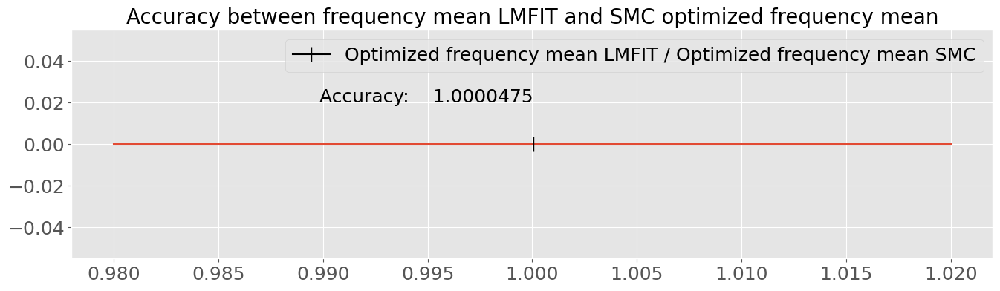

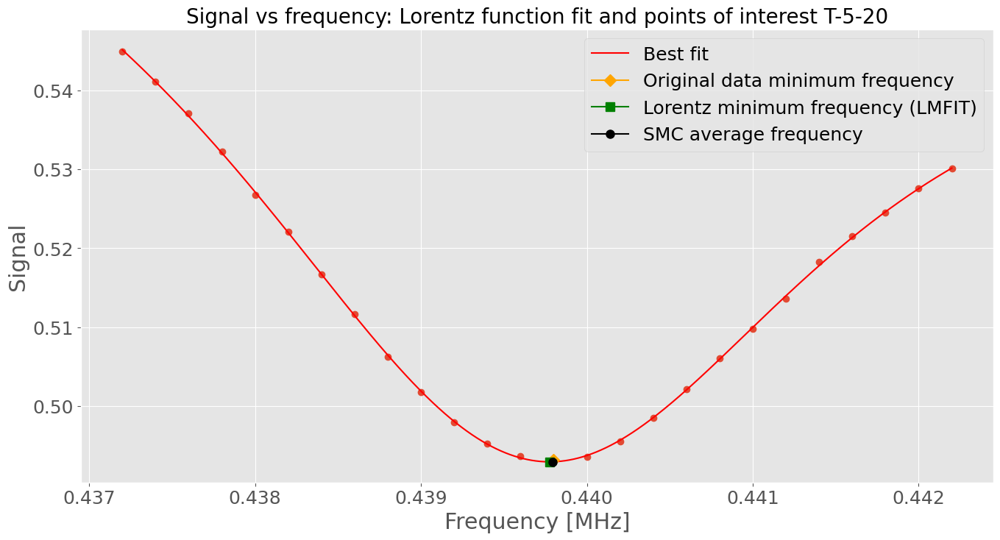



Eval appended.
--------------------------------

[[Model]]
    (Model(linear) + Model(split_lorentzian))
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 81
    # data points      = 26
    # variables        = 6
    chi-square         = 1.6344e-06
    reduced chi-square = 8.1722e-08
    Akaike info crit   = -419.139930
    Bayesian info crit = -411.591351
    R-squared          = 0.99974266
[[Variables]]
    amplitude: -5.8427e-04 +/- 1.5358e-05 (2.63%) (init = 0.0004897902)
    center:     0.43967779 +/- 8.5942e-06 (0.00%) (init = 0.43938)
    sigma:      0.00236953 +/- 5.5986e-05 (2.36%) (init = 0.0025)
    sigma_r:    0.00217758 +/- 4.3568e-05 (2.00%) (init = 0.0025)
    fwhm:       0.00454711 +/- 6.1295e-05 (1.35%) == 'sigma+sigma_r'
    height:    -0.08180093 +/- 0.00107063 (1.31%) == '2*amplitude/3.1415927/max(0.0000000, (sigma+sigma_r))'
    slope:     -3.90931119 +/- 0.30010378 (7.68%) (init = 0)
    intercept:  2.29378689 +/- 0.13222447 (5.76%) (i

<Figure size 640x480 with 0 Axes>

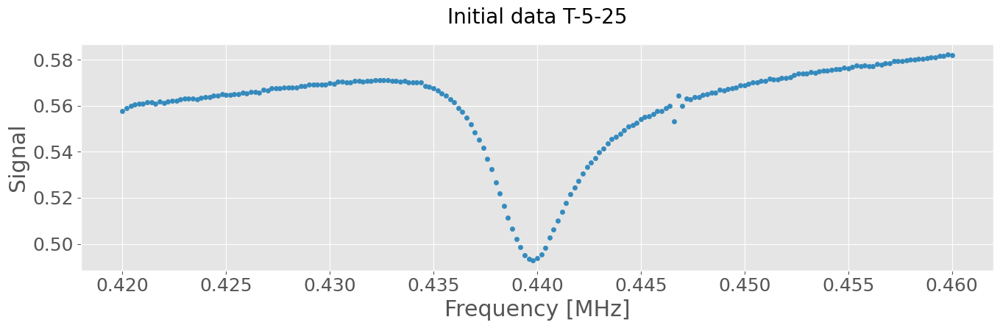

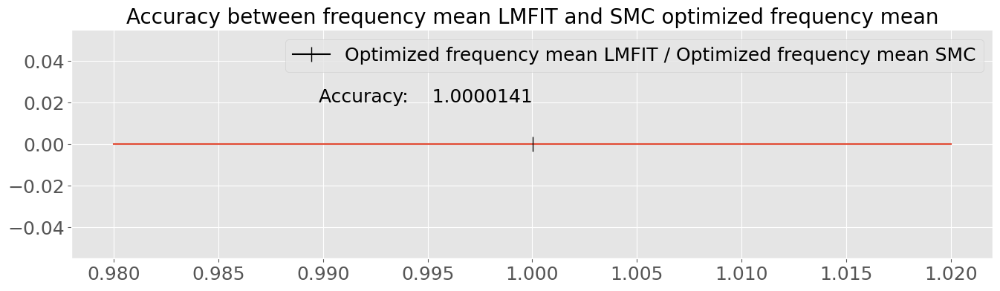

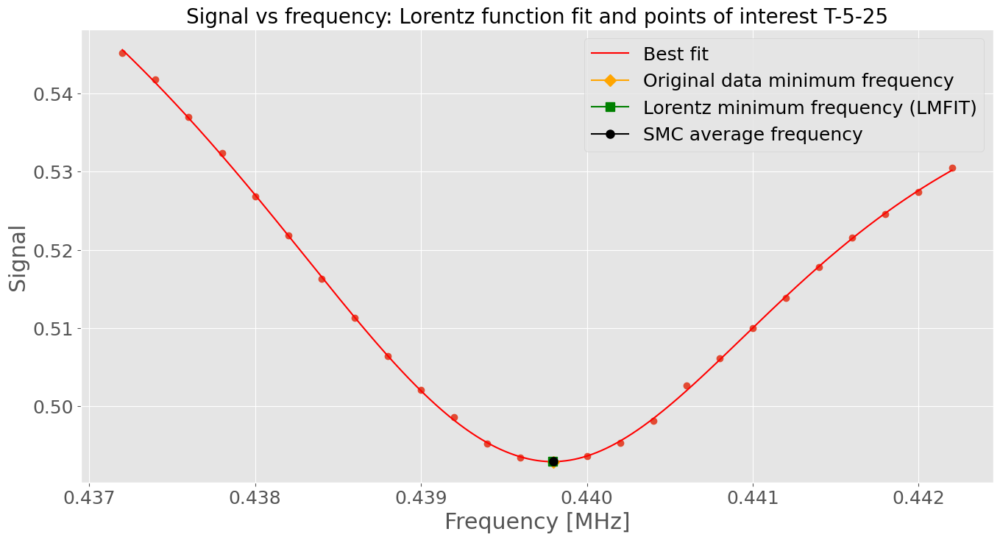



Eval appended.
--------------------------------

[[Model]]
    (Model(linear) + Model(split_lorentzian))
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 79
    # data points      = 26
    # variables        = 6
    chi-square         = 1.1760e-06
    reduced chi-square = 5.8802e-08
    Akaike info crit   = -427.697632
    Bayesian info crit = -420.149053
    R-squared          = 0.99980959
[[Variables]]
    amplitude: -5.6811e-04 +/- 1.2204e-05 (2.15%) (init = 0.0004792274)
    center:     0.43963071 +/- 7.3499e-06 (0.00%) (init = 0.43938)
    sigma:      0.00217723 +/- 4.0245e-05 (1.85%) (init = 0.0025)
    sigma_r:    0.00231782 +/- 4.2338e-05 (1.83%) (init = 0.0025)
    fwhm:       0.00449505 +/- 4.9597e-05 (1.10%) == 'sigma+sigma_r'
    height:    -0.08045980 +/- 8.6152e-04 (1.07%) == '2*amplitude/3.1415927/max(0.0000000, (sigma+sigma_r))'
    slope:     -2.67655599 +/- 0.24609797 (9.19%) (init = 0)
    intercept:  1.75047194 +/- 0.10822660 (6.18%) (i

<Figure size 640x480 with 0 Axes>

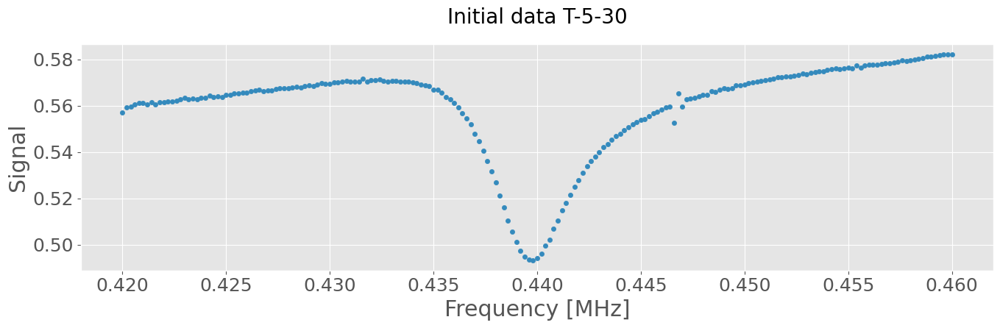

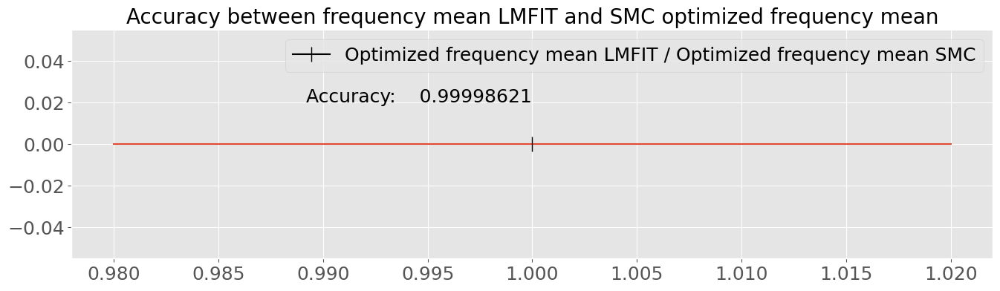

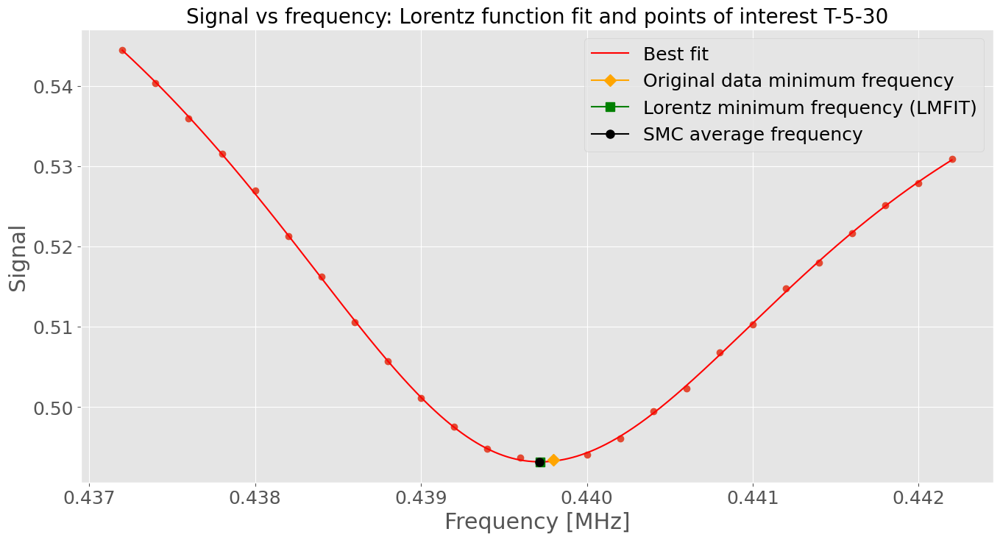



Eval appended.
--------------------------------

[[Model]]
    (Model(linear) + Model(split_lorentzian))
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 68
    # data points      = 26
    # variables        = 6
    chi-square         = 1.8290e-06
    reduced chi-square = 9.1450e-08
    Akaike info crit   = -416.215736
    Bayesian info crit = -408.667157
    R-squared          = 0.99972584
[[Variables]]
    amplitude: -5.4790e-04 +/- 1.3917e-05 (2.54%) (init = 0.0005048267)
    center:     0.44053943 +/- 9.1175e-06 (0.00%) (init = 0.44018)
    sigma:      0.00225155 +/- 5.0478e-05 (2.24%) (init = 0.0025)
    sigma_r:    0.00212053 +/- 4.6326e-05 (2.18%) (init = 0.0025)
    fwhm:       0.00437208 +/- 5.7934e-05 (1.33%) == 'sigma+sigma_r'
    height:    -0.07977929 +/- 9.9584e-04 (1.25%) == '2*amplitude/3.1415927/max(0.0000000, (sigma+sigma_r))'
    slope:     -3.47929201 +/- 0.29148187 (8.38%) (init = 0)
    intercept:  2.10762426 +/- 0.12844770 (6.09%) (i

<Figure size 640x480 with 0 Axes>

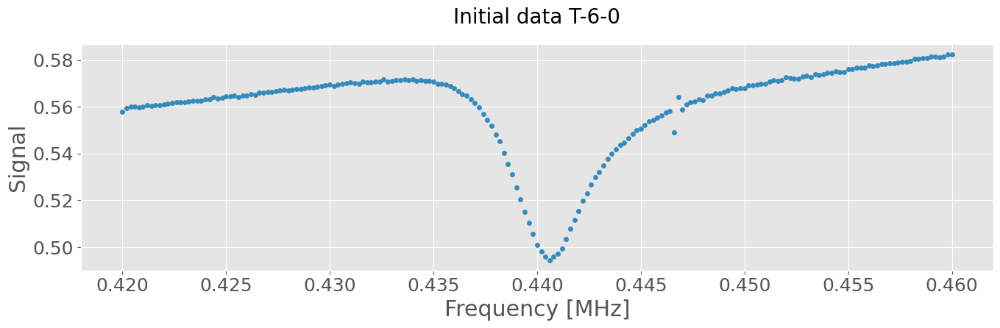

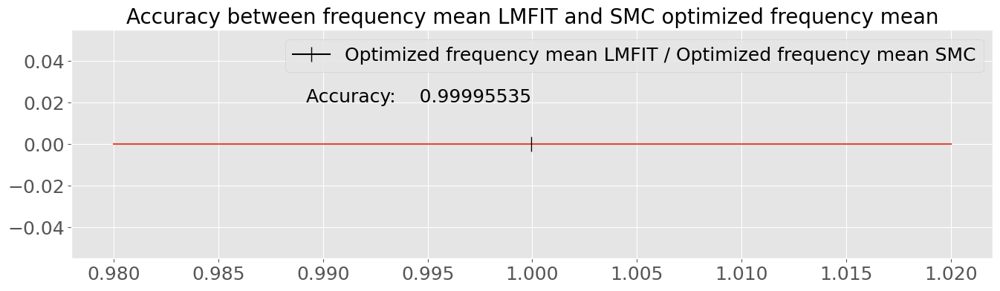

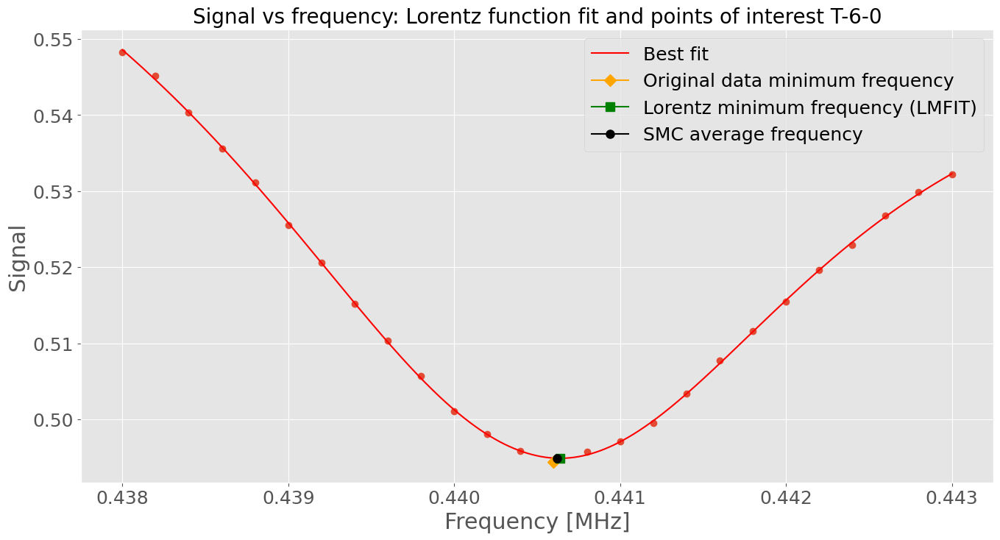



Eval appended.
--------------------------------

[[Model]]
    (Model(linear) + Model(split_lorentzian))
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 145
    # data points      = 26
    # variables        = 6
    chi-square         = 1.9583e-06
    reduced chi-square = 9.7915e-08
    Akaike info crit   = -414.439773
    Bayesian info crit = -406.891193
    R-squared          = 0.99969418
[[Variables]]
    amplitude: -5.5469e-04 +/- 1.4910e-05 (2.69%) (init = 0.0004839694)
    center:     0.44050006 +/- 9.4697e-06 (0.00%) (init = 0.44018)
    sigma:      0.00218926 +/- 5.0158e-05 (2.29%) (init = 0.0025)
    sigma_r:    0.00223018 +/- 5.2580e-05 (2.36%) (init = 0.0025)
    fwhm:       0.00441944 +/- 6.1530e-05 (1.39%) == 'sigma+sigma_r'
    height:    -0.07990298 +/- 0.00106169 (1.33%) == '2*amplitude/3.1415927/max(0.0000000, (sigma+sigma_r))'
    slope:     -2.71403956 +/- 0.30768426 (11.34%) (init = 0)
    intercept:  1.77095522 +/- 0.13549353 (7.65%) 

<Figure size 640x480 with 0 Axes>

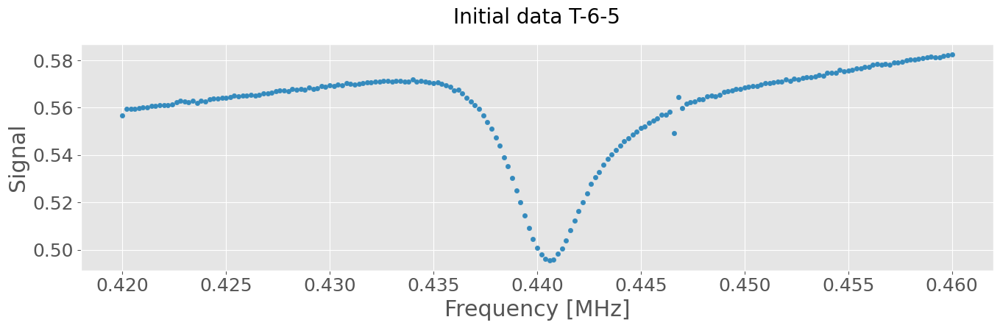

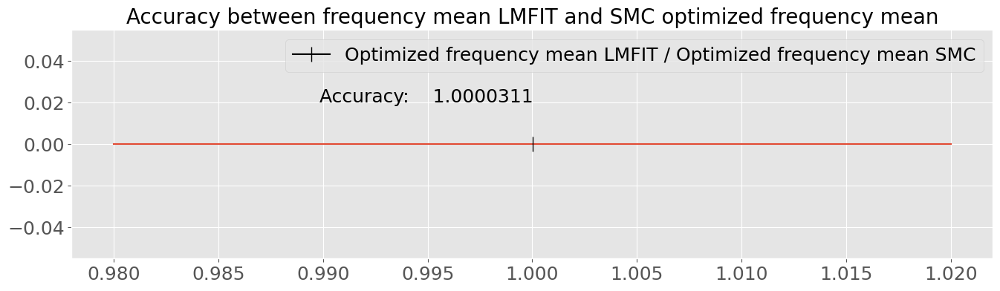

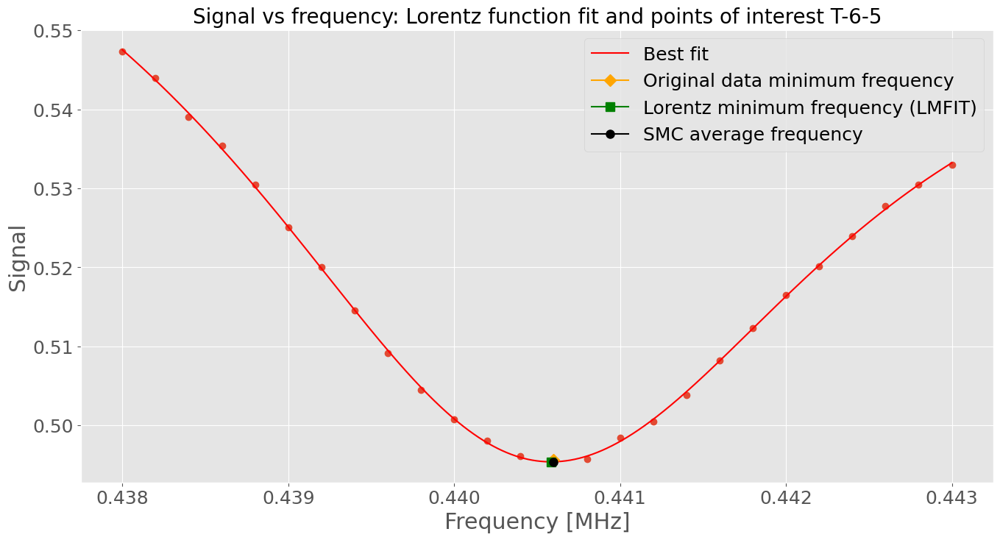



Eval appended.
--------------------------------

[[Model]]
    (Model(linear) + Model(split_lorentzian))
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 94
    # data points      = 26
    # variables        = 6
    chi-square         = 2.3188e-06
    reduced chi-square = 1.1594e-07
    Akaike info crit   = -410.046921
    Bayesian info crit = -402.498342
    R-squared          = 0.99963359
[[Variables]]
    amplitude: -5.7414e-04 +/- 1.7277e-05 (3.01%) (init = 0.0004859719)
    center:     0.44046652 +/- 1.0236e-05 (0.00%) (init = 0.44018)
    sigma:      0.00226416 +/- 6.0057e-05 (2.65%) (init = 0.0025)
    sigma_r:    0.00223530 +/- 5.5224e-05 (2.47%) (init = 0.0025)
    fwhm:       0.00449946 +/- 6.9432e-05 (1.54%) == 'sigma+sigma_r'
    height:    -0.08123391 +/- 0.00121867 (1.50%) == '2*amplitude/3.1415927/max(0.0000000, (sigma+sigma_r))'
    slope:     -3.17994461 +/- 0.34699196 (10.91%) (init = 0)
    intercept:  1.97767667 +/- 0.15298687 (7.74%) (

<Figure size 640x480 with 0 Axes>

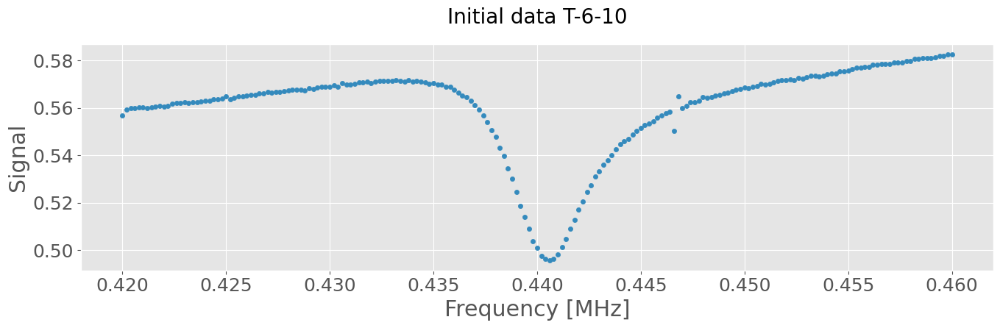

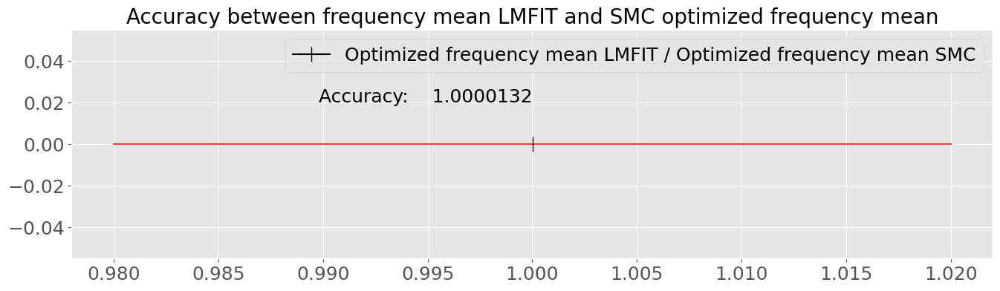

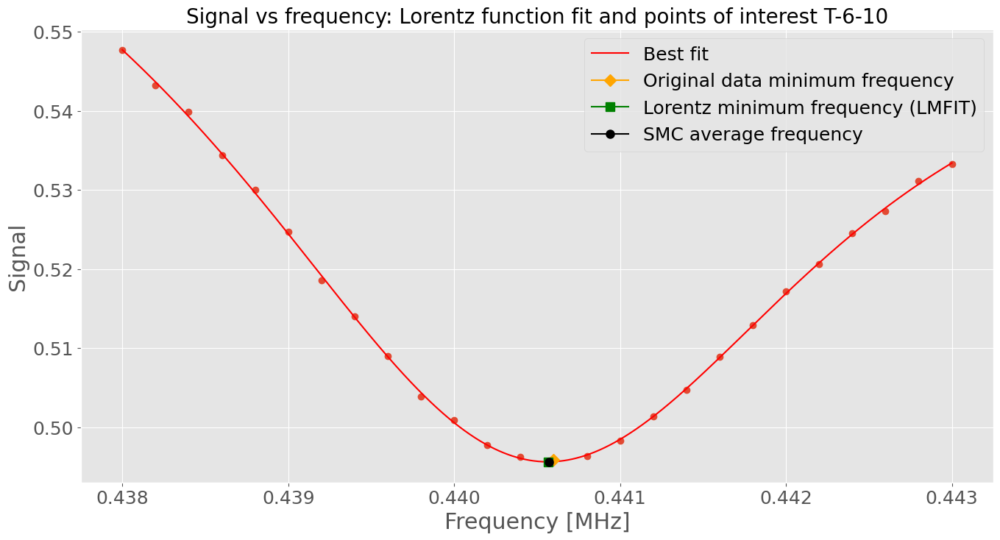



Eval appended.
--------------------------------

[[Model]]
    (Model(linear) + Model(split_lorentzian))
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 64
    # data points      = 26
    # variables        = 6
    chi-square         = 1.1702e-06
    reduced chi-square = 5.8510e-08
    Akaike info crit   = -427.827058
    Bayesian info crit = -420.278479
    R-squared          = 0.99980923
[[Variables]]
    amplitude: -5.5433e-04 +/- 1.1691e-05 (2.11%) (init = 0.0004751126)
    center:     0.44044435 +/- 7.3581e-06 (0.00%) (init = 0.4403636)
    sigma:      0.00221463 +/- 4.1832e-05 (1.89%) (init = 0.0025)
    sigma_r:    0.00221641 +/- 3.8499e-05 (1.74%) (init = 0.0025)
    fwhm:       0.00443104 +/- 4.8244e-05 (1.09%) == 'sigma+sigma_r'
    height:    -0.07964238 +/- 8.3274e-04 (1.05%) == '2*amplitude/3.1415927/max(0.0000000, (sigma+sigma_r))'
    slope:     -2.87479495 +/- 0.23984785 (8.34%) (init = 0)
    intercept:  1.84173339 +/- 0.10576227 (5.74%) 

<Figure size 640x480 with 0 Axes>

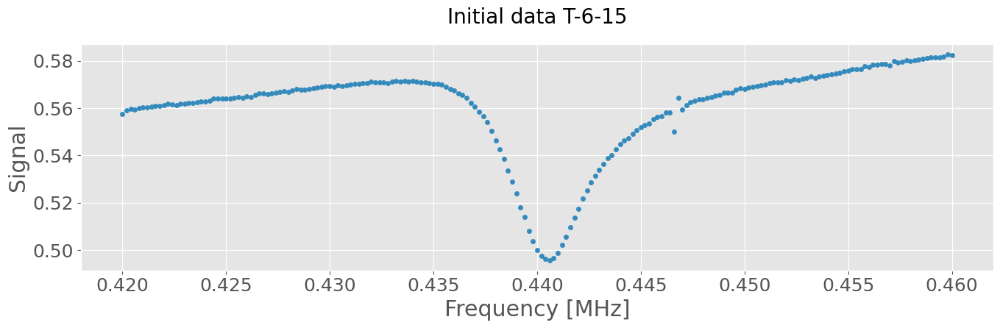

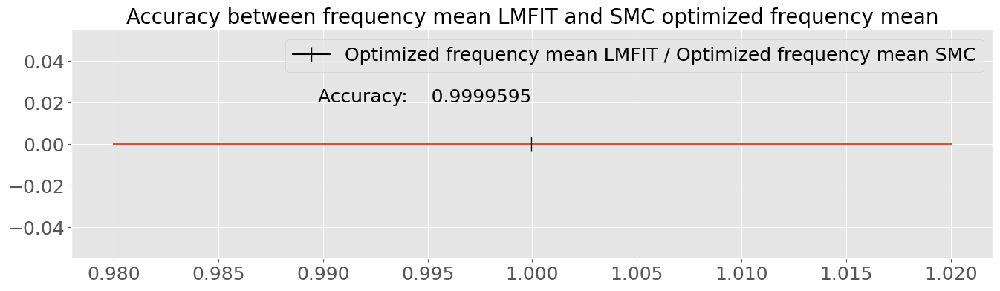

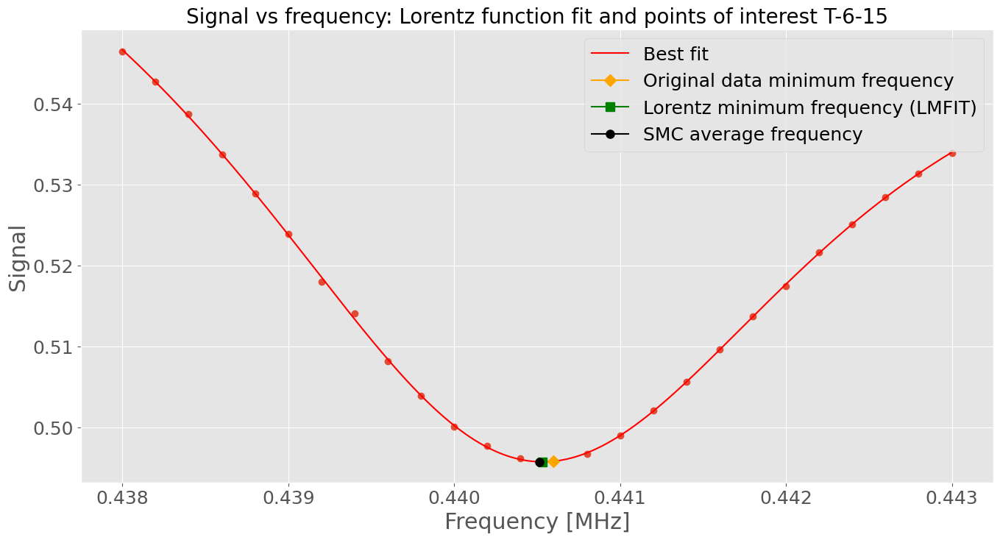



Eval appended.
--------------------------------

[[Model]]
    (Model(linear) + Model(split_lorentzian))
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 57
    # data points      = 26
    # variables        = 6
    chi-square         = 1.8054e-06
    reduced chi-square = 9.0270e-08
    Akaike info crit   = -416.553560
    Bayesian info crit = -409.004980
    R-squared          = 0.99970053
[[Variables]]
    amplitude: -5.4834e-04 +/- 1.4621e-05 (2.67%) (init = 0.0004746205)
    center:     0.44042757 +/- 9.1876e-06 (0.00%) (init = 0.4403636)
    sigma:      0.00224922 +/- 5.5155e-05 (2.45%) (init = 0.0025)
    sigma_r:    0.00216308 +/- 4.4817e-05 (2.07%) (init = 0.0025)
    fwhm:       0.00441230 +/- 6.0860e-05 (1.38%) == 'sigma+sigma_r'
    height:    -0.07911553 +/- 0.00104321 (1.32%) == '2*amplitude/3.1415927/max(0.0000000, (sigma+sigma_r))'
    slope:     -3.20047823 +/- 0.29871113 (9.33%) (init = 0)
    intercept:  1.98471969 +/- 0.13184982 (6.64%) 

<Figure size 640x480 with 0 Axes>

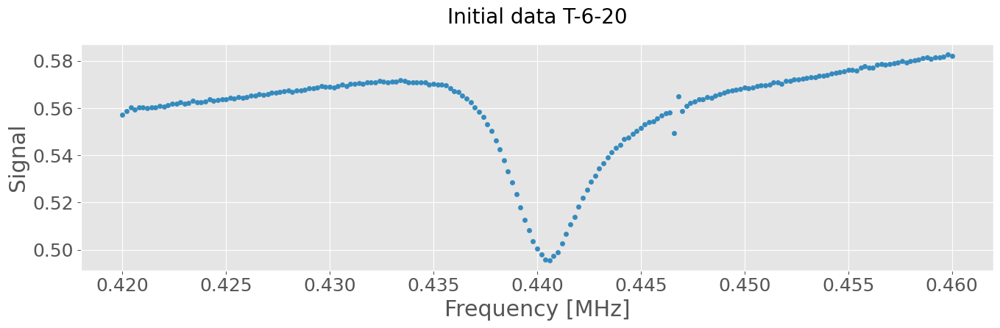

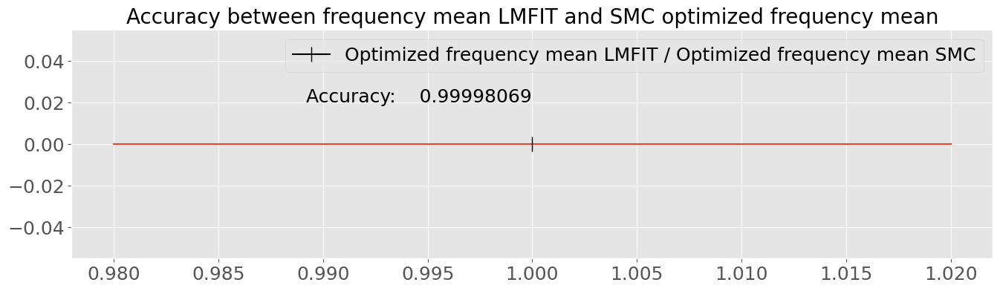

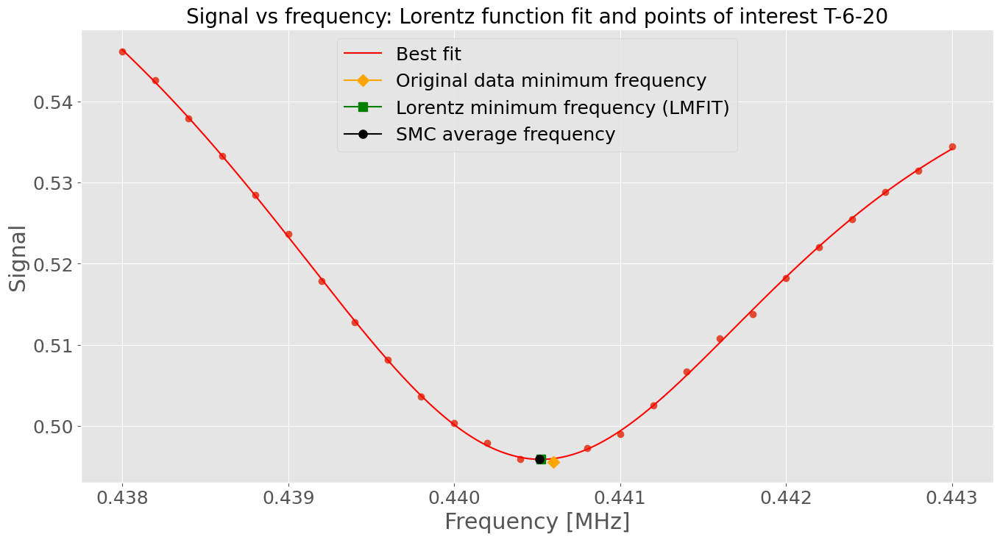



Eval appended.
--------------------------------

[[Model]]
    (Model(linear) + Model(split_lorentzian))
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 71
    # data points      = 26
    # variables        = 6
    chi-square         = 2.0869e-06
    reduced chi-square = 1.0434e-07
    Akaike info crit   = -412.786319
    Bayesian info crit = -405.237740
    R-squared          = 0.99964948
[[Variables]]
    amplitude: -5.6041e-04 +/- 1.6201e-05 (2.89%) (init = 0.0004631336)
    center:     0.44039857 +/- 9.8515e-06 (0.00%) (init = 0.4403636)
    sigma:      0.00221690 +/- 5.8052e-05 (2.62%) (init = 0.0025)
    sigma_r:    0.00225208 +/- 5.1552e-05 (2.29%) (init = 0.0025)
    fwhm:       0.00446898 +/- 6.6176e-05 (1.48%) == 'sigma+sigma_r'
    height:    -0.07983231 +/- 0.00115284 (1.44%) == '2*amplitude/3.1415927/max(0.0000000, (sigma+sigma_r))'
    slope:     -2.83676143 +/- 0.32726795 (11.54%) (init = 0)
    intercept:  1.82552728 +/- 0.14439478 (7.91%)

<Figure size 640x480 with 0 Axes>

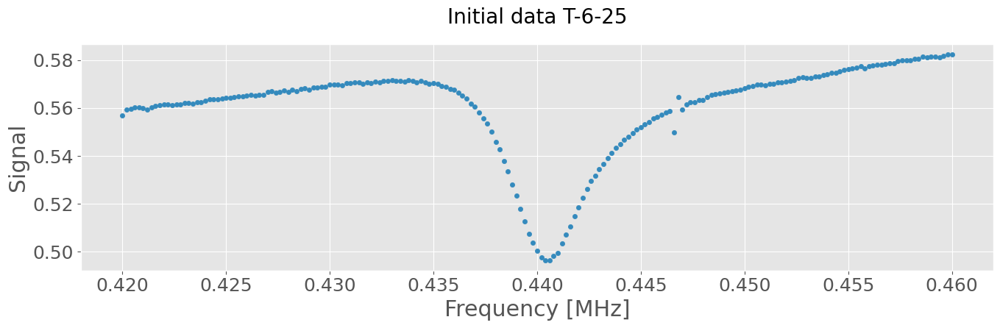

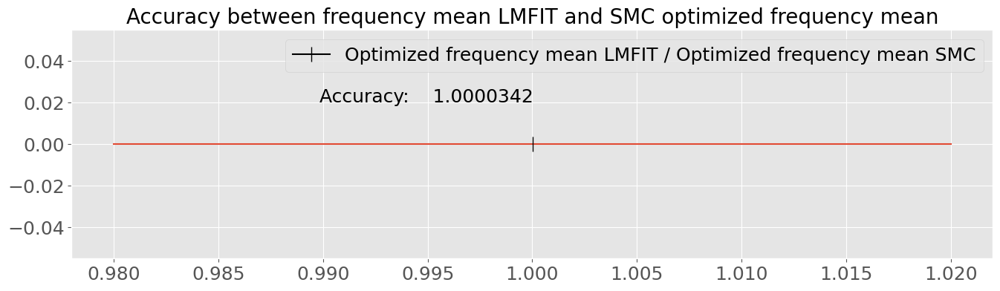

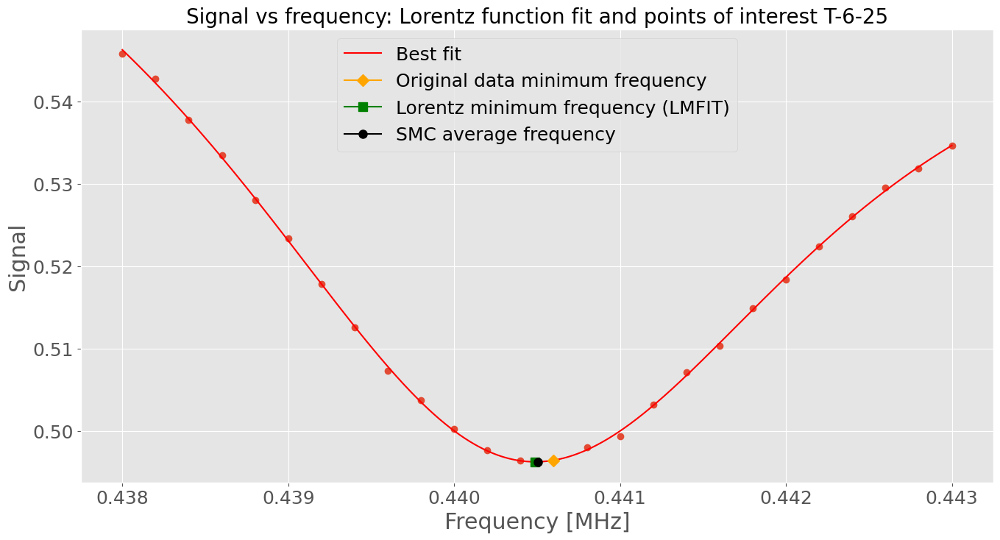



Eval appended.
--------------------------------

[[Model]]
    (Model(linear) + Model(split_lorentzian))
[[Fit Statistics]]
    # fitting method   = leastsq
    # function evals   = 50
    # data points      = 26
    # variables        = 6
    chi-square         = 1.8945e-06
    reduced chi-square = 9.4725e-08
    Akaike info crit   = -415.300972
    Bayesian info crit = -407.752393
    R-squared          = 0.99967635
[[Variables]]
    amplitude: -5.6825e-04 +/- 1.6226e-05 (2.86%) (init = 0.0004595246)
    center:     0.44040312 +/- 9.4180e-06 (0.00%) (init = 0.4403636)
    sigma:      0.00228323 +/- 5.9311e-05 (2.60%) (init = 0.0025)
    sigma_r:    0.00223195 +/- 4.8079e-05 (2.15%) (init = 0.0025)
    fwhm:       0.00451518 +/- 6.5733e-05 (1.46%) == 'sigma+sigma_r'
    height:    -0.08012092 +/- 0.00114605 (1.43%) == '2*amplitude/3.1415927/max(0.0000000, (sigma+sigma_r))'
    slope:     -3.02798503 +/- 0.32040496 (10.58%) (init = 0)
    intercept:  1.91013584 +/- 0.14145602 (7.41%)

<Figure size 640x480 with 0 Axes>

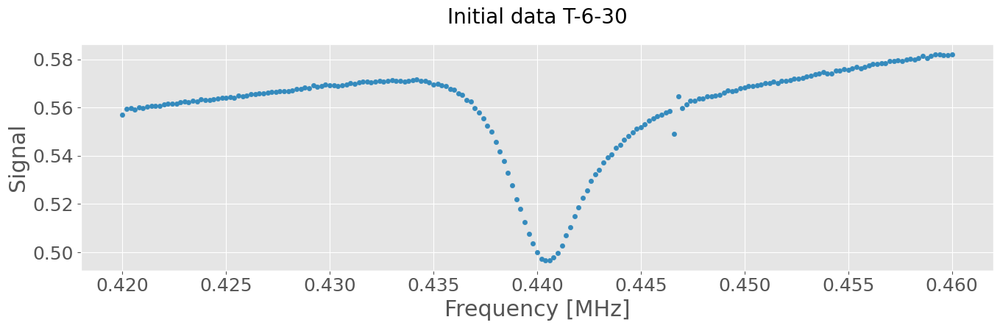

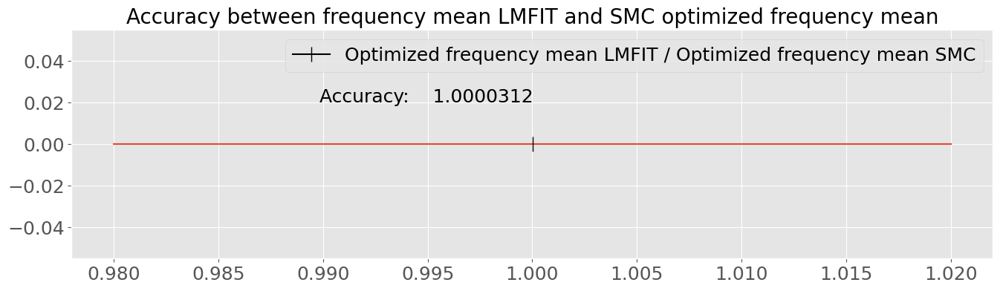

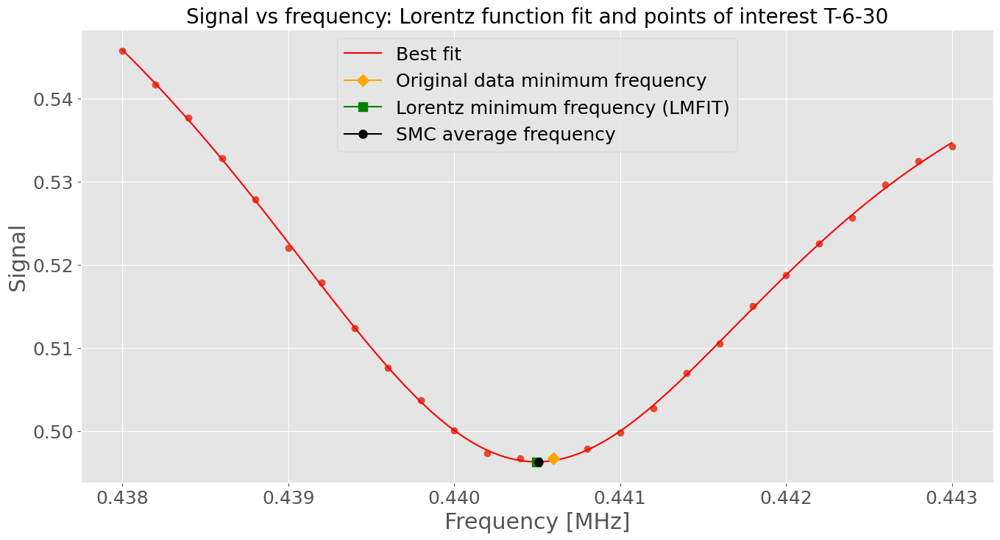



Eval appended.
--------------------------------



In [10]:
unique_hash = combined_df.hash.unique()
dfs_params = []
dfs_eval = []
frequency_shift = []

for i in unique_hash:
    
    hashed = i
    xy0 = combined_df[['frequency','signal']].loc[combined_df['hash'] == hashed]
    xy0 = xy0.reset_index(drop=True)

    interval = 13
    min_value_idx = xy0.loc[xy0['signal'] == xy0['signal'].min()].index[0]
    idx = range(min_value_idx - interval, min_value_idx + interval)

    x = np.array(xy0['frequency'])[idx]
    y = np.array(xy0['signal'])[idx]
    
    # Model parametrization
    peak = SplitLorentzianModel() #prefix='slm_')
    linemod1 = LinearModel() #prefix='lm1_')
    #linemod2 = LinearModel(prefix='lm2_')
    pars = Parameters()
    pars += peak.guess(y, x=x)
    pars += linemod1.make_params(intercept=y.min(), slope=0)
    #pars += linemod2.make_params(intercept=y.min(), slope=0)
    mod = linemod1 + peak # + linemod2

    # Fit model
    result = mod.fit(y, pars, x=x)
    
    # Printing report and related information
    print(result.fit_report(min_correl=0.25))

    ### Logging

    lmfit_report = f'\n{str(datetime.now())} - LMFIT result report {i} \n' + str(result.fit_report(min_correl=0.25))

    with open(log_file, 'a') as f:
        f.write(lmfit_report)
        f.close()
    
    # Determining the point to be evaluated on the frequency shift   
    x_eval = np.linspace(min(x), max(x), num = 10000)
    y_eval = result.eval(result.params, x=x_eval)

    evaluate_df = pd.DataFrame(x_eval, columns=['x_eval'])
    evaluate_df['y_eval'] = y_eval
    evaluate_df['hash'] = hashed
    
    plot_x = evaluate_df['x_eval'].loc[evaluate_df['y_eval'] == evaluate_df['y_eval'].min()]
    plot_y = evaluate_df['y_eval'].loc[evaluate_df['y_eval'] == evaluate_df['y_eval'].min()]

    # Min point
    minimized_freq = []

    n = 1000
    
    for j in range(n):
        aux = np.array([
            np.random.normal( # 0
                loc=result.params['amplitude'].value, 
                scale=result.params['amplitude'].stderr
            ),
            np.random.normal( # 1
                loc=result.params['center'].value, 
                scale=result.params['center'].stderr
            ), 
            np.random.normal( # 2
                loc=result.params['sigma'].value, 
                scale=result.params['sigma'].stderr
            ),
            np.random.normal( # 3
                loc=result.params['sigma_r'].value, 
                scale=result.params['sigma_r'].stderr
            ),
            np.random.normal( # 4
                loc=result.params['slope'].value, 
                scale=result.params['slope'].stderr
            ),
            np.random.normal( # 5
                loc=result.params['intercept'].value, 
                scale=result.params['intercept'].stderr
                )
            ])

        find_fmin = optimize.fmin(
            SplitLorentzianFunc,
            xy0['frequency'][min_value_idx], 
            full_output=True,
            disp=0
        )

        find_fmin_point = np.array([find_fmin[0].item(), find_fmin[1]])

        minimized_freq.append(find_fmin[0])

        j = j + 1

    minimized_freq = np.concatenate(minimized_freq).ravel()
    minimized_freq = minimized_freq[(minimized_freq > 0.43) & (minimized_freq < 0.444)]

    minimized_freq_mean = np.array(minimized_freq).mean()
    minimized_freq_std = np.array(minimized_freq).std()
    minimized_freq_std_err = minimized_freq_std / np.sqrt(n)
    freq = ufloat(minimized_freq_mean,minimized_freq_std)*1e6
    pfloat = minimized_freq_mean/plot_x.values.item()
    
    values_lst = [
        minimized_freq_mean, 
        minimized_freq_std, 
        minimized_freq_std_err,
        freq,
        hashed
    ]

    dfs_params.append(values_lst)

    print('\n')
    print('----- Results -----')
    result_table = [
        ['Optimized frequency mean (fmin)', minimized_freq_mean],
        ['Optimized frequency standard deviation (fmin)', minimized_freq_std],
        ['Optimized frequency standard error (fmin)', minimized_freq_std_err],
        ['Optimized frequency mean with uncertainties', freq],
        ['Accuracy of estimated frequency mean / SMC',pfloat]
    ]
    
    print(str(tabulate(result_table)))
    print('\n')

    ### Logging

    variables_report = f'{str(datetime.now())} - Results {i} \n' + str(tabulate(result_table)) + '\n'

    with open(log_file, 'a') as f:
        f.write(variables_report)
        f.close()

    
    # PLOTING

    # Primary data
    plt.figure()
    plt.rcParams.update({'font.size': 18})
    ax = xy0.plot(
        x = 'frequency', 
        y = 'signal', 
        kind='scatter',
        figsize = (16,4), 
        grid=True, 
        legend=True
    )
    ax.set_title(label = 'Initial data ' + hashed, pad=20, fontdict={'fontsize':20})
    ax.set_xlabel('Frequency [MHz]')
    ax.set_ylabel('Signal')
    plt.show()
    print('\n')
    
    #Accuracy between minimized frequency mean and MCS frequency mean
    xfloat = np.linspace(0.98, 1.02, num = 100)
    yfloat = np.linspace(0, 0, num = 100)
    fig = plt.figure(figsize = (16,4))
    plt.plot(xfloat,yfloat)
    plt.plot(pfloat,0,color='k',marker='|', markersize = 15, label='Optimized frequency mean LMFIT / Optimized frequency mean SMC')
    plt.text(
        x=pfloat, 
        y=0.02, 
        s='Accuracy:    {:.8}'.format(pfloat), 
        horizontalalignment='right',
        verticalalignment='baseline'
    ) 
    plt.legend(loc='best')
    plt.title('Accuracy between frequency mean LMFIT and SMC optimized frequency mean', fontsize=20)
    plt.show()
    
    # Fit model data plot    
    fig = plt.figure(figsize = (16,8))
    plt.plot(x, y, 'o')
    plt.plot(x_eval, y_eval, 'r-', label='Best fit')

    plt.plot(
        xy0['frequency'][min_value_idx],
        xy0['signal'][min_value_idx],
        marker = 'D',
        color='orange', 
        markersize=8,
        label='Original data minimum frequency'
    )
    
    labels = evaluate_df['hash'].loc[evaluate_df['y_eval'] == evaluate_df['y_eval'].min()]
    
    plt.plot(
        plot_x, 
        plot_y, 
        label='Lorentz minimum frequency (LMFIT)', 
        color='green', 
        marker='s', 
        markersize=8
    )
    plt.plot(
        minimized_freq_mean, 
        plot_y, 
        label='SMC average frequency', 
        color='k', 
        marker='o', 
        markersize=8
    )
    plt.xlabel('Frequency [MHz]')
    plt.ylabel('Signal')
    plt.legend(loc='best')
    plt.title('Signal vs frequency: Lorentz function fit and points of interest '+ hashed, fontsize=20)
    plt.grid(True)
    plt.show()
    
    print('\n')
        
    global eval_df
    
    dfs_eval.append(evaluate_df)
    
    print('Eval appended.')
    print('--------------------------------\n')



### Creates a data frame with evaluated and parametrization data 

In [11]:
eval_df = pd.concat(
    dfs_eval,
    ignore_index=True
)

eval_df['y_eval'] = eval_df['y_eval']

param_df = pd.DataFrame(
    dfs_params, 
    columns=[
        'minimized_freq_mean',
        'minimized_freq_std',
        'minimized_freq_std_err',
        'freq_with_unc', 
        'hash'
    ]
)

eval_group = []
eval_sensor = []
eval_time = []

for hashed in eval_df.hash:
    eval_group_lst = []
    eval_sensor_lst = []
    eval_time_lst = []
    
    eval_group_lst.append(hashed.split('-')[-3])
    eval_sensor_lst.append(hashed.split('-')[-2])
    eval_time_lst.append(hashed.split('-')[-1])
    
    eval_group.append(eval_group_lst)
    eval_sensor.append(eval_sensor_lst)
    eval_time.append(eval_time_lst)

group_df = pd.DataFrame(eval_group, columns=['group'])
sensor_df = pd.DataFrame(eval_sensor, columns=['sensor'])
time_df = pd.DataFrame(eval_time, columns=['time'])

eval_df['group'] = group_df
eval_df['sensor'] = sensor_df
eval_df['time'] = time_df
eval_df['time'] = pd.to_numeric(eval_df['time'])
grouped_eval_df = eval_df.groupby(
    ['hash']).min().sort_values(
    by=['group','sensor','time']
).reset_index(drop=False)

complete = pd.merge(addresses,grouped_eval_df[['x_eval','y_eval','hash']],on='hash', how='left')
complete = complete.set_index(['hash']).drop('x_eval', axis=1)
complete = complete.join(param_df.set_index('hash'))
complete.to_csv(folder + '/complete_df.csv', sep=';')

complete_dataset = f'{str(datetime.now())} - Complete dataset - EXPORTED \n'

with open(log_file, 'a') as f:
    f.write(complete_dataset)
    f.close()

In [12]:
complete.head(50)

,group,sensor,time,y_eval,minimized_freq_mean,minimized_freq_std,minimized_freq_std_err,freq_with_unc
hash,,,,,,,,
C-1-0,C,1,0,0.481844,0.439119,1.911282e-05,6.044003e-07,439119+/-19
C-1-5,C,1,5,0.482087,0.439114,1.110223e-16,3.510833e-18,439114.21875000012+/-0.00000000011
C-1-10,C,1,10,0.482528,0.439116,1.058982e-05,3.348794e-07,439116+/-11
C-1-15,C,1,15,0.482740,0.439116,1.077756e-05,3.408163e-07,439116+/-11
C-1-20,C,1,20,0.482532,0.439107,3.682066e-05,1.164371e-06,(4.3911+/-0.0004)e+05
C-1-25,C,1,25,0.482490,0.439114,1.110223e-16,3.510833e-18,439114.21875000012+/-0.00000000011
C-1-30,C,1,30,0.482341,0.439114,1.110223e-16,3.510833e-18,439114.21875000012+/-0.00000000011
C-15-0,C,15,0,0.500370,0.439489,1.522259e-05,4.813805e-07,439489+/-15
C-15-5,C,15,5,0.501249,0.439484,1.176864e-05,3.721572e-07,439484+/-12


### Applies a Lagergren model over minimized data in order to obtain a model for frequency decay on time.
#### Provides a detailed report on fit params of the model.
#### As result of this process, it is possilbe to estimate frequency shift of each time instance

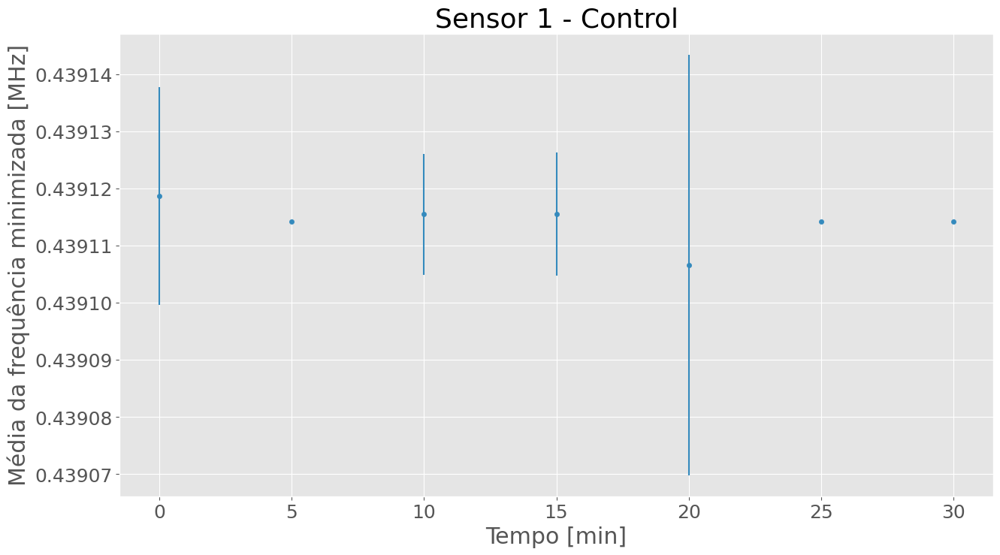

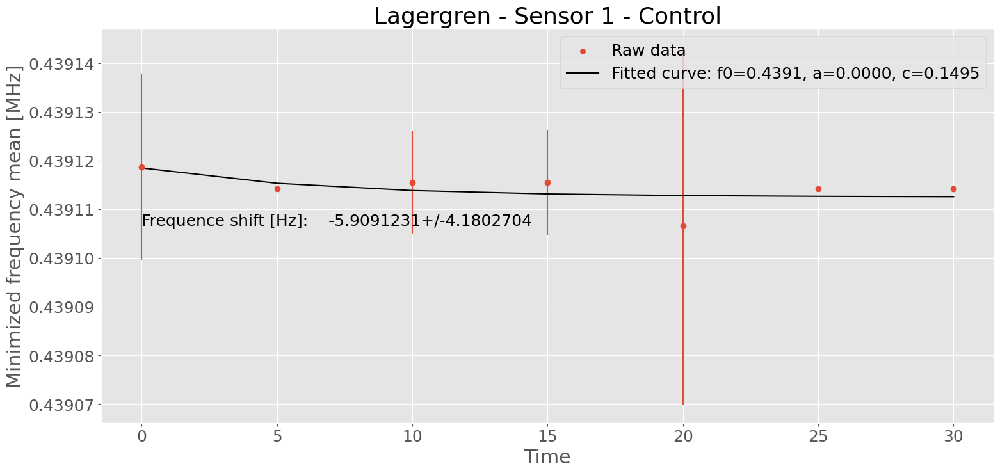

------------------------------------------------------------------------------------------------------------
Summary - Sensor 1 - Control
----------------------  -------------------------
Parameter f0            0.439118531+/-0.000003592
Parameter a             (1.3610+/-0.9545)e-05
Parameter c             0.1496+/-0.2720
Frequency t = 30 [MHz]  0.439112622+/-0.000005512
Frequency shift [Hz]    -5.9091231+/-4.1802704
----------------------  -------------------------


+--------+---------+----------+--------+--------------+----------------------------------+-------------+
|        | Group   |   Sensor |   Time |   Signal fit |   Minimized frequency mean [MHz] |     Std Dev |
|--------+---------+----------+--------+--------------+----------------------------------+-------------|
| C-1-0  | C       |        1 |      0 |     0.481844 |                         0.439119 | 1.91128e-05 |
| C-1-5  | C       |        1 |      5 |     0.482087 |                         0.439114 | 1.11022e-16 |
| 

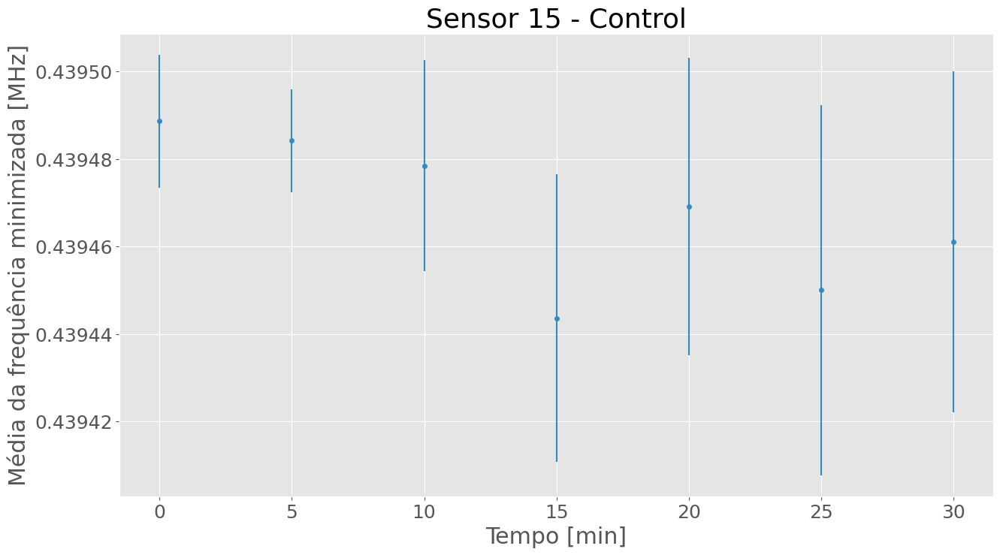

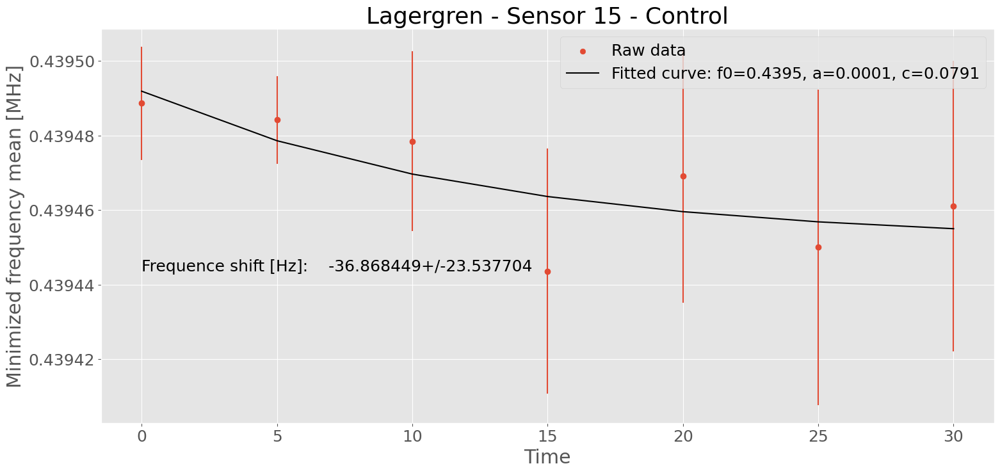

------------------------------------------------------------------------------------------------------------
Summary - Sensor 15 - Control
----------------------  -----------------------
Parameter f0            0.43949186+/-0.00001256
Parameter a             (9.251+/-4.973)e-05
Parameter c             0.0791+/-0.1117
Frequency t = 30 [MHz]  0.43945499+/-0.00002668
Frequency shift [Hz]    -36.868449+/-23.537704
----------------------  -----------------------


+---------+---------+----------+--------+--------------+----------------------------------+-------------+
|         | Group   |   Sensor |   Time |   Signal fit |   Minimized frequency mean [MHz] |     Std Dev |
|---------+---------+----------+--------+--------------+----------------------------------+-------------|
| C-15-0  | C       |       15 |      0 |     0.50037  |                         0.439489 | 1.52226e-05 |
| C-15-5  | C       |       15 |      5 |     0.501249 |                         0.439484 | 1.17686e-05 |
| C-15

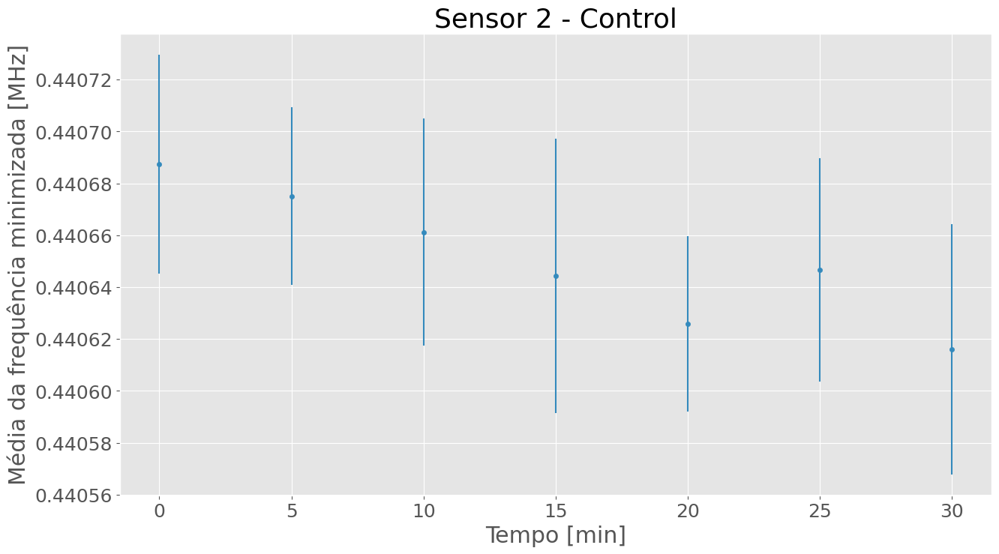

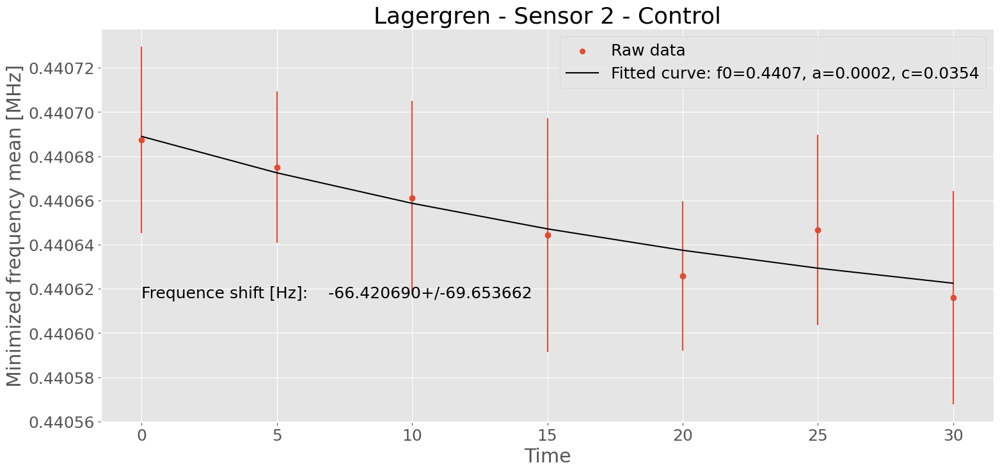

------------------------------------------------------------------------------------------------------------
Summary - Sensor 2 - Control
----------------------  -----------------------
Parameter f0            0.44068897+/-0.00001026
Parameter a             0.0002304+/-0.0001740
Parameter c             0.03539+/-0.04588
Frequency t = 30 [MHz]  0.44062255+/-0.00007040
Frequency shift [Hz]    -66.420690+/-69.653662
----------------------  -----------------------


+--------+---------+----------+--------+--------------+----------------------------------+-------------+
|        | Group   |   Sensor |   Time |   Signal fit |   Minimized frequency mean [MHz] |     Std Dev |
|--------+---------+----------+--------+--------------+----------------------------------+-------------|
| C-2-0  | C       |        2 |      0 |     0.522322 |                         0.440688 | 4.21827e-05 |
| C-2-5  | C       |        2 |      5 |     0.522122 |                         0.440675 | 3.41477e-05 |
| C-2-10

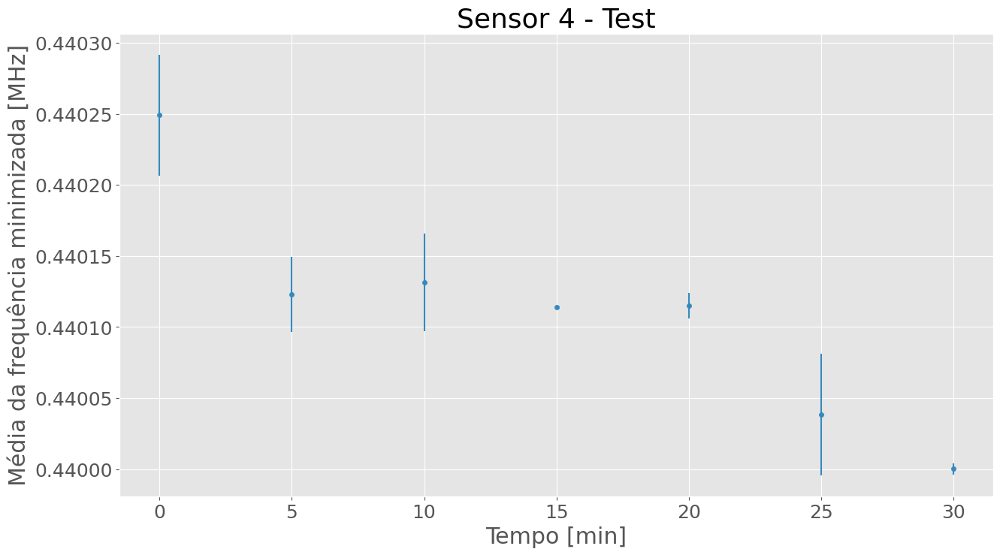

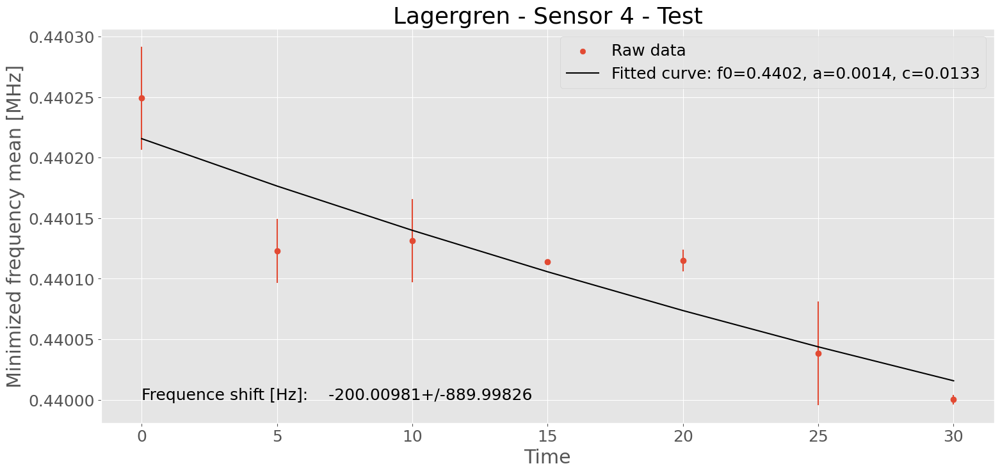

------------------------------------------------------------------------------------------------------------
Summary - Sensor 4 - Test
----------------------  -----------------------
Parameter f0            0.44021569+/-0.00003481
Parameter a             0.001379+/-0.004344
Parameter c             0.01332+/-0.05147
Frequency t = 30 [MHz]  0.4400157+/-0.0008907
Frequency shift [Hz]    -200.00981+/-889.99826
----------------------  -----------------------


+--------+---------+----------+--------+--------------+----------------------------------+-------------+
|        | Group   |   Sensor |   Time |   Signal fit |   Minimized frequency mean [MHz] |     Std Dev |
|--------+---------+----------+--------+--------------+----------------------------------+-------------|
| T-4-0  | T       |        4 |      0 |     0.48342  |                         0.440249 | 4.25269e-05 |
| T-4-5  | T       |        4 |      5 |     0.485309 |                         0.440123 | 2.62968e-05 |
| T-4-10 | T   

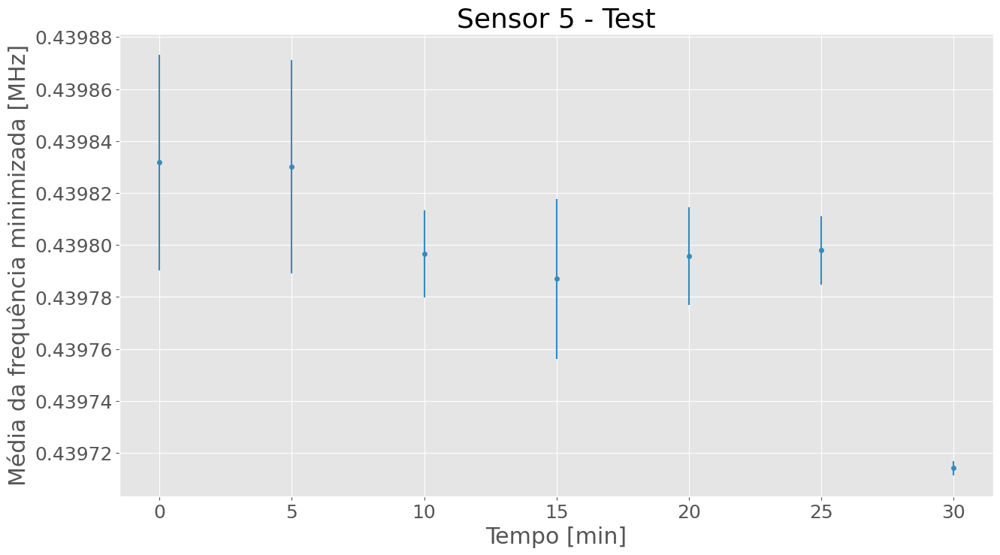

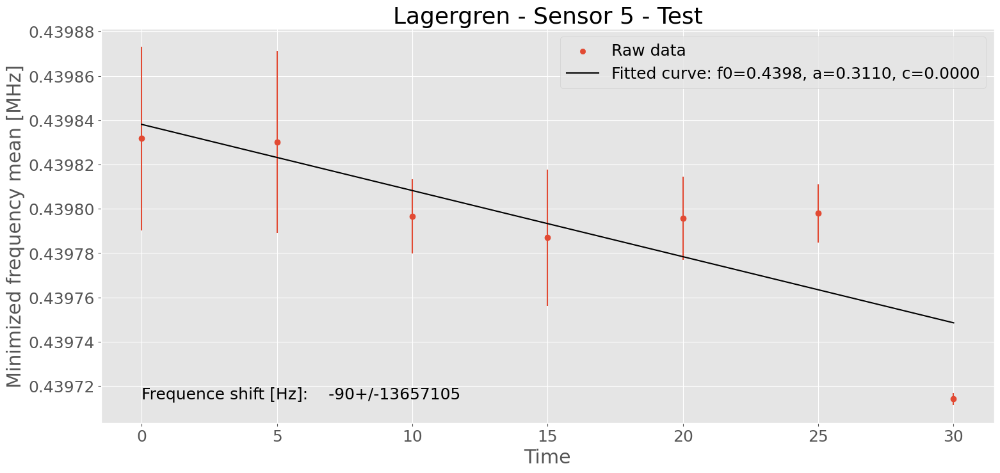

------------------------------------------------------------------------------------------------------------
Summary - Sensor 5 - Test
----------------------  -----------------------
Parameter f0            0.43983811+/-0.00002383
Parameter a             (0.000+/-9.975)e+05
Parameter c             0.00000+/-0.07910
Frequency t = 30 [MHz]  0.44+/-13.66
Frequency shift [Hz]    -90+/-13657105
----------------------  -----------------------


+--------+---------+----------+--------+--------------+----------------------------------+-------------+
|        | Group   |   Sensor |   Time |   Signal fit |   Minimized frequency mean [MHz] |     Std Dev |
|--------+---------+----------+--------+--------------+----------------------------------+-------------|
| T-5-0  | T       |        5 |      0 |     0.492474 |                         0.439832 | 4.14683e-05 |
| T-5-5  | T       |        5 |      5 |     0.492442 |                         0.43983  | 4.09864e-05 |
| T-5-10 | T       |        5 | 

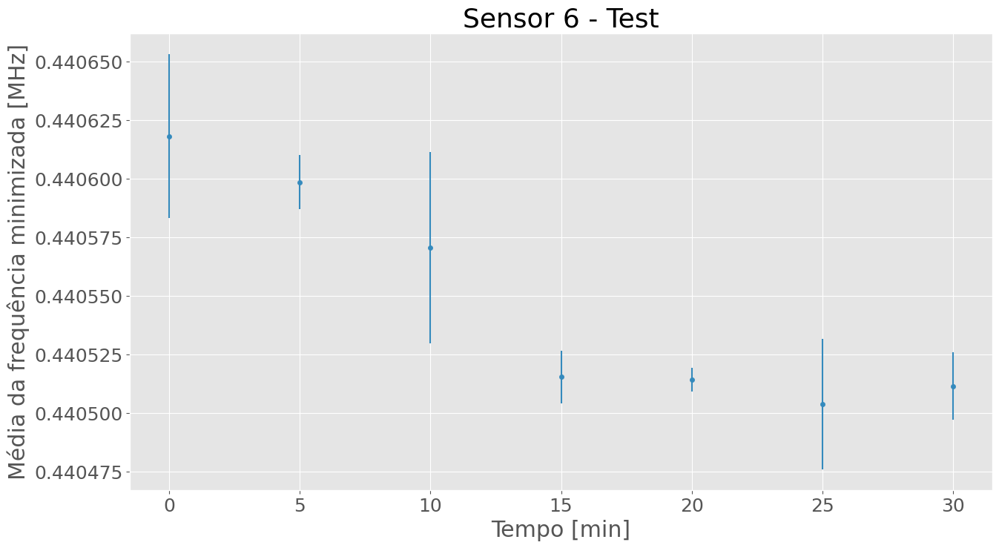

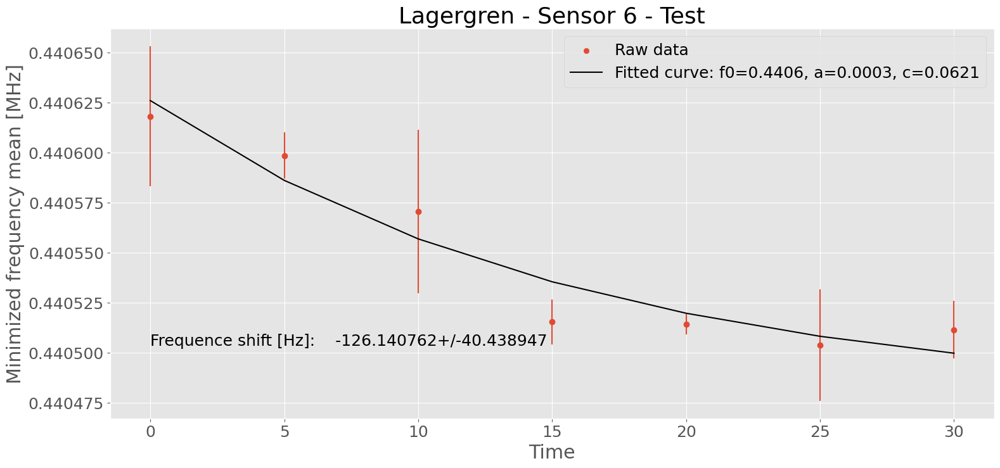

------------------------------------------------------------------------------------------------------------
Summary - Sensor 6 - Test
----------------------  -----------------------
Parameter f0            0.44062593+/-0.00001481
Parameter a             0.00033894+/-0.00008442
Parameter c             0.06207+/-0.03658
Frequency t = 30 [MHz]  0.44049979+/-0.00004306
Frequency shift [Hz]    -126.140762+/-40.438947
----------------------  -----------------------


+--------+---------+----------+--------+--------------+----------------------------------+-------------+
|        | Group   |   Sensor |   Time |   Signal fit |   Minimized frequency mean [MHz] |     Std Dev |
|--------+---------+----------+--------+--------------+----------------------------------+-------------|
| T-6-0  | T       |        6 |      0 |     0.494909 |                         0.440618 | 3.50625e-05 |
| T-6-5  | T       |        6 |      5 |     0.495403 |                         0.440598 | 1.1458e-05  |
| T-6-10

In [13]:
def fit_model(t, f0, a, c):
    return f0 * (1 - a * (1 - np.exp(-c * t)))

sensors = complete['sensor'].unique()

df_shift = pd.DataFrame(columns=['hash','shift', 'shift_value','shift_std'])

for sensor in sensors:
    g = complete['group'].loc[complete.sensor == sensor]
    if g[0] == 'C':
        label_group = ' - Control'
    else:
        label_group = ' - Test'
        
    df = complete.loc[(complete.group == g[0]) & (complete.sensor == sensor)]
        
    df.plot(
        x='time',
        y='minimized_freq_mean',
        kind='scatter',
        yerr='minimized_freq_std',
        figsize=(15,8),
        xlabel='Tempo [min]',
        ylabel = 'Média da frequência minimizada [MHz]',
        title = 'Sensor ' + sensor + label_group
    )
    plt.ticklabel_format(useOffset=False)
    plt.show()
    
    # Fit the function f(f0,a,c) = f0 * (1 - a * (1 - np.exp(-c * t)))
    t = df.time 
    y = df.minimized_freq_mean
    e = df.minimized_freq_std
        
    popt, pcov = curve_fit(fit_model, t, y, absolute_sigma=True, maxfev=100000)
    perr = np.sqrt(np.diag(pcov))

    f0 = popt[0]
    a = popt[1]
    c = popt[2]

    
    gmodel = Model(fit_model)
    params = gmodel.make_params(f0=f0, a=a, c=c)
    result = gmodel.fit(y, params, t=t)    
    
    #Parameters with errors from LMFIT
    f0uf = ufloat(result.params['f0'].value,result.params['f0'].stderr)
    auf = ufloat(result.params['a'].value,result.params['a'].stderr)
    cuf = ufloat(result.params['c'].value,result.params['c'].stderr)
    
    
    shifts = []
    shifts_values = []
    shifts_std = []
    
    for k in range(len(df)):
        tk  = ufloat(df.time[k],df.minimized_freq_std[k])
        ft = f0uf * (1 - auf * (1 - exp(-cuf * tk))) 
        shift = ft*1e6 - f0uf*1e6
        shift_value = shift.nominal_value
        shift_std = shift.std_dev
        shifts.append(shift)
        shifts_values.append(shift_value)
        shifts_std.append(shift_std)
    
    df_aux           = pd.DataFrame(columns=['hash','shift', 'shift_value','shift_std'])
    df_aux['hash']   = df.index
    df_aux['shift']  = shifts
    df_aux['shift_value']  = shifts_values
    df_aux['shift_std']  = shifts_std
    
    df_shift = pd.concat([df_shift, df_aux],ignore_index=True)
    
    t30  = ufloat(df.time[-1],df.minimized_freq_std[-1])
    f_t30 = f0uf * (1 - auf * (1 - exp(-cuf * t30)))

    shift30 = f_t30*1e6 - f0uf*1e6

    # Plot
    plt.figure(figsize = (18,8))
    ax = plt.axes()
    ax.scatter(t, y, label='Raw data')
    ax.errorbar(t, y, yerr=e,fmt="o")
    ax.plot(
        t, 
        fit_model(t, *popt), 
        'k',
        label='Fitted curve: f0=%5.4f, a=%5.4f, c=%5.4f' % tuple(popt)
    )
    ax.set_title(r'Lagergren - Sensor ' + sensor + label_group)
    ax.set_ylabel('Minimized frequency mean [MHz]')
    ax.set_xlabel('Time')
    ax.legend()
    ax.ticklabel_format(useOffset=False)
    plt.legend()
    plt.text(
        x=min(t), 
        y=min(y), 
        s='Frequence shift [Hz]:    {:.8u}'.format(shift30), 
        horizontalalignment='left',
        verticalalignment='baseline'
    ) 
    plt.show()   

    print('------------------------------------------------------------------------------------------------------------')
    print('Summary - Sensor ' + sensor + label_group)

    result_table2 = [
        ['Parameter f0', '{:.4u}'.format(f0uf)],
        ['Parameter a', '{:.4u}'.format(auf)],
        ['Parameter c', '{:.4u}'.format(cuf)],
        ['Frequency t = 30 [MHz]', '{:.4u}'.format(f_t30)],
        ['Frequency shift [Hz]','{:.8u}'.format(shift30)]
    ]
    
    print(str(tabulate(result_table2)))
    print('\n')
    
    df_values = df[['group','sensor','time','y_eval','minimized_freq_mean','minimized_freq_std']]
    headers = ['Group','Sensor','Time','Signal fit','Minimized frequency mean [MHz]','Std Dev']
    tablefmt='psql'

    values_table = tabulate(df_values,headers=headers,tablefmt=tablefmt)
    
    print(values_table)
    print('\n')
    print(result.fit_report())
    print('------------------------------------------------------------------------------------------------------------')

    ### Logging

    result_report2 = f'{str(datetime.now())} - Summary - Sensor {sensor} {label_group} \n' + str(tabulate(result_table2)) + '\n'
    result_report3 = f'{str(datetime.now())} - Values {sensor} {label_group} \n' + str(values_table) + '\n'
    result_report4 = f'{str(datetime.now())} - Values {sensor} {label_group} \n' + str(result.fit_report()) + '\n'
    

    with open(log_file, 'a') as f:
        f.write(result_report2)
        f.write(result_report3)
        f.write(result_report4)
        f.close()

df_shift = df_shift.set_index(['hash'])
complete_shifts = pd.merge(complete[['group','sensor','time']],df_shift,on='hash', how='left')

In [14]:
### Logging
complete_shifts_export = f'\n {str(datetime.now())} - Complete shifts list - EXPORTED \n'

with open(log_file, 'a') as f:
    f.write(complete_shifts_export)
    f.close()
    
complete_shifts.head()

,group,sensor,time,shift,shift_value,shift_std
hash,,,,,,
C-1-0,C,1,0,(0.0+/-1.7)e-05,0.000000,0.000017
C-1-5,C,1,5,-3+/-4,-3.148202,4.434824
C-1-10,C,1,10,-5+/-5,-4.637971,4.881652
C-1-15,C,1,15,-5+/-5,-5.342949,4.551626
C-1-20,C,1,20,-6+/-4,-5.676553,4.301998


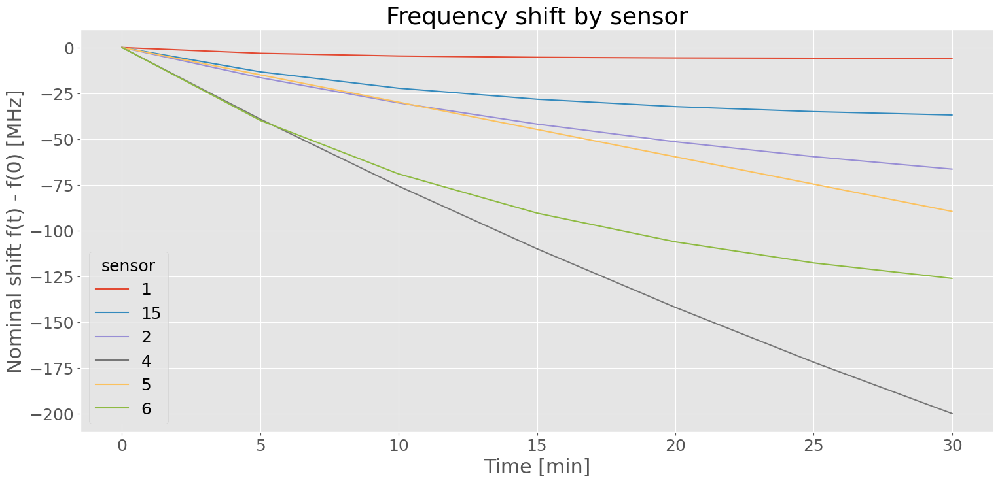

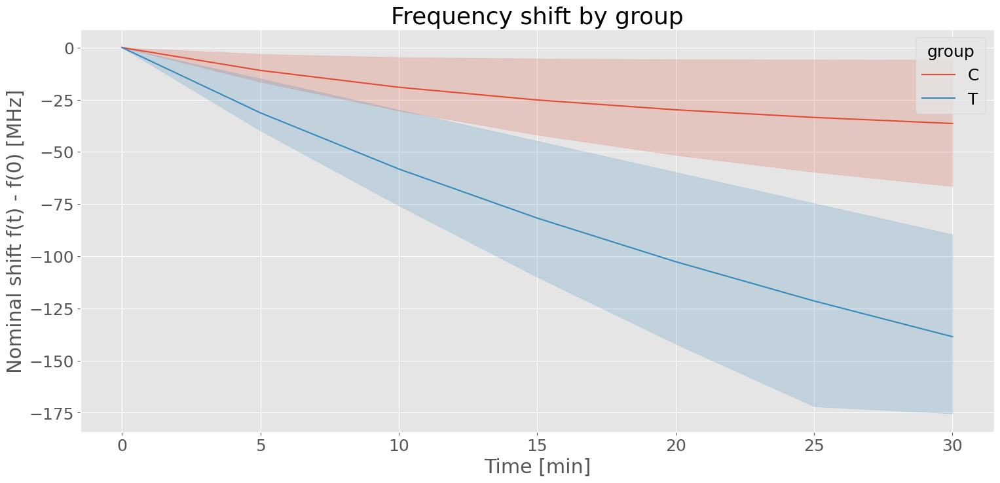

In [15]:
plt.figure(figsize = (18,8))
sns.lineplot(
    data=complete_shifts, 
    x='time', 
    y='shift_value', 
    hue='sensor'
)
plt.title('Frequency shift by sensor')
plt.ylabel('Nominal shift f(t) - f(0) [MHz]')
plt.xlabel('Time [min]')
plt.show()

plt.figure(figsize = (18,8))
sns.lineplot(
    data=complete_shifts, 
    x='time', 
    y='shift_value', 
    hue='group'
)
plt.title('Frequency shift by group')
plt.ylabel('Nominal shift f(t) - f(0) [MHz]')
plt.xlabel('Time [min]')
plt.show()

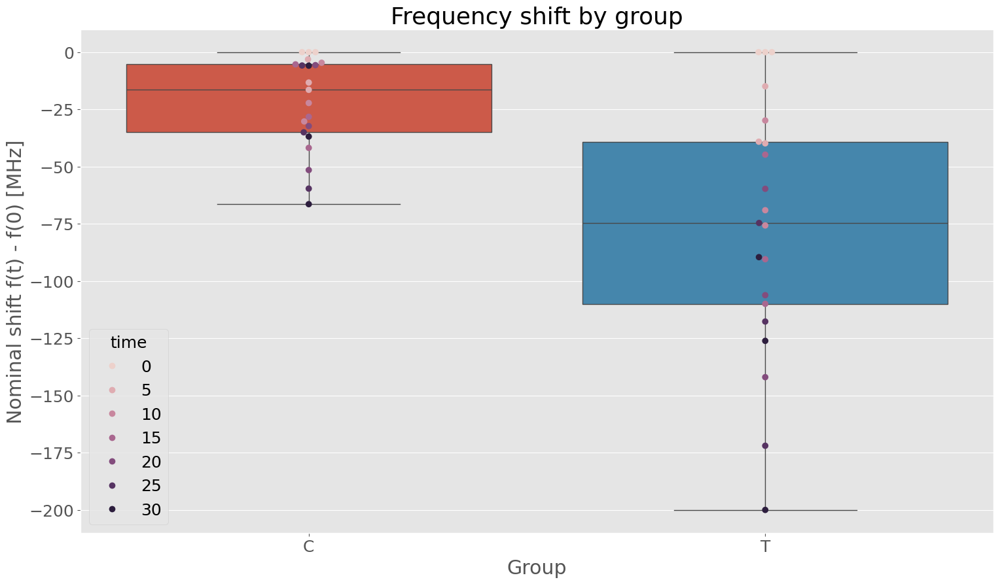

In [16]:
plt.figure(figsize = (18,10))
sns.boxplot(x='group', y='shift_value', data=complete_shifts, hue= 'group')
sns.swarmplot(x='group', y='shift_value', data=complete_shifts, size=7, hue = 'time')
plt.title('Frequency shift by group')
plt.ylabel('Nominal shift f(t) - f(0) [MHz]')
plt.xlabel('Group')
plt.show()

### Splits data to be used bootstrapped. This dataset is used on the classifier as well

In [17]:
complete_shifts_clf = complete_shifts.drop(['sensor','shift'],axis=1).reset_index(drop=True)
complete_shifts_clf = complete_shifts_clf[complete_shifts_clf.time != 0]
complete_shifts_clf = complete_shifts_clf.reset_index(drop=True)

In [18]:
complete_shifts_clf.head(25)

,group,time,shift_value,shift_std
0,C,5,-3.148202,4.434824e+00
1,C,10,-4.637971,4.881652e+00
2,C,15,-5.342949,4.551626e+00
3,C,20,-5.676553,4.301998e+00
4,C,25,-5.834419,4.203951e+00
5,C,30,-5.909123,4.180270e+00
6,C,5,-13.280361,1.686934e+01
7,C,10,-22.222965,2.379953e+01
8,C,15,-28.244651,2.574510e+01
9,C,20,-32.299477,2.549398e+01


In [19]:
c_list_to_bootstrap = complete_shifts_clf[complete_shifts_clf['group'] == 'C'].values.tolist()
c_list_to_bootstrap

[['C', 5, -3.1482022351119667, 4.434824076067309],
 ['C', 10, -4.637971355870832, 4.8816522447804775],
 ['C', 15, -5.342948948615231, 4.551626244374146],
 ['C', 20, -5.676553263096139, 4.301997517593738],
 ['C', 25, -5.834419044607785, 4.203950523297932],
 ['C', 30, -5.909123129385989, 4.180270361832721],
 ['C', 5, -13.280361350916792, 16.86934428934321],
 ['C', 10, -22.22296534193447, 23.799526201359736],
 ['C', 15, -28.244651350891218, 25.745095429851126],
 ['C', 20, -32.299477263586596, 25.493977269882002],
 ['C', 25, -35.02987754653441, 24.525423868801077],
 ['C', 30, -36.86844863824081, 23.53770360543777],
 ['C', 5, -16.46839945728425, 23.1403351906517],
 ['C', 10, -30.265646291081794, 39.89438723320658],
 ['C', 15, -41.824997926014476, 51.82821922055365],
 ['C', 20, -51.50943800533423, 60.167518538931155],
 ['C', 25, -59.62307470489759, 65.86480587412116],
 ['C', 30, -66.4206902566948, 69.6536623557281]]

In [20]:
t_list_to_bootstrap = complete_shifts_clf[complete_shifts_clf['group'] == 'T'].values.tolist()
t_list_to_bootstrap

[['T', 5, -39.12159026740119, 191.19124891304517],
 ['T', 10, -75.7221184115042, 362.9105961873408],
 ['T', 15, -109.96404598338995, 517.0218118325963],
 ['T', 20, -141.99936523393262, 655.2272473229917],
 ['T', 25, -171.97027377376799, 779.0805235658456],
 ['T', 30, -200.00980575662106, 889.9982564630607],
 ['T', 5, -14.92782449920196, 2276215.4673399827],
 ['T', 10, -29.855594490189105, 4552418.428953985],
 ['T', 15, -44.78330997301964, 6828608.884893644],
 ['T', 20, -59.71097094815923, 9104786.835244875],
 ['T', 25, -74.638577415084, 11380952.280025031],
 ['T', 30, -89.56612937478349, 13657105.219354315],
 ['T', 5, -39.84406145464163, 22.349076663269404],
 ['T', 10, -69.05794026801595, 34.03144810713562],
 ['T', 15, -90.47771235374967, 39.38087867547164],
 ['T', 20, -106.18280372943264, 41.18588370159762],
 ['T', 25, -117.69786066521192, 41.19113256144024],
 ['T', 30, -126.14076195523376, 40.43894668601352]]

#### Bootstrapping by group

In [21]:
import random

n = 1000

# Inicializar uma lista para armazenar os dados de controle
c_data = []
t_data = []

# Gerar n pontos de dados aleatórios com base nos dados de controle minimizados
for _ in range(n):
    c_original = random.choice(c_list_to_bootstrap)
    c_data.append(c_original)
    
    t_original = random.choice(t_list_to_bootstrap)
    t_data.append(t_original)


# Embaralhar os dados
random.shuffle(c_data)
random.shuffle(t_data)

complete_list = c_data + t_data
random.shuffle(complete_list)

# Exemplo dos primeiros 10 pontos de dados
for i in range(5):
    print(c_data[i])
    print(t_data[i])
    print(complete_list[i])
    print('----------------------\n')


['C', 30, -66.4206902566948, 69.6536623557281]
['T', 25, -117.69786066521192, 41.19113256144024]
['T', 5, -39.12159026740119, 191.19124891304517]
----------------------

['C', 5, -3.1482022351119667, 4.434824076067309]
['T', 20, -141.99936523393262, 655.2272473229917]
['T', 5, -14.92782449920196, 2276215.4673399827]
----------------------

['C', 15, -5.342948948615231, 4.551626244374146]
['T', 5, -14.92782449920196, 2276215.4673399827]
['C', 30, -66.4206902566948, 69.6536623557281]
----------------------

['C', 15, -5.342948948615231, 4.551626244374146]
['T', 5, -14.92782449920196, 2276215.4673399827]
['C', 25, -35.02987754653441, 24.525423868801077]
----------------------

['C', 25, -35.02987754653441, 24.525423868801077]
['T', 15, -90.47771235374967, 39.38087867547164]
['T', 15, -90.47771235374967, 39.38087867547164]
----------------------



### Classification model
#### A set of different classifiers is applied to verify metrics and select best models to be used 

In [22]:
bootstrapped = pd.DataFrame(complete_list, columns = ['group', 'time', 'frequency','standard deviation']) 

### Logging
bootstrapped_shifts_export = f'\n {str(datetime.now())} - Bootstrapped list - OK \n'

with open(log_file, 'a') as f:
    f.write(bootstrapped_shifts_export)
    f.close()

bootstrapped

,group,time,frequency,standard deviation
0,T,5,-39.121590,1.911912e+02
1,T,5,-14.927824,2.276215e+06
2,C,30,-66.420690,6.965366e+01
3,C,25,-35.029878,2.452542e+01
4,T,15,-90.477712,3.938088e+01
...,...,...,...,...
1995,C,10,-22.222965,2.379953e+01
1996,T,5,-39.121590,1.911912e+02
1997,T,20,-106.182804,4.118588e+01
1998,T,15,-90.477712,3.938088e+01


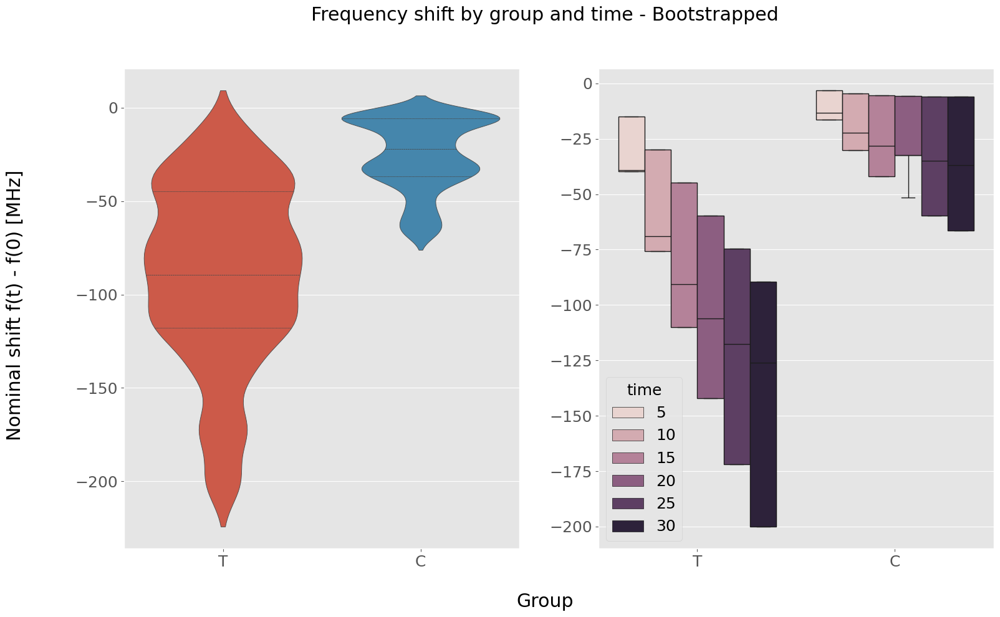

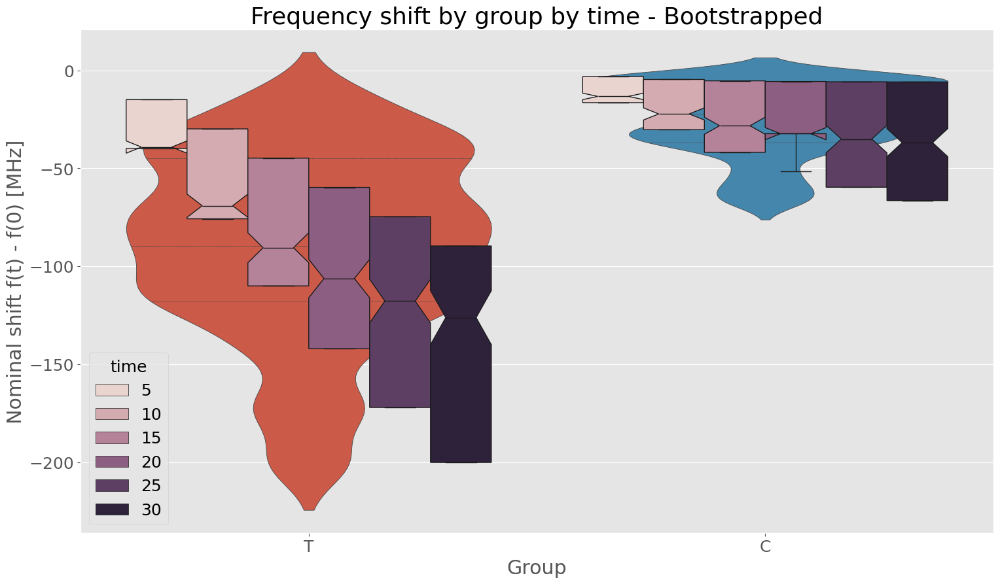

In [23]:
fig, axs = plt.subplots(ncols=2, figsize= (18,10))
sns.violinplot(x='group', y='frequency', data=bootstrapped, hue= 'group', inner="quart", ax=axs[0])
sns.boxplot(x='group', y='frequency', data=bootstrapped, hue='time', notch=False, ax=axs[1])
axs[0].set_xlabel(None)
axs[1].set_xlabel(None)
axs[0].set_ylabel(None)
axs[1].set_ylabel(None)
fig.suptitle('Frequency shift by group and time - Bootstrapped')
fig.supxlabel('Group')
fig.supylabel('Nominal shift f(t) - f(0) [MHz]')
plt.show()

plt.figure(figsize = (18,10))
sns.violinplot(x='group', y='frequency', data=bootstrapped, hue= 'group', inner="quart")
sns.boxplot(x='group', y='frequency', data=bootstrapped, hue='time', notch=True)
plt.title('Frequency shift by group by time - Bootstrapped')
plt.ylabel('Nominal shift f(t) - f(0) [MHz]')
plt.xlabel('Group')
plt.show()

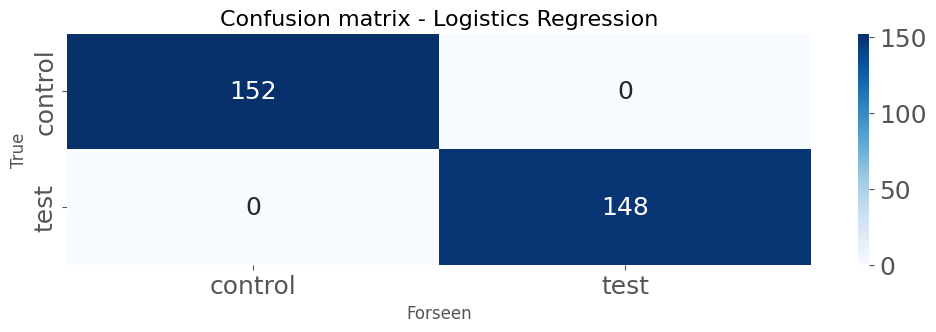

------------  --------------------
Classifier    Logistics Regression
Accuracy avg  1.0
------------  --------------------
Accuracy 5 runs:       [1. 1. 1. 1. 1.]


-----------------------------------------------------------------------------------------------------



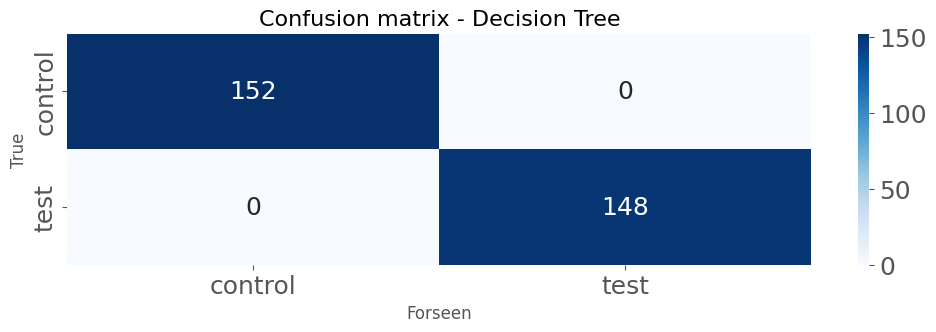

------------  -------------
Classifier    Decision Tree
Accuracy avg  1.0
------------  -------------
Accuracy 5 runs:       [1. 1. 1. 1. 1.]


-----------------------------------------------------------------------------------------------------



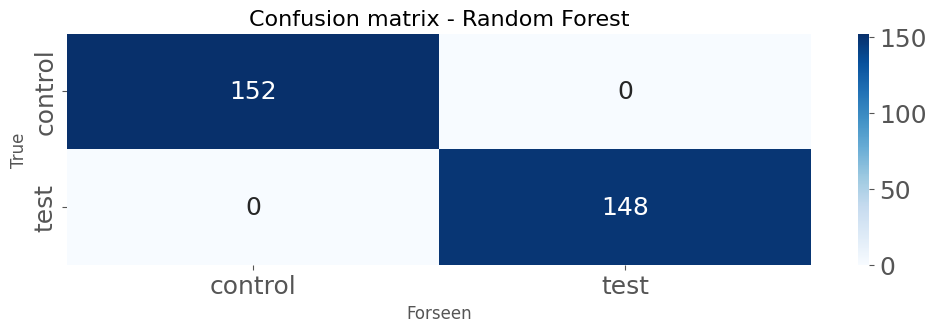

------------  -------------
Classifier    Random Forest
Accuracy avg  1.0
------------  -------------
Accuracy 5 runs:       [1. 1. 1. 1. 1.]


-----------------------------------------------------------------------------------------------------



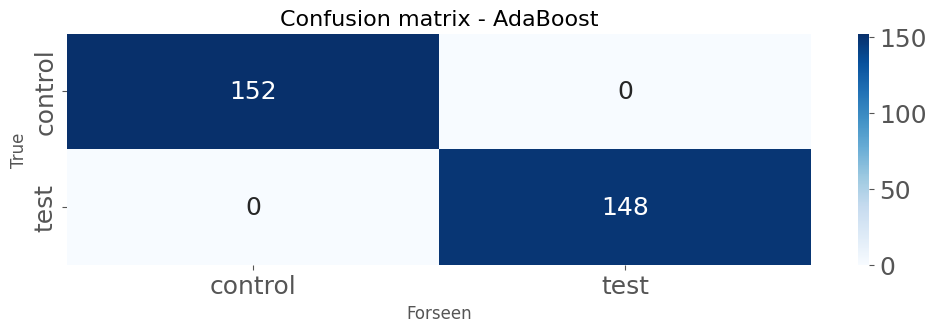

------------  --------
Classifier    AdaBoost
Accuracy avg  1.0
------------  --------
Accuracy 5 runs:       [1. 1. 1. 1. 1.]


-----------------------------------------------------------------------------------------------------



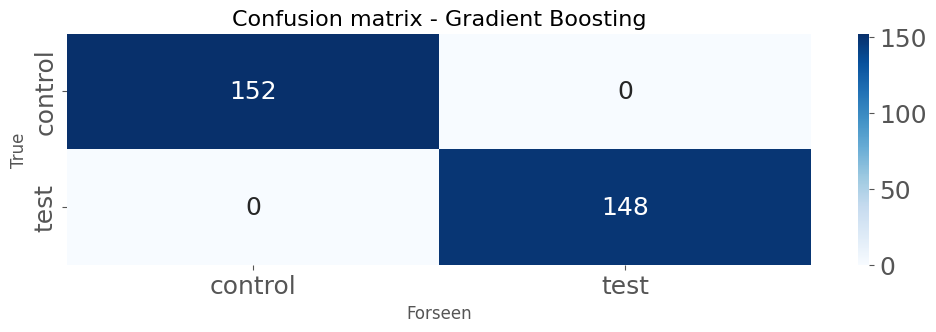

------------  -----------------
Classifier    Gradient Boosting
Accuracy avg  1.0
------------  -----------------
Accuracy 5 runs:       [1. 1. 1. 1. 1.]


-----------------------------------------------------------------------------------------------------



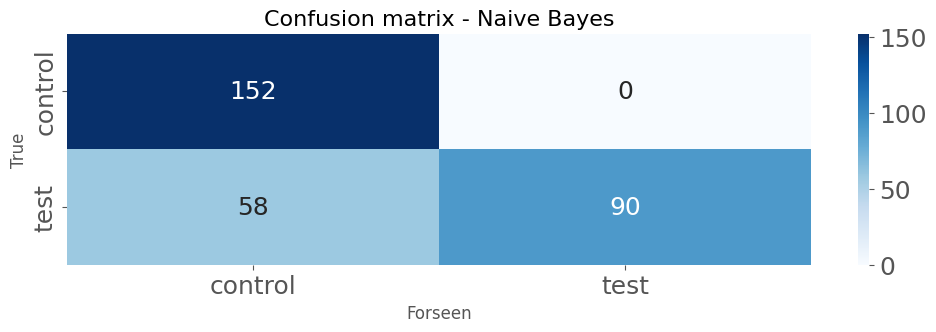

------------  -----------
Classifier    Naive Bayes
Accuracy avg  0.7585
------------  -----------
Accuracy 5 runs:       [0.77   0.7625 0.75   0.7575 0.7525]


-----------------------------------------------------------------------------------------------------



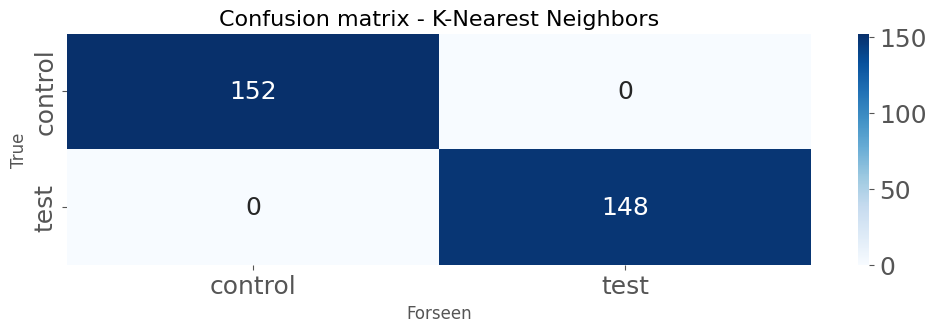

------------  -------------------
Classifier    K-Nearest Neighbors
Accuracy avg  1.0
------------  -------------------
Accuracy 5 runs:       [1. 1. 1. 1. 1.]


-----------------------------------------------------------------------------------------------------



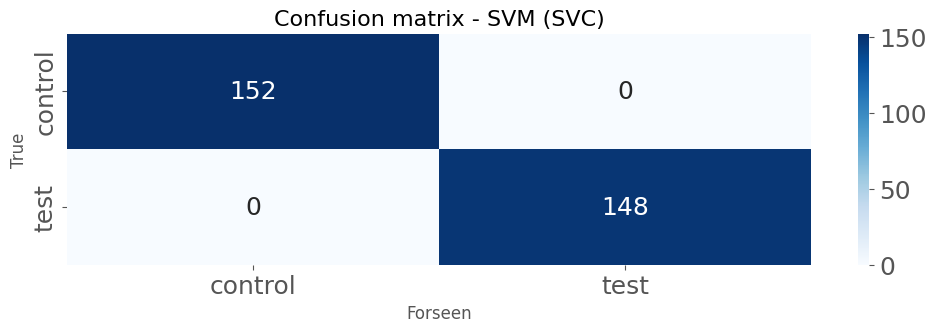

------------  ---------
Classifier    SVM (SVC)
Accuracy avg  1.0
------------  ---------
Accuracy 5 runs:       [1. 1. 1. 1. 1.]


-----------------------------------------------------------------------------------------------------



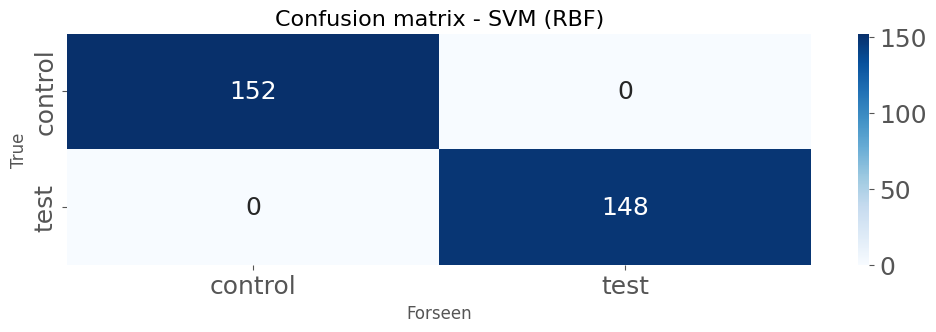

------------  ---------
Classifier    SVM (RBF)
Accuracy avg  0.6725
------------  ---------
Accuracy 5 runs:       [0.7    0.6625 0.6625 0.68   0.6575]


-----------------------------------------------------------------------------------------------------



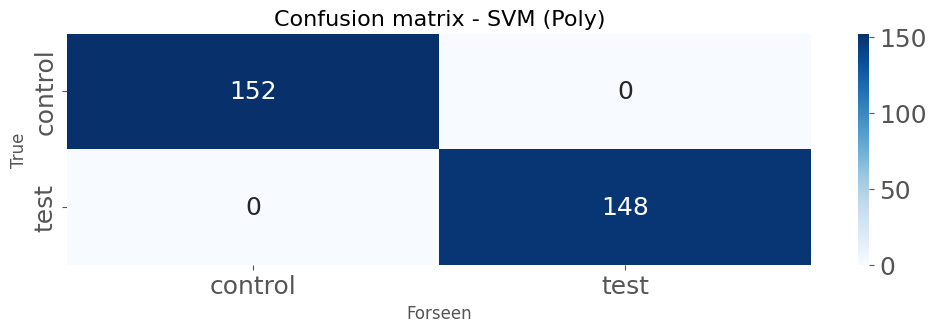

------------  ----------
Classifier    SVM (Poly)
Accuracy avg  0.6725
------------  ----------
Accuracy 5 runs:       [0.7    0.6625 0.6625 0.68   0.6575]


-----------------------------------------------------------------------------------------------------



In [24]:
import random
import numpy as np
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier, GradientBoostingClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt


# Define values to classifier
X = np.array([(time, shift_value, shift_std) for _, time, shift_value, shift_std in complete_list])
y = np.array([group for group, _, _, _ in complete_list])


# Train test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.15, random_state=0)

# Standardize data
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

classifiers = {
    "Logistics Regression": LogisticRegression(max_iter=1000),
    "Decision Tree": DecisionTreeClassifier(),
    "Random Forest": RandomForestClassifier(),
    "AdaBoost": AdaBoostClassifier(),
    "Gradient Boosting": GradientBoostingClassifier(),
    "Naive Bayes": GaussianNB(),
    "K-Nearest Neighbors": KNeighborsClassifier(),
    "SVM (SVC)": SVC(kernel='linear'),
    "SVM (RBF)": SVC(kernel='rbf'),
    "SVM (Poly)": SVC(kernel='poly')
}

# Metrics
metrics_table = []

# Run classifier
for name, clf in classifiers.items():
    clf.fit(X_train, y_train)
    y_pred = clf.predict(X_test)
    
    # metrics calculate
    accuracy = accuracy_score(y_test, y_pred)
    report = classification_report(y_test, y_pred, output_dict=True)
    
    # cross val
    scores = cross_val_score(clf, X, y, cv=5, scoring='accuracy')
    
    # Adicionar as métricas à tabela
    metrics_table.append({
        'Algorithm': name,
        'CV Avg Accuracy': scores.mean(),
        'CV Acc std dev': scores.std(),
        'Accuracy': accuracy,
        'Precision': report['weighted avg']['precision'],
        'Recall': report['weighted avg']['recall'],
        'F1-Score': report['weighted avg']['f1-score'],
        'Support': report['weighted avg']['support'],
    })

    conf_matrix = confusion_matrix(y_test, y_pred)
    plt.figure(figsize=(12, 3))
    sns.heatmap(
        conf_matrix, 
        annot=True, 
        fmt='d', 
        cmap='Blues', 
        xticklabels=["control", "test"], 
        yticklabels=["control", "test"]
    )
    plt.title(f"Confusion matrix - {name}", fontsize=16)
    plt.xlabel("Forseen",fontsize=12)
    plt.ylabel("True",fontsize=12)
    plt.show()
    
    
    # print cross val metrics

    metrics_table_export = [
        ['Classifier', name],
        ['Accuracy avg', scores.mean()]
    ]
    
    print(tabulate(metrics_table_export))
    print(f"Accuracy 5 runs:       {scores}")
    print("\n")
    print('-----------------------------------------------------------------------------------------------------\n')

# Converter a tabela em um DataFrame do Pandas
metrics_df = pd.DataFrame(metrics_table)

### Logging
metrics_list_export = f'\n {str(datetime.now())} - Metrics list - EXPORTED \n'

with open(log_file, 'a') as f:
    f.write(metrics_list_export)
    f.write(str(tabulate(metrics_table_export)))
    f.close()

In [25]:
metrics_df = metrics_df.sort_values(by='CV Avg Accuracy', ascending=False)

metrics_df

,Algorithm,CV Avg Accuracy,CV Acc std dev,Accuracy,Precision,Recall,F1-Score,Support
0,Logistics Regression,1.0000,0.000000,1.000000,1.000000,1.000000,1.000000,300.0
1,Decision Tree,1.0000,0.000000,1.000000,1.000000,1.000000,1.000000,300.0
2,Random Forest,1.0000,0.000000,1.000000,1.000000,1.000000,1.000000,300.0
3,AdaBoost,1.0000,0.000000,1.000000,1.000000,1.000000,1.000000,300.0
4,Gradient Boosting,1.0000,0.000000,1.000000,1.000000,1.000000,1.000000,300.0
6,K-Nearest Neighbors,1.0000,0.000000,1.000000,1.000000,1.000000,1.000000,300.0
7,SVM (SVC),1.0000,0.000000,1.000000,1.000000,1.000000,1.000000,300.0
5,Naive Bayes,0.7585,0.007176,0.806667,0.860063,0.806667,0.798597,300.0
8,SVM (RBF),0.6725,0.015732,1.000000,1.000000,1.000000,1.000000,300.0
9,SVM (Poly),0.6725,0.015732,1.000000,1.000000,1.000000,1.000000,300.0


In [26]:
### Logging
all_metrics_df = tabulate(metrics_df, headers='keys', tablefmt='psql')

all_metrics = f'{str(datetime.now())} - All metrics \n' + str(all_metrics_df) + '\n'

with open(log_file, 'a') as f:
    f.write(all_metrics)
    f.close()

#### Model export

In [27]:
import joblib

model_filename = folder + '/model_classifier.pkl'
joblib.dump(clf, model_filename)

### Logging
model_file_export = f'\n {str(datetime.now())} - Model file exported. Analysis is complete!'

with open(log_file, 'a') as f:
    f.write(model_file_export)
    f.close()

#### Model test

In [42]:
import csv

txt_file_path_and_name = 'results_to_submit.csv'

analysis_data = []

with open(txt_file_path_and_name, mode='r', newline='') as csv_file:
    reader_csv = csv.DictReader(csv_file)
    for line in reader_csv:
        analysis_data.append(line)

analysis_data

[{'time': '5',
  'shift_value': '-45.179709169548005',
  'shift_std': '22.273111203065096'},
 {'time': '10',
  'shift_value': '-71.205536638794',
  'shift_std': '27.771780288854234'},
 {'time': '15',
  'shift_value': '-86.19774681259878',
  'shift_std': '27.38554774422089'},
 {'time': '20',
  'shift_value': '-94.83402806671802',
  'shift_std': '25.742655808338597'},
 {'time': '25',
  'shift_value': '-99.80896858812775',
  'shift_std': '24.428370960007737'},
 {'time': '30',
  'shift_value': '-102.67478924215538',
  'shift_std': '23.69349016343144'}]

In [43]:
data_to_submit = []

for item in analysis_data:
    item_list = list(item.values())
    data_to_submit.append(item_list)
    
data_to_submit

[['5', '-45.179709169548005', '22.273111203065096'],
 ['10', '-71.205536638794', '27.771780288854234'],
 ['15', '-86.19774681259878', '27.38554774422089'],
 ['20', '-94.83402806671802', '25.742655808338597'],
 ['25', '-99.80896858812775', '24.428370960007737'],
 ['30', '-102.67478924215538', '23.69349016343144']]

In [44]:
model_filename_path = folder + '/model_classifier.pkl'
loaded_model = joblib.load(model_filename_path)

new_test_data = np.array(data_to_submit)
prediction = loaded_model.predict(new_test_data)
print("Prediction is :", prediction[-1])

Prediction is : T
